In [1]:
import pandas as pd
import numpy as np
import osmnx as ox
import matplotlib.pyplot as plt
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut
import time
import geopandas as gpd
from shapely.geometry import Polygon, MultiPoint , Point
from math import ceil
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import Polygon, MultiPoint , Point
from shapely import wkt

from scipy.sparse import random
from scipy.optimize import linear_sum_assignment
from scipy.stats import chisquare
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import statistics
from statistics import mean
from scipy.special import rel_entr, kl_div


In [1230]:
#### sensitivity analysis

In [1238]:
#son2512.drop_duplicates(subset=['0','1','2','3']) %50
#real2.drop_duplicates(subset=['0','1','2','3'])  %10

In [1254]:
print(len(real2[(real2['3']==0) ] ) ) #60
print(len(real2[(real2['3']==0) & (real2['2']==0) ]) ) #10

print(len(son2512[(son2512['3']==0)] )) #60
print(len(son2512[(son2512['3']==0) & (son2512['2']==0) ] )) #5

2980
437
28126
2611


In [1259]:
(len(real2[ real2['0'] == real2['3']]
   ) + len(real2[ (real2['0'] == real2['2']) & (real2['3'] ==0)  ]) ) / len(real2)


(len(son2512[ son2512['0'] == son2512['3']]
   ) + len(son2512[ (son2512['0'] == son2512['2']) & (son2512['3'] ==0)  ]) ) / len(son2512)



0.5980625

In [1351]:
real2[(real2['0']==30403109402) & (real2['1']==30403109411)] #60


,0,1,2,3,INDUSTRY,geo_0,geo_1,geo_2,geo_3,xo_0,...,pt_1,pt_2,pt_3,distance01,distance02,distance03,d_point,o_point,orig_sa,distance
3168,30403109402,30403109411,30403109428,30403109407,publicAdmin,POLYGON ((152.95993405781343 -27.4967674586406...,POLYGON ((152.97644365619018 -27.4955656102847...,POLYGON ((152.97880104530708 -27.5005634405604...,POLYGON ((152.964665147384 -27.496138959109405...,152.962137,...,POINT (152.97759729596322 -27.49649193043911),POINT (152.9805510949265 -27.501786185648722),POINT (152.9657445817318 -27.497028444111116),0.015474,0.018987,0.00361,POINT (152.9805510949265 -27.501786185648722),POINT (152.96213708265685 -27.497155448946643),30403109402,0.018987
3169,30403109402,30403109411,30403109428,30403109407,financial,POLYGON ((152.95993405781343 -27.4967674586406...,POLYGON ((152.97644365619018 -27.4955656102847...,POLYGON ((152.97880104530708 -27.5005634405604...,POLYGON ((152.964665147384 -27.496138959109405...,152.962137,...,POINT (152.97759729596322 -27.49649193043911),POINT (152.9805510949265 -27.501786185648722),POINT (152.9657445817318 -27.497028444111116),0.015474,0.018987,0.00361,POINT (152.9805510949265 -27.501786185648722),POINT (152.96213708265685 -27.497155448946643),30403109402,0.018987


/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


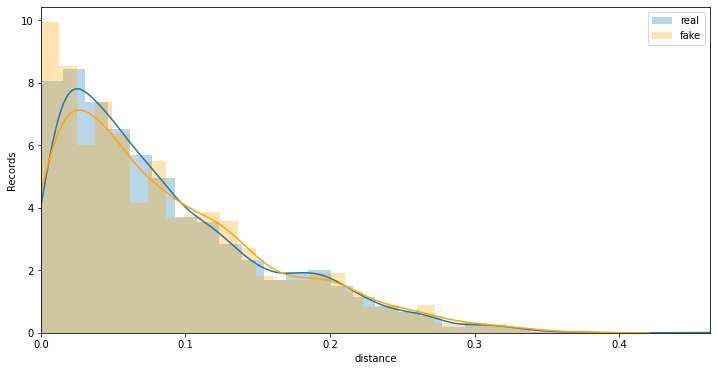

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


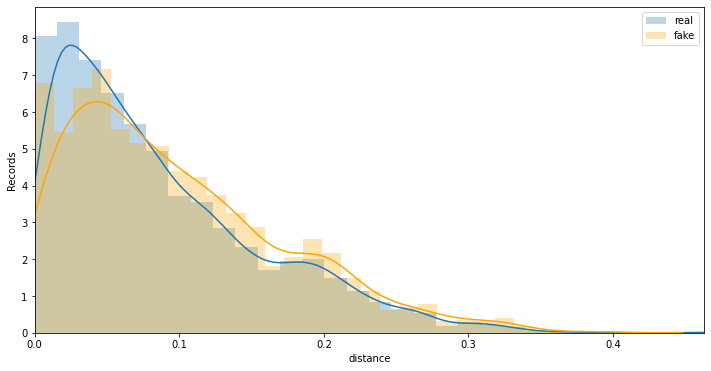

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


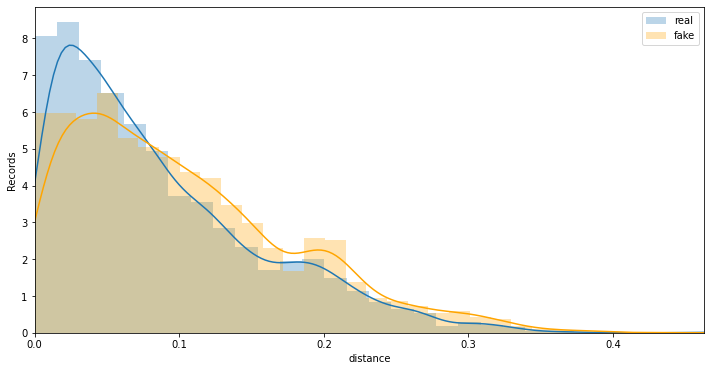

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


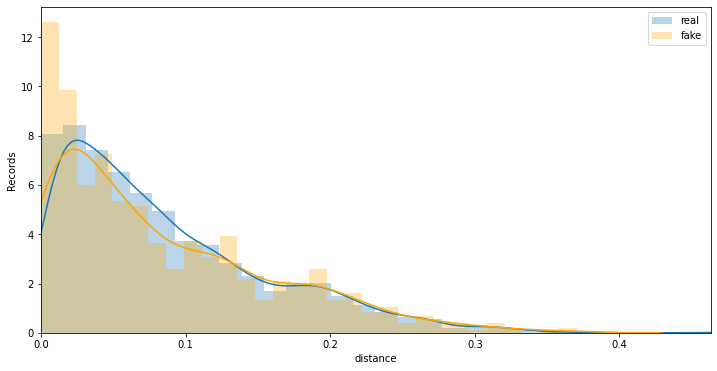

In [1592]:
plot_distance_c(real2,exp2,'') #22 tekrar
plot_distance_c(real2,exp3[exp3.distance <1],'') #14 tekrar
plot_distance_c(real2,exp5,'')#11 tekrar
plot_distance_c(real2,exp1_mb,'')

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


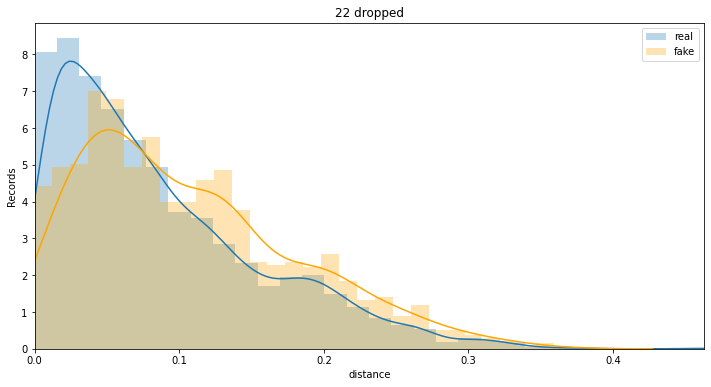

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


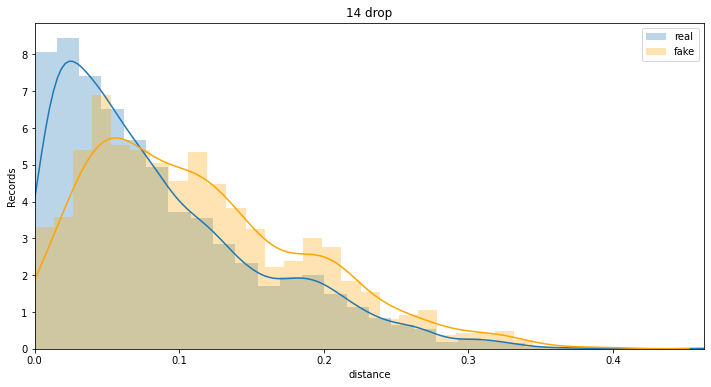

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


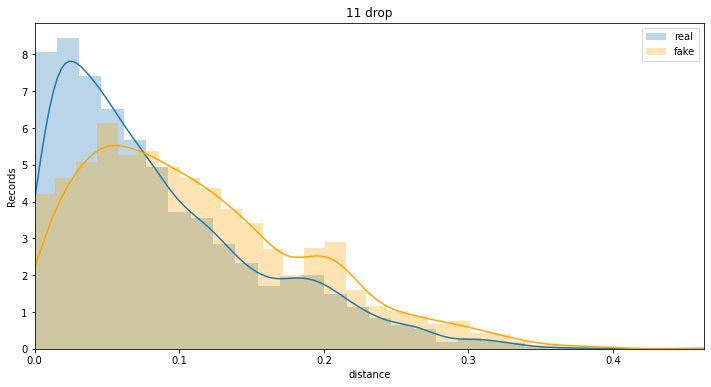

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


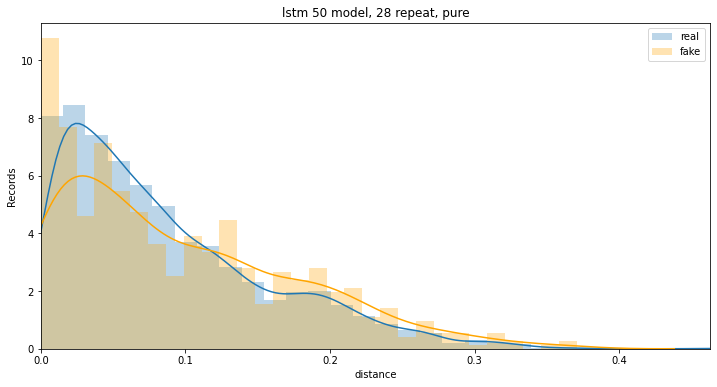

In [1591]:
plot_distance_c(real2,exp2_s,'22 dropped') 
plot_distance_c(real2,exp3_s[exp3_s.distance<1],'14 drop') 
plot_distance_c(real2,exp5_s,'11 drop')
plot_distance_c(real2,exp1_mb_s,'lstm 50 model, 28 repeat, pure')

In [1593]:
#son2512=pd.read_csv('/Users/erensmacbook/Downloads/son2512')
#exp1=pd.read_csv('/Users/erensmacbook/exp1_df.csv',index_col=0)
#exp2=pd.read_csv('/Users/erensmacbook/exp2_df.csv',index_col=0)# 0.7
#exp3=pd.read_csv('/Users/erensmacbook/exp3_df.csv',index_col=0) #08
#exp4=pd.read_csv('/Users/erensmacbook/exp4_df.csv',index_col=0) #09

#exp1_m2=pd.read_csv('/Users/erensmacbook/exp1_df_m2.csv',index_col=0) #09
#exp5=pd.read_csv('/Users/erensmacbook/exp5.csv',index_col=0) # 08 5k  - retrained model


exp2_mb=pd.read_csv('/Users/erensmacbook/exp2_mb.csv',index_col=0) # 08 5k  - retrained model


In [1594]:
#son2512=generate_merger(son2512,area_dict)
#find_max_ind(son2512)
#add_distance(son2512)
#add_sa2(son2512)

def rnn_checker(rnn):
    rnn=generate_merger(rnn,area_dict)
    find_max_ind(rnn)
    add_distance(rnn)
    
    return rnn

exp2_mb=rnn_checker(exp2_mb)

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


here000
here00
here0
here
here2


/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:118: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


here3
here4
0
100


/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/internals/blocks.py:937: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr_value = np.asarray(value)


200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600


In [1595]:
#aynimi_h = exp3[exp3.distance <1].drop_duplicates(subset=['0','1','2','3'])
#exp3

aynimi_h = exp2_mb.drop_duplicates(subset=['0','1','2','3'])

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


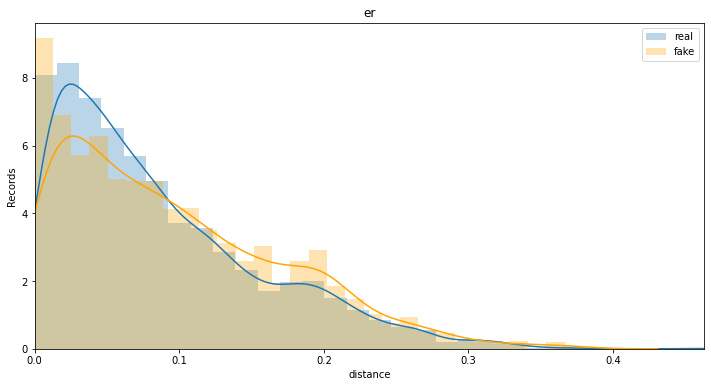

In [1602]:
plot_distance_c(real2,exp2_mb,'er')

In [1597]:
ezber=0

for i in range(len(aynimi_r)):
    xyz=aynimi_r.iloc[i]
    pr1=xyz['0']
    pr2=xyz['1']
    pr3=xyz['2']
    pr4=xyz['3']

    
    
    ezber= ezber +len(aynimi_h[ (aynimi_h['0']==int(pr1)) & (aynimi_h['1']==pr2) & (aynimi_h['2']==pr3)  & (aynimi_h['3']==pr4)      ])
    print('index' + str(i))
    print(ezber)

index0
0
index1
0
index2
0
index3
0
index4
0
index5
0
index6
0
index7
0
index8
0
index9
0
index10
0
index11
0
index12
0
index13
0
index14
0
index15
0
index16
0
index17
0
index18
0
index19
0
index20
0
index21
0
index22
0
index23
0
index24
0
index25
0
index26
0
index27
0
index28
0
index29
0
index30
0
index31
0
index32
0
index33
0
index34
1
index35
1
index36
2
index37
2
index38
2
index39
2
index40
2
index41
2
index42
2
index43
2
index44
2
index45
3
index46
3
index47
3
index48
3
index49
3
index50
3
index51
4
index52
4
index53
4
index54
4
index55
4
index56
4
index57
4
index58
4
index59
4
index60
4
index61
4
index62
4
index63
4
index64
5
index65
6
index66
6
index67
6
index68
6
index69
6
index70
6
index71
6
index72
7
index73
7
index74
7
index75
7
index76
7
index77
7
index78
7
index79
7
index80
7
index81
7
index82
7
index83
7
index84
7
index85
7
index86
7
index87
7
index88
7
index89
7
index90
7
index91
7
index92
7
index93
7
index94
7
index95
7
index96
7
index97
7
index98
7
index99
7
index100
7

index742
47
index743
47
index744
47
index745
47
index746
47
index747
48
index748
49
index749
49
index750
49
index751
49
index752
50
index753
50
index754
50
index755
50
index756
50
index757
50
index758
50
index759
50
index760
50
index761
51
index762
51
index763
51
index764
51
index765
51
index766
51
index767
51
index768
51
index769
51
index770
51
index771
51
index772
51
index773
51
index774
51
index775
51
index776
52
index777
52
index778
52
index779
52
index780
52
index781
52
index782
52
index783
52
index784
52
index785
52
index786
52
index787
52
index788
52
index789
53
index790
53
index791
53
index792
53
index793
53
index794
53
index795
53
index796
53
index797
53
index798
53
index799
53
index800
53
index801
53
index802
53
index803
53
index804
53
index805
53
index806
53
index807
53
index808
53
index809
53
index810
53
index811
53
index812
53
index813
54
index814
54
index815
54
index816
54
index817
54
index818
54
index819
54
index820
54
index821
54
index822
54
index823
54
index824
54
inde

index1449
100
index1450
100
index1451
101
index1452
101
index1453
101
index1454
102
index1455
102
index1456
102
index1457
102
index1458
102
index1459
102
index1460
102
index1461
102
index1462
102
index1463
102
index1464
102
index1465
102
index1466
102
index1467
102
index1468
102
index1469
102
index1470
102
index1471
102
index1472
102
index1473
102
index1474
102
index1475
103
index1476
104
index1477
104
index1478
104
index1479
104
index1480
105
index1481
105
index1482
105
index1483
105
index1484
105
index1485
105
index1486
106
index1487
106
index1488
106
index1489
106
index1490
106
index1491
106
index1492
106
index1493
106
index1494
107
index1495
107
index1496
107
index1497
107
index1498
107
index1499
108
index1500
108
index1501
108
index1502
108
index1503
108
index1504
108
index1505
108
index1506
108
index1507
108
index1508
108
index1509
108
index1510
108
index1511
108
index1512
108
index1513
108
index1514
108
index1515
108
index1516
109
index1517
109
index1518
109
index1519
110
index1

index2037
138
index2038
138
index2039
138
index2040
139
index2041
139
index2042
139
index2043
139
index2044
139
index2045
139
index2046
139
index2047
139
index2048
139
index2049
139
index2050
139
index2051
139
index2052
139
index2053
139
index2054
139
index2055
139
index2056
139
index2057
139
index2058
139
index2059
139
index2060
139
index2061
139
index2062
139
index2063
140
index2064
140
index2065
140
index2066
140
index2067
140
index2068
140
index2069
140
index2070
141
index2071
141
index2072
141
index2073
141
index2074
141
index2075
141
index2076
141
index2077
141
index2078
141
index2079
141
index2080
141
index2081
141
index2082
141
index2083
141
index2084
141
index2085
141
index2086
141
index2087
142
index2088
142
index2089
142
index2090
142
index2091
142
index2092
143
index2093
143
index2094
143
index2095
143
index2096
143
index2097
143
index2098
143
index2099
143
index2100
143
index2101
143
index2102
143
index2103
143
index2104
143
index2105
143
index2106
143
index2107
143
index2

index2628
181
index2629
181
index2630
181
index2631
182
index2632
182
index2633
182
index2634
182
index2635
182
index2636
182
index2637
182
index2638
182
index2639
182
index2640
182
index2641
182
index2642
182
index2643
182
index2644
183
index2645
183
index2646
183
index2647
184
index2648
184
index2649
184
index2650
184
index2651
184
index2652
184
index2653
184
index2654
184
index2655
184
index2656
184
index2657
184
index2658
184
index2659
185
index2660
186
index2661
186
index2662
186
index2663
186
index2664
186
index2665
186
index2666
186
index2667
186
index2668
186
index2669
187
index2670
187
index2671
187
index2672
187
index2673
188
index2674
188
index2675
188
index2676
188
index2677
188
index2678
188
index2679
188
index2680
188
index2681
188
index2682
188
index2683
188
index2684
189
index2685
189
index2686
189
index2687
189
index2688
189
index2689
189
index2690
189
index2691
189
index2692
190
index2693
191
index2694
191
index2695
191
index2696
191
index2697
191
index2698
191
index2

index3214
221
index3215
221
index3216
221
index3217
221
index3218
221
index3219
221
index3220
221
index3221
221
index3222
221
index3223
221
index3224
221
index3225
221
index3226
221
index3227
221
index3228
221
index3229
221
index3230
221
index3231
221
index3232
221
index3233
221
index3234
221
index3235
221
index3236
221
index3237
221
index3238
221
index3239
221
index3240
221
index3241
221
index3242
221
index3243
221
index3244
221
index3245
221
index3246
221
index3247
221
index3248
221
index3249
221
index3250
221
index3251
221
index3252
221
index3253
221
index3254
221
index3255
221
index3256
221
index3257
221
index3258
221
index3259
221
index3260
221
index3261
221
index3262
221
index3263
221
index3264
221
index3265
221
index3266
221
index3267
221
index3268
221
index3269
221
index3270
221
index3271
221
index3272
221
index3273
221
index3274
221
index3275
221
index3276
221
index3277
221
index3278
221
index3279
221
index3280
221
index3281
221
index3282
221
index3283
221
index3284
221
index3

index3804
261
index3805
261
index3806
261
index3807
261
index3808
261
index3809
261
index3810
261
index3811
261
index3812
261
index3813
262
index3814
262
index3815
262
index3816
262
index3817
262
index3818
262
index3819
262
index3820
262
index3821
262
index3822
263
index3823
263
index3824
263
index3825
263
index3826
263
index3827
263
index3828
263
index3829
263
index3830
263
index3831
263
index3832
263
index3833
263
index3834
263
index3835
264
index3836
264
index3837
264
index3838
264
index3839
264
index3840
264
index3841
264
index3842
264
index3843
264
index3844
264
index3845
264
index3846
264
index3847
264
index3848
264
index3849
264
index3850
264
index3851
264
index3852
264
index3853
264
index3854
265
index3855
265
index3856
265
index3857
265
index3858
265
index3859
265
index3860
265
index3861
265
index3862
265
index3863
265
index3864
265
index3865
265
index3866
265
index3867
265
index3868
265
index3869
265
index3870
265
index3871
265
index3872
265
index3873
265
index3874
265
index3

index4398
307
index4399
307
index4400
308
index4401
308
index4402
308
index4403
308
index4404
308
index4405
308
index4406
308
index4407
309
index4408
309
index4409
309
index4410
309
index4411
309
index4412
309
index4413
309
index4414
309
index4415
309
index4416
309
index4417
309
index4418
309
index4419
309
index4420
309
index4421
309
index4422
309
index4423
309
index4424
309
index4425
309
index4426
309
index4427
309
index4428
309
index4429
309
index4430
309
index4431
309
index4432
309
index4433
309
index4434
309
index4435
309
index4436
309
index4437
309
index4438
309
index4439
309
index4440
309
index4441
309
index4442
309
index4443
309
index4444
309
index4445
309
index4446
309
index4447
309
index4448
309
index4449
309
index4450
309
index4451
310
index4452
310
index4453
310
index4454
310
index4455
310
index4456
310
index4457
310
index4458
310
index4459
310
index4460
310
index4461
310
index4462
310
index4463
310
index4464
311
index4465
311
index4466
311
index4467
311
index4468
311
index4

In [1583]:
ezber=0
exp1_mb_s=exp1_mb.copy()

for i in range(len(aynimi_r)):
    xyz=aynimi_r.iloc[i]
    pr1=xyz['0']
    pr2=xyz['1']
    pr3=xyz['2']
    pr4=xyz['3']

      
    exp1_mb_s.drop(exp1_mb_s.loc[(exp1_mb_s['0']==pr1) & (exp1_mb_s['1']==pr2) & (exp1_mb_s['2']==pr3)& (exp1_mb_s['3']==pr4) ].index, inplace=True)

    

In [1167]:
ezber=0
saf=son2512.copy()

for i in range(len(aynimi_r)):
    xyz=aynimi_r.iloc[i]
    pr1=xyz['0']
    pr2=xyz['1']
    pr3=xyz['2']
    pr4=xyz['3']

    
    
    ezber= ezber +len(saf[ (saf['0']==pr1) & (saf['1']==pr2) & (saf['2']==pr3)        ])
    saf.drop(saf.loc[(saf['0']==pr1) & (saf['1']==pr2) & (saf['2']==pr3) ].index, inplace=True)

    
    print('index' + str(i))
    print(ezber)

index0
0
index1
0
index2
6
index3
6
index4
8
index5
9
index6
9
index7
9
index8
17
index9
25
index10
30
index11
33
index12
34
index13
35
index14
45
index15
45
index16
47
index17
63
index18
63
index19
65
index20
67
index21
109
index22
109
index23
109
index24
110
index25
116
index26
118
index27
118
index28
120
index29
120
index30
129
index31
133
index32
141
index33
141
index34
178
index35
207
index36
215
index37
215
index38
215
index39
215
index40
216
index41
216
index42
217
index43
218
index44
219
index45
219
index46
233
index47
233
index48
242
index49
242
index50
251
index51
251
index52
256
index53
260
index54
266
index55
270
index56
279
index57
279
index58
282
index59
282
index60
283
index61
289
index62
289
index63
289
index64
314
index65
340
index66
341
index67
342
index68
342
index69
374
index70
374
index71
374
index72
374
index73
374
index74
377
index75
377
index76
377
index77
377
index78
384
index79
384
index80
385
index81
385
index82
385
index83
385
index84
390
index85
390
index86

index619
2633
index620
2633
index621
2635
index622
2640
index623
2642
index624
2642
index625
2642
index626
2642
index627
2644
index628
2660
index629
2677
index630
2677
index631
2677
index632
2677
index633
2677
index634
2677
index635
2713
index636
2715
index637
2716
index638
2716
index639
2717
index640
2717
index641
2718
index642
2720
index643
2720
index644
2720
index645
2724
index646
2724
index647
2728
index648
2768
index649
2776
index650
2779
index651
2781
index652
2787
index653
2790
index654
2792
index655
2794
index656
2795
index657
2800
index658
2802
index659
2802
index660
2804
index661
2805
index662
2805
index663
2806
index664
2806
index665
2824
index666
2826
index667
2830
index668
2830
index669
2831
index670
2849
index671
2849
index672
2850
index673
2850
index674
2850
index675
2850
index676
2850
index677
2850
index678
2852
index679
2852
index680
2852
index681
2852
index682
2853
index683
2853
index684
2854
index685
2855
index686
2855
index687
2855
index688
2856
index689
2856
index6

index1197
4741
index1198
4742
index1199
4745
index1200
4745
index1201
4746
index1202
4747
index1203
4762
index1204
4764
index1205
4778
index1206
4778
index1207
4778
index1208
4779
index1209
4784
index1210
4802
index1211
4802
index1212
4802
index1213
4802
index1214
4802
index1215
4819
index1216
4836
index1217
4846
index1218
4846
index1219
4846
index1220
4846
index1221
4846
index1222
4860
index1223
4861
index1224
4878
index1225
4880
index1226
4880
index1227
4890
index1228
4890
index1229
4891
index1230
4891
index1231
4899
index1232
4901
index1233
4902
index1234
4902
index1235
4902
index1236
4905
index1237
4905
index1238
4905
index1239
4916
index1240
4921
index1241
4921
index1242
4922
index1243
4923
index1244
4926
index1245
4943
index1246
4943
index1247
4955
index1248
4957
index1249
4994
index1250
4994
index1251
4994
index1252
4995
index1253
4995
index1254
4995
index1255
4999
index1256
4999
index1257
5000
index1258
5001
index1259
5004
index1260
5010
index1261
5011
index1262
5015
index1263


index1756
7079
index1757
7079
index1758
7097
index1759
7102
index1760
7108
index1761
7122
index1762
7122
index1763
7135
index1764
7141
index1765
7170
index1766
7172
index1767
7175
index1768
7175
index1769
7175
index1770
7190
index1771
7192
index1772
7198
index1773
7198
index1774
7198
index1775
7209
index1776
7218
index1777
7227
index1778
7239
index1779
7241
index1780
7245
index1781
7250
index1782
7254
index1783
7254
index1784
7254
index1785
7258
index1786
7258
index1787
7260
index1788
7260
index1789
7263
index1790
7269
index1791
7273
index1792
7285
index1793
7285
index1794
7287
index1795
7287
index1796
7288
index1797
7297
index1798
7297
index1799
7297
index1800
7298
index1801
7298
index1802
7302
index1803
7304
index1804
7306
index1805
7306
index1806
7315
index1807
7316
index1808
7332
index1809
7338
index1810
7343
index1811
7343
index1812
7348
index1813
7348
index1814
7348
index1815
7353
index1816
7366
index1817
7366
index1818
7367
index1819
7367
index1820
7368
index1821
7368
index1822


index2308
9379
index2309
9379
index2310
9396
index2311
9396
index2312
9439
index2313
9439
index2314
9440
index2315
9462
index2316
9462
index2317
9468
index2318
9468
index2319
9469
index2320
9469
index2321
9469
index2322
9470
index2323
9470
index2324
9472
index2325
9476
index2326
9476
index2327
9476
index2328
9477
index2329
9477
index2330
9477
index2331
9482
index2332
9483
index2333
9490
index2334
9505
index2335
9530
index2336
9532
index2337
9532
index2338
9536
index2339
9575
index2340
9575
index2341
9589
index2342
9589
index2343
9597
index2344
9597
index2345
9597
index2346
9603
index2347
9606
index2348
9625
index2349
9627
index2350
9628
index2351
9629
index2352
9630
index2353
9635
index2354
9655
index2355
9669
index2356
9677
index2357
9677
index2358
9678
index2359
9679
index2360
9723
index2361
9723
index2362
9723
index2363
9724
index2364
9729
index2365
9729
index2366
9730
index2367
9731
index2368
9734
index2369
9734
index2370
9737
index2371
9737
index2372
9737
index2373
9738
index2374


index2829
12026
index2830
12031
index2831
12032
index2832
12040
index2833
12048
index2834
12055
index2835
12070
index2836
12071
index2837
12073
index2838
12079
index2839
12082
index2840
12088
index2841
12091
index2842
12097
index2843
12099
index2844
12100
index2845
12102
index2846
12106
index2847
12107
index2848
12107
index2849
12107
index2850
12107
index2851
12107
index2852
12135
index2853
12136
index2854
12150
index2855
12150
index2856
12156
index2857
12165
index2858
12166
index2859
12167
index2860
12170
index2861
12170
index2862
12172
index2863
12172
index2864
12175
index2865
12176
index2866
12176
index2867
12176
index2868
12176
index2869
12180
index2870
12185
index2871
12185
index2872
12185
index2873
12190
index2874
12191
index2875
12191
index2876
12191
index2877
12191
index2878
12195
index2879
12242
index2880
12259
index2881
12260
index2882
12260
index2883
12261
index2884
12262
index2885
12265
index2886
12265
index2887
12284
index2888
12285
index2889
12286
index2890
12287
index289

index3350
14223
index3351
14225
index3352
14226
index3353
14227
index3354
14227
index3355
14227
index3356
14227
index3357
14231
index3358
14240
index3359
14267
index3360
14293
index3361
14293
index3362
14294
index3363
14294
index3364
14314
index3365
14314
index3366
14315
index3367
14324
index3368
14332
index3369
14336
index3370
14342
index3371
14344
index3372
14346
index3373
14368
index3374
14370
index3375
14371
index3376
14371
index3377
14371
index3378
14371
index3379
14371
index3380
14379
index3381
14379
index3382
14385
index3383
14389
index3384
14390
index3385
14390
index3386
14390
index3387
14392
index3388
14408
index3389
14413
index3390
14413
index3391
14414
index3392
14415
index3393
14418
index3394
14423
index3395
14429
index3396
14429
index3397
14429
index3398
14432
index3399
14437
index3400
14438
index3401
14442
index3402
14444
index3403
14448
index3404
14465
index3405
14466
index3406
14477
index3407
14477
index3408
14482
index3409
14482
index3410
14485
index3411
14487
index341

index3874
16605
index3875
16606
index3876
16613
index3877
16625
index3878
16627
index3879
16627
index3880
16632
index3881
16638
index3882
16641
index3883
16642
index3884
16642
index3885
16642
index3886
16642
index3887
16642
index3888
16646
index3889
16648
index3890
16648
index3891
16648
index3892
16650
index3893
16650
index3894
16653
index3895
16653
index3896
16724
index3897
16724
index3898
16732
index3899
16732
index3900
16732
index3901
16740
index3902
16740
index3903
16740
index3904
16740
index3905
16740
index3906
16741
index3907
16751
index3908
16751
index3909
16753
index3910
16758
index3911
16761
index3912
16761
index3913
16761
index3914
16765
index3915
16765
index3916
16766
index3917
16766
index3918
16766
index3919
16771
index3920
16771
index3921
16773
index3922
16777
index3923
16793
index3924
16810
index3925
16818
index3926
16819
index3927
16848
index3928
16852
index3929
16855
index3930
16864
index3931
16864
index3932
16864
index3933
16870
index3934
16873
index3935
16874
index393

index4392
19159
index4393
19160
index4394
19161
index4395
19169
index4396
19202
index4397
19204
index4398
19209
index4399
19258
index4400
19258
index4401
19259
index4402
19259
index4403
19260
index4404
19260
index4405
19260
index4406
19278
index4407
19283
index4408
19283
index4409
19293
index4410
19296
index4411
19298
index4412
19299
index4413
19300
index4414
19300
index4415
19301
index4416
19308
index4417
19309
index4418
19309
index4419
19310
index4420
19310
index4421
19330
index4422
19332
index4423
19332
index4424
19332
index4425
19334
index4426
19334
index4427
19347
index4428
19347
index4429
19347
index4430
19350
index4431
19353
index4432
19355
index4433
19355
index4434
19356
index4435
19359
index4436
19370
index4437
19372
index4438
19372
index4439
19375
index4440
19375
index4441
19378
index4442
19385
index4443
19385
index4444
19385
index4445
19385
index4446
19385
index4447
19385
index4448
19389
index4449
19389
index4450
19389
index4451
19419
index4452
19419
index4453
19469
index445

index4910
21185
index4911
21198
index4912
21203
index4913
21203
index4914
21203
index4915
21203
index4916
21205
index4917
21207
index4918
21209
index4919
21209
index4920
21210
index4921
21210
index4922
21211
index4923
21214
index4924
21223
index4925
21234
index4926
21234
index4927
21244
index4928
21245
index4929
21246
index4930
21247
index4931
21247
index4932
21247
index4933
21247
index4934
21263
index4935
21274
index4936
21278
index4937
21278
index4938
21278
index4939
21278
index4940
21278
index4941
21281
index4942
21282
index4943
21330
index4944
21341
index4945
21351
index4946
21352
index4947
21352
index4948
21359
index4949
21373
index4950
21373
index4951
21373
index4952
21375
index4953
21376
index4954
21392
index4955
21392
index4956
21393
index4957
21396
index4958
21397
index4959
21398
index4960
21398
index4961
21398
index4962
21398
index4963
21401
index4964
21401
index4965
21402
index4966
21407
index4967
21407
index4968
21407
index4969
21411
index4970
21412
index4971
21412
index497

In [1178]:
ezber=0
for i in range(len(aynimi_r)):
    xyz=aynimi_r.iloc[i]
    pr1=xyz['0']
    pr2=xyz['1']
    pr3=xyz['2']
    pr4=xyz['3']

    
    
    ezber= ezber +len(saf[ (saf['0']==pr1) & (saf['1']==pr2) & (saf['2']==pr3)        ])
    
    print('index' + str(i))
    print(ezber)

index0
0
index1
0
index2
0
index3
0
index4
0
index5
0
index6
0
index7
0
index8
0
index9
0
index10
0
index11
0
index12
0
index13
0
index14
0
index15
0
index16
0
index17
0
index18
0
index19
0
index20
0
index21
0
index22
0
index23
0
index24
0
index25
0
index26
0
index27
0
index28
0
index29
0
index30
0
index31
0
index32
0
index33
0
index34
0
index35
0
index36
0
index37
0
index38
0
index39
0
index40
0
index41
0
index42
0
index43
0
index44
0
index45
0
index46
0
index47
0
index48
0
index49
0
index50
0
index51
0
index52
0
index53
0
index54
0
index55
0
index56
0
index57
0
index58
0
index59
0
index60
0
index61
0
index62
0
index63
0
index64
0
index65
0
index66
0
index67
0
index68
0
index69
0
index70
0
index71
0
index72
0
index73
0
index74
0
index75
0
index76
0
index77
0
index78
0
index79
0
index80
0
index81
0
index82
0
index83
0
index84
0
index85
0
index86
0
index87
0
index88
0
index89
0
index90
0
index91
0
index92
0
index93
0
index94
0
index95
0
index96
0
index97
0
index98
0
index99
0
index100
0

index822
0
index823
0
index824
0
index825
0
index826
0
index827
0
index828
0
index829
0
index830
0
index831
0
index832
0
index833
0
index834
0
index835
0
index836
0
index837
0
index838
0
index839
0
index840
0
index841
0
index842
0
index843
0
index844
0
index845
0
index846
0
index847
0
index848
0
index849
0
index850
0
index851
0
index852
0
index853
0
index854
0
index855
0
index856
0
index857
0
index858
0
index859
0
index860
0
index861
0
index862
0
index863
0
index864
0
index865
0
index866
0
index867
0
index868
0
index869
0
index870
0
index871
0
index872
0
index873
0
index874
0
index875
0
index876
0
index877
0
index878
0
index879
0
index880
0
index881
0
index882
0
index883
0
index884
0
index885
0
index886
0
index887
0
index888
0
index889
0
index890
0
index891
0
index892
0
index893
0
index894
0
index895
0
index896
0
index897
0
index898
0
index899
0
index900
0
index901
0
index902
0
index903
0
index904
0
index905
0
index906
0
index907
0
index908
0
index909
0
index910
0
index911
0
index912
0

index1547
0
index1548
0
index1549
0
index1550
0
index1551
0
index1552
0
index1553
0
index1554
0
index1555
0
index1556
0
index1557
0
index1558
0
index1559
0
index1560
0
index1561
0
index1562
0
index1563
0
index1564
0
index1565
0
index1566
0
index1567
0
index1568
0
index1569
0
index1570
0
index1571
0
index1572
0
index1573
0
index1574
0
index1575
0
index1576
0
index1577
0
index1578
0
index1579
0
index1580
0
index1581
0
index1582
0
index1583
0
index1584
0
index1585
0
index1586
0
index1587
0
index1588
0
index1589
0
index1590
0
index1591
0
index1592
0
index1593
0
index1594
0
index1595
0
index1596
0
index1597
0
index1598
0
index1599
0
index1600
0
index1601
0
index1602
0
index1603
0
index1604
0
index1605
0
index1606
0
index1607
0
index1608
0
index1609
0
index1610
0
index1611
0
index1612
0
index1613
0
index1614
0
index1615
0
index1616
0
index1617
0
index1618
0
index1619
0
index1620
0
index1621
0
index1622
0
index1623
0
index1624
0
index1625
0
index1626
0
index1627
0
index1628
0
index1629
0
inde

index2257
0
index2258
0
index2259
0
index2260
0
index2261
0
index2262
0
index2263
0
index2264
0
index2265
0
index2266
0
index2267
0
index2268
0
index2269
0
index2270
0
index2271
0
index2272
0
index2273
0
index2274
0
index2275
0
index2276
0
index2277
0
index2278
0
index2279
0
index2280
0
index2281
0
index2282
0
index2283
0
index2284
0
index2285
0
index2286
0
index2287
0
index2288
0
index2289
0
index2290
0
index2291
0
index2292
0
index2293
0
index2294
0
index2295
0
index2296
0
index2297
0
index2298
0
index2299
0
index2300
0
index2301
0
index2302
0
index2303
0
index2304
0
index2305
0
index2306
0
index2307
0
index2308
0
index2309
0
index2310
0
index2311
0
index2312
0
index2313
0
index2314
0
index2315
0
index2316
0
index2317
0
index2318
0
index2319
0
index2320
0
index2321
0
index2322
0
index2323
0
index2324
0
index2325
0
index2326
0
index2327
0
index2328
0
index2329
0
index2330
0
index2331
0
index2332
0
index2333
0
index2334
0
index2335
0
index2336
0
index2337
0
index2338
0
index2339
0
inde

index2941
0
index2942
0
index2943
0
index2944
0
index2945
0
index2946
0
index2947
0
index2948
0
index2949
0
index2950
0
index2951
0
index2952
0
index2953
0
index2954
0
index2955
0
index2956
0
index2957
0
index2958
0
index2959
0
index2960
0
index2961
0
index2962
0
index2963
0
index2964
0
index2965
0
index2966
0
index2967
0
index2968
0
index2969
0
index2970
0
index2971
0
index2972
0
index2973
0
index2974
0
index2975
0
index2976
0
index2977
0
index2978
0
index2979
0
index2980
0
index2981
0
index2982
0
index2983
0
index2984
0
index2985
0
index2986
0
index2987
0
index2988
0
index2989
0
index2990
0
index2991
0
index2992
0
index2993
0
index2994
0
index2995
0
index2996
0
index2997
0
index2998
0
index2999
0
index3000
0
index3001
0
index3002
0
index3003
0
index3004
0
index3005
0
index3006
0
index3007
0
index3008
0
index3009
0
index3010
0
index3011
0
index3012
0
index3013
0
index3014
0
index3015
0
index3016
0
index3017
0
index3018
0
index3019
0
index3020
0
index3021
0
index3022
0
index3023
0
inde

index3651
0
index3652
0
index3653
0
index3654
0
index3655
0
index3656
0
index3657
0
index3658
0
index3659
0
index3660
0
index3661
0
index3662
0
index3663
0
index3664
0
index3665
0
index3666
0
index3667
0
index3668
0
index3669
0
index3670
0
index3671
0
index3672
0
index3673
0
index3674
0
index3675
0
index3676
0
index3677
0
index3678
0
index3679
0
index3680
0
index3681
0
index3682
0
index3683
0
index3684
0
index3685
0
index3686
0
index3687
0
index3688
0
index3689
0
index3690
0
index3691
0
index3692
0
index3693
0
index3694
0
index3695
0
index3696
0
index3697
0
index3698
0
index3699
0
index3700
0
index3701
0
index3702
0
index3703
0
index3704
0
index3705
0
index3706
0
index3707
0
index3708
0
index3709
0
index3710
0
index3711
0
index3712
0
index3713
0
index3714
0
index3715
0
index3716
0
index3717
0
index3718
0
index3719
0
index3720
0
index3721
0
index3722
0
index3723
0
index3724
0
index3725
0
index3726
0
index3727
0
index3728
0
index3729
0
index3730
0
index3731
0
index3732
0
index3733
0
inde

index4353
0
index4354
0
index4355
0
index4356
0
index4357
0
index4358
0
index4359
0
index4360
0
index4361
0
index4362
0
index4363
0
index4364
0
index4365
0
index4366
0
index4367
0
index4368
0
index4369
0
index4370
0
index4371
0
index4372
0
index4373
0
index4374
0
index4375
0
index4376
0
index4377
0
index4378
0
index4379
0
index4380
0
index4381
0
index4382
0
index4383
0
index4384
0
index4385
0
index4386
0
index4387
0
index4388
0
index4389
0
index4390
0
index4391
0
index4392
0
index4393
0
index4394
0
index4395
0
index4396
0
index4397
0
index4398
0
index4399
0
index4400
0
index4401
0
index4402
0
index4403
0
index4404
0
index4405
0
index4406
0
index4407
0
index4408
0
index4409
0
index4410
0
index4411
0
index4412
0
index4413
0
index4414
0
index4415
0
index4416
0
index4417
0
index4418
0
index4419
0
index4420
0
index4421
0
index4422
0
index4423
0
index4424
0
index4425
0
index4426
0
index4427
0
index4428
0
index4429
0
index4430
0
index4431
0
index4432
0
index4433
0
index4434
0
index4435
0
inde

In [1210]:
real2[ (real2['0']==30501110703) & (real2['1']==30501111001) & (real2['2']==30501110703	)        ]


,0,1,2,3,INDUSTRY,geo_0,geo_1,geo_2,geo_3,xo_0,...,pt_1,pt_2,pt_3,distance01,distance02,distance03,d_point,o_point,orig_sa,distance


/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/inference.py:383: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/inference.py:384: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/io/formats/printing.py:118: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq

,0,1,2,3,INDUSTRY,geo_0,geo_1,geo_2,geo_3,xo_0,...,pt_1,pt_2,pt_3,distance01,distance02,distance03,d_point,o_point,orig_sa,distance
0,30403109418,30501110537,30501111032,0,utilities,POLYGON ((152.96149103624174 -27.5079184488846...,POLYGON ((153.0287520335116 -27.47225645534667...,POLYGON ((153.01363602539067 -27.4702204438134...,0,152.963191,...,POINT (153.02895732859386 -27.471429470360864),POINT (153.01672848488312 -27.47182194415523),POINT (0 0),0.075698,0.065130,0.000000,POINT (153.02895732859386 -27.471429470360864),POINT (152.9631905458976 -27.50891119382392),30403109418,0.075698
1,30103101509,30502111409,30301104813,30502111409,construction,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.05510619312102 -27.4529594278412...,POLYGON ((153.10010254588252 -27.4720558225183...,POLYGON ((153.05510619312102 -27.4529594278412...,153.185363,...,POINT (153.05565602807354 -27.453836412982056),POINT (153.10141364066993 -27.47196749720395),POINT (153.05565602807354 -27.453836412982056),0.129817,0.087169,0.129817,POINT (153.05565602807354 -27.453836412982056),POINT (153.18536318478198 -27.448497745911425),30103101509,0.129817
2,30103101509,30103101601,30103101509,30103101511,professional,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.14640772074165 -27.4734434671953...,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.18684102893224 -27.4535574511192...,153.185363,...,POINT (153.15035601544056 -27.47236693278313),POINT (153.18536318478198 -27.448497745911425),POINT (153.19065049851488 -27.456354331553953),0.042370,0.000000,0.009470,POINT (153.15035601544056 -27.47236693278313),POINT (153.18536318478198 -27.448497745911425),30103101509,0.042370
3,30103101509,30303106043,30103101601,30103101509,professional,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.10182401085606 -27.5892034636171...,POLYGON ((153.14640772074165 -27.4734434671953...,POLYGON ((153.1832361800535 -27.44776325070925...,153.185363,...,POINT (153.10571280042313 -27.587604314137188),POINT (153.15035601544056 -27.47236693278313),POINT (153.18536318478198 -27.448497745911425),0.160296,0.042370,0.000000,POINT (153.10571280042313 -27.587604314137188),POINT (153.18536318478198 -27.448497745911425),30103101509,0.160296
4,30103101509,30303106525,30103101509,0,wholesale,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.0802120072874 -27.55683345118654...,POLYGON ((153.1832361800535 -27.44776325070925...,0,153.185363,...,POINT (153.08257459701673 -27.55829044618548),POINT (153.18536318478198 -27.448497745911425),POINT (0 0),0.150399,0.000000,0.000000,POINT (153.08257459701673 -27.55829044618548),POINT (153.18536318478198 -27.448497745911425),30103101509,0.150399
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5351,30103101509,30103102002,30103101401,30103101509,other,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.17629191058552 -27.4494294600211...,(POLYGON ((153.1885497854146 -27.4010232808760...,POLYGON ((153.1832361800535 -27.44776325070925...,153.185363,...,POINT (153.17884218527877 -27.449999850344987),POINT (153.16887062893895 -27.394003493542613),POINT (153.18536318478198 -27.448497745911425),0.006692,0.056935,0.000000,POINT (153.16887062893895 -27.394003493542613),POINT (153.18536318478198 -27.448497745911425),30103101509,0.056935
5352,30103101509,30103101505,30103101509,30103102031,realEstate,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.1846028486883 -27.45736746092326...,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.17560286113016 -27.4457175099222...,153.185363,...,POINT (153.18398603364136 -27.45844482095744),POINT (153.18536318478198 -27.448497745911425),POINT (153.173504791303 -27.445959484731432),0.010042,0.000000,0.012127,POINT (153.173504791303 -27.445959484731432),POINT (153.18536318478198 -27.448497745911425),30103101509,0.012127
5353,30103101509,30103102031,30103101509,30103101519,education

In [1188]:
saf[ (saf['0']==30501110703) & (saf['1']==30501111001) & (saf['2']==30501110703)        ]

,AGEGROUP,SEX,INDUSTRY,xo_c,yo_c,xd_c,yd_c,indexes,dest_sa,orig_sa,...,pt_0,pt_1,pt_2,pt_3,distance01,distance02,distance03,d_point,o_point,distance
1,9,male,it,153.022242,-27.492665,153.169598,-27.506612,2967,30102100903,30501110703,...,POINT (153.01451258816073 -27.486053908960574),POINT (153.02734085703267 -27.485203290163916),POINT (153.01451258816073 -27.486053908960574),POINT (153.30049280194712 -27.608914388825525),0.012856,0.0,0.311255,POINT (153.30049280194712 -27.608914388825525),POINT (153.01451258816073 -27.486053908960574),0.311255
25407,8,male,other,153.300432,-27.523688,152.970730,-27.466193,1229,30501111001,30501110703,...,POINT (153.01451258816073 -27.486053908960574),POINT (153.02734085703267 -27.485203290163916),POINT (153.01451258816073 -27.486053908960574),POINT (153.01787602912776 -27.476597419287415),0.012856,0.0,0.010037,POINT (153.02734085703267 -27.485203290163916),POINT (153.01451258816073 -27.486053908960574),0.012856
26676,8,female,professional,153.026863,-27.449352,153.281579,-27.507552,4013,30501111001,30501110703,...,POINT (153.01451258816073 -27.486053908960574),POINT (153.02734085703267 -27.485203290163916),POINT (153.01451258816073 -27.486053908960574),POINT (0 0),0.012856,0.0,0.000000,POINT (153.02734085703267 -27.485203290163916),POINT (153.01451258816073 -27.486053908960574),0.012856
42225,8,male,financial,153.026073,-27.564152,153.249174,-27.465077,2788,30102100729,30501110703,...,POINT (153.01451258816073 -27.486053908960574),POINT (153.02734085703267 -27.485203290163916),POINT (153.01451258816073 -27.486053908960574),POINT (153.24831500080342 -27.54291096319236),0.012856,0.0,0.240616,POINT (153.24831500080342 -27.54291096319236),POINT (153.01451258816073 -27.486053908960574),0.240616
43129,13,male,financial,153.004100,-27.598620,153.026104,-27.372942,9193,30501111001,30501110703,...,POINT (153.01451258816073 -27.486053908960574),POINT (153.02734085703267 -27.485203290163916),POINT (153.01451258816073 -27.486053908960574),POINT (153.01451258816073 -27.486053908960574),0.012856,0.0,0.000000,POINT (153.02734085703267 -27.485203290163916),POINT (153.01451258816073 -27.486053908960574),0.012856


In [1191]:
saf

,AGEGROUP,SEX,INDUSTRY,xo_c,yo_c,xd_c,yd_c,indexes,dest_sa,orig_sa,...,pt_0,pt_1,pt_2,pt_3,distance01,distance02,distance03,d_point,o_point,distance
1,9,male,it,153.022242,-27.492665,153.169598,-27.506612,2967,30102100903,30501110703,...,POINT (153.01451258816073 -27.486053908960574),POINT (153.02734085703267 -27.485203290163916),POINT (153.01451258816073 -27.486053908960574),POINT (153.30049280194712 -27.608914388825525),0.012856,0.000000,0.311255,POINT (153.30049280194712 -27.608914388825525),POINT (153.01451258816073 -27.486053908960574),0.311255
2,8,female,transport,153.134609,-27.446796,153.218711,-27.507552,7791,30101100323,30301105124,...,POINT (153.11043819007398 -27.50974827374121),POINT (153.07799246913413 -27.46499792017299),POINT (153.2198948544265 -27.500291704940295),POINT (0 0),0.055275,0.109864,0.000000,POINT (153.2198948544265 -27.500291704940295),POINT (153.11043819007398 -27.50974827374121),0.109864
3,8,male,retail,152.939210,-27.493725,153.101423,-27.550502,10248,30502111412,30101100102,...,POINT (153.22419748824257 -27.545338260661453),POINT (153.0589115731209 -27.449731938199026),POINT (153.22419748824257 -27.545338260661453),POINT (0 0),0.190945,0.000000,0.000000,POINT (153.0589115731209 -27.449731938199026),POINT (153.22419748824257 -27.545338260661453),0.190945
11,5,male,transport,153.233986,-27.327625,153.268782,-27.497236,4445,30501110508,30503112904,...,POINT (153.01763308975626 -27.431143443904602),POINT (153.03012362440634 -27.463653460522668),POINT (153.01763308975626 -27.431143443904602),POINT (0 0),0.034827,0.000000,0.000000,POINT (153.03012362440634 -27.463653460522668),POINT (153.01763308975626 -27.431143443904602),0.034827
13,13,female,publicAdmin,153.026072,-27.449921,153.225347,-27.486701,9810,30201102424,30202102821,...,POINT (153.02857413446043 -27.38464491965326),POINT (153.0076535401828 -27.35714544729626),POINT (153.02857413446043 -27.38464491965326),POINT (0 0),0.034553,0.000000,0.000000,POINT (153.0076535401828 -27.35714544729626),POINT (153.02857413446043 -27.38464491965326),0.034553
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47994,12,female,other,153.272380,-27.490789,153.032954,-27.450335,5316,30402108910,30403109402,...,POINT (152.96213708265685 -27.497155448946643),POINT (152.9668669130039 -27.532843954613426),POINT (152.96213708265685 -27.497155448946643),POINT (152.93769405399777 -27.503516921352578),0.036001,0.000000,0.025257,POINT (152.9668669130039 -27.532843954613426),POINT (152.96213708265685 -27.497155448946643),0.036001
47995,15,female,transport,153.168871,-27.445015,153.034263,-27.412661,8176,30302105204,30302105323,...,POINT (153.06366664163644 -27.496915434067404),POINT (153.0366023446027 -27.498852851304072),POINT (153.03547752795572 -27.50981296135838),POINT (153.06366664163644 -27.496915434067404),0.027134,0.031000,0.000000,POINT (153.03547752795572 -27.50981296135838),POINT (153.06366664163644 -27.496915434067404),0.031000
47996,13,male,education,153.037577,-27.521833,153.040732,-27.483660,10334,30401108405,30401108402,...,POINT (152.95597091591122 -27.555441093681935),POINT (152.95145148128307 -27.55590793332756),POINT (152.95597091591122 -27.555441093681935),POINT (0 0),0.004543,0.000000,0.000000,POINT (152.95145148128307 -27.55590793332756),POINT (152.95597091591122 -27.555441093681935),0.004543
47997,7,male,retail,153.108712,-27.493945,152.977939,-27.549388,8680,30302105408,30302105224,...,POINT (153.027726022286 -27.521868460671328),POINT (153.02888256549855 -27.495943805467704),POINT (153.027726022286 -27.521868460671328),POINT (0 0),0.025950,0.000000,0.000000,POINT (153.02888256549855 -27.495943805467704),POINT (153.027726022286 -27.521868460671328),0.025950


In [940]:
test_list = rnn_sample_5.values.tolist()[i]
test_list = [i for i in test_list if i != 0]
res = [idx for idx, val in enumerate(test_list) if val in test_list[:idx]]
list3 = [x for x in res if x != []]
list3

[2]

In [943]:
check_repeats_rnn=[]
check_repeats_reals=[]

for i in range(len(rnn_sample_5.sample(25000))):
    test_list = rnn_sample_5.sample(25000).values.tolist()[i]
    test_list = [i for i in test_list if i != 0]

    
    res = [idx for idx, val in enumerate(test_list) if val in test_list[:idx]]
    list3 = [x for x in res if x != []]
    #list2 = filter(None,res)

    print(i)
    check_repeats_rnn.append(list3)
    
    
for i in range(len(real2)):
    test_list = real2.values.tolist()[i]
    test_list = [i for i in test_list if i != 0]

    
    res = [idx for idx, val in enumerate(test_list) if val in test_list[:idx]]
    list3 = [x for x in res if x != []]
    #list2 = filter(None,res)


    check_repeats_reals.append(list3)
    
repeated_rnn = [x for x in check_repeats_rnn if x != []] 
repeated_reals = [x for x in check_repeats_reals if x != []] 

print(len(repeated_rnn))
print(len(repeated_reals))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

KeyboardInterrupt: 

In [1010]:
xyz=real2.iloc[i]
pr1=int(xyz['0'])
pr2=int(xyz['1'])
pr3=int(xyz['2'])
pr4=int(xyz['3'])

pr1

30302105801

In [1013]:
ezber=0

for i in range(len(real2)):
    xyz=real2.iloc[i]
    pr1=str(xyz['0'])
    pr2=str(xyz['1'])
    pr3=str(xyz['2'])
    pr4=str(xyz['3'])

    
    
    ezber= ezber +len(real2[ (real2['0']==pr1) & (real2['1']==pr2) & 
                                    (real2['2']==pr3)   ])
    print(i)
    print(ezber)


0
1
1
2
2
3
3
3
4
4
5
5
6
6
7
7
8
8
9
9
10
10
11
11
12
12
13
13
14
14
15
15
16
16
17
17
18
18
19
19
20
21
21
23
22
24
23
25
24
26
25
27
26
28
27
29
28
30
29
32
30
34
31
35
32
36
33
37
34
38
35
39
36
40
37
41
38
43
39
45
40
46
41
47
42
48
43
49
44
50
45
51
46
52
47
53
48
54
49
55
50
56
51
60
52
61
53
65
54
69
55
71
56
72
57
73
58
74
59
75
60
76
61
77
62
78
63
79
64
80
65
81
66
82
67
85
68
88
69
91
70
92
71
94
72
96
73
97
74
98
75
99
76
102
77
105
78
105
79
105
80
105
81
106
82
107
83
108
84
109
85
110
86
111
87
112
88
113
89
114
90
115
91
116
92
117
93
118
94
119
95
120
96
121
97
122
98
123
99
125
100
127
101
128
102
131
103
132
104
133
105
134
106
136
107
138
108
139
109
140
110
141
111
142
112
143
113
144
114
145
115
146
116
147
117
148
118
149
119
149
120
150
121
150
122
151
123
152
124
153
125
154
126
155
127
156
128
157
129
157
130
158
131
159
132
160
133
161
134
162
135
163
136
164
137
165
138
166
139
167
140
168
141
169
142
172
143
175
144
178
145
179
146
180
147
181
148
182
149


1030
1278
1031
1282
1032
1286
1033
1287
1034
1288
1035
1289
1036
1290
1037
1291
1038
1292
1039
1293
1040
1295
1041
1296
1042
1297
1043
1298
1044
1299
1045
1300
1046
1301
1047
1302
1048
1304
1049
1305
1050
1306
1051
1307
1052
1308
1053
1309
1054
1310
1055
1311
1056
1312
1057
1313
1058
1314
1059
1315
1060
1318
1061
1319
1062
1320
1063
1320
1064
1322
1065
1323
1066
1324
1067
1325
1068
1325
1069
1326
1070
1327
1071
1329
1072
1331
1073
1332
1074
1333
1075
1334
1076
1335
1077
1337
1078
1339
1079
1340
1080
1341
1081
1342
1082
1343
1083
1344
1084
1344
1085
1345
1086
1346
1087
1347
1088
1348
1089
1349
1090
1350
1091
1351
1092
1351
1093
1352
1094
1353
1095
1354
1096
1355
1097
1356
1098
1357
1099
1358
1100
1359
1101
1361
1102
1363
1103
1364
1104
1365
1105
1367
1106
1369
1107
1370
1108
1371
1109
1372
1110
1373
1111
1374
1112
1375
1113
1375
1114
1375
1115
1376
1116
1377
1117
1378
1118
1379
1119
1380
1120
1381
1121
1381
1122
1382
1123
1382
1124
1383
1125
1384
1126
1386
1127
1387
1128
1388
1129
1389


1858
2322
1859
2323
1860
2324
1861
2325
1862
2326
1863
2329
1864
2332
1865
2333
1866
2334
1867
2335
1868
2336
1869
2337
1870
2340
1871
2343
1872
2344
1873
2345
1874
2346
1875
2347
1876
2348
1877
2349
1878
2350
1879
2351
1880
2352
1881
2353
1882
2354
1883
2355
1884
2356
1885
2357
1886
2358
1887
2359
1888
2360
1889
2361
1890
2362
1891
2363
1892
2364
1893
2365
1894
2366
1895
2367
1896
2368
1897
2369
1898
2370
1899
2371
1900
2371
1901
2372
1902
2373
1903
2374
1904
2375
1905
2378
1906
2381
1907
2384
1908
2385
1909
2386
1910
2387
1911
2388
1912
2389
1913
2390
1914
2391
1915
2392
1916
2393
1917
2394
1918
2395
1919
2396
1920
2397
1921
2398
1922
2399
1923
2401
1924
2403
1925
2404
1926
2405
1927
2406
1928
2407
1929
2410
1930
2411
1931
2412
1932
2413
1933
2414
1934
2415
1935
2416
1936
2417
1937
2418
1938
2419
1939
2422
1940
2425
1941
2426
1942
2427
1943
2428
1944
2429
1945
2430
1946
2432
1947
2434
1948
2437
1949
2438
1950
2439
1951
2440
1952
2441
1953
2443
1954
2445
1955
2446
1956
2447
1957
2449


2687
3419
2688
3420
2689
3421
2690
3422
2691
3423
2692
3424
2693
3425
2694
3426
2695
3427
2696
3429
2697
3431
2698
3432
2699
3433
2700
3434
2701
3435
2702
3436
2703
3437
2704
3437
2705
3438
2706
3438
2707
3439
2708
3439
2709
3440
2710
3441
2711
3442
2712
3443
2713
3444
2714
3445
2715
3446
2716
3447
2717
3448
2718
3449
2719
3450
2720
3451
2721
3452
2722
3453
2723
3454
2724
3454
2725
3455
2726
3456
2727
3457
2728
3458
2729
3459
2730
3460
2731
3461
2732
3462
2733
3463
2734
3464
2735
3465
2736
3466
2737
3467
2738
3468
2739
3469
2740
3470
2741
3471
2742
3472
2743
3473
2744
3474
2745
3475
2746
3476
2747
3477
2748
3478
2749
3479
2750
3480
2751
3481
2752
3482
2753
3483
2754
3484
2755
3485
2756
3486
2757
3487
2758
3488
2759
3489
2760
3490
2761
3491
2762
3492
2763
3493
2764
3494
2765
3495
2766
3496
2767
3496
2768
3497
2769
3498
2770
3499
2771
3500
2772
3501
2773
3502
2774
3503
2775
3504
2776
3505
2777
3506
2778
3507
2779
3508
2780
3509
2781
3510
2782
3511
2783
3512
2784
3512
2785
3513
2786
3514


3519
4419
3520
4420
3521
4421
3522
4422
3523
4423
3524
4423
3525
4424
3526
4424
3527
4425
3528
4426
3529
4427
3530
4428
3531
4429
3532
4430
3533
4431
3534
4432
3535
4433
3536
4435
3537
4437
3538
4438
3539
4439
3540
4440
3541
4441
3542
4441
3543
4442
3544
4444
3545
4446
3546
4447
3547
4448
3548
4449
3549
4450
3550
4452
3551
4454
3552
4455
3553
4455
3554
4456
3555
4457
3556
4458
3557
4459
3558
4460
3559
4461
3560
4462
3561
4464
3562
4465
3563
4465
3564
4466
3565
4467
3566
4467
3567
4468
3568
4469
3569
4470
3570
4471
3571
4473
3572
4475
3573
4476
3574
4477
3575
4478
3576
4479
3577
4480
3578
4483
3579
4484
3580
4485
3581
4486
3582
4487
3583
4488
3584
4489
3585
4490
3586
4491
3587
4492
3588
4495
3589
4498
3590
4501
3591
4502
3592
4503
3593
4504
3594
4505
3595
4506
3596
4507
3597
4508
3598
4509
3599
4510
3600
4511
3601
4512
3602
4513
3603
4514
3604
4515
3605
4516
3606
4517
3607
4518
3608
4519
3609
4520
3610
4521
3611
4522
3612
4522
3613
4523
3614
4524
3615
4525
3616
4526
3617
4527
3618
4528


4345
5328
4346
5332
4347
5333
4348
5334
4349
5335
4350
5336
4351
5337
4352
5338
4353
5338
4354
5339
4355
5340
4356
5344
4357
5346
4358
5348
4359
5350
4360
5351
4361
5352
4362
5353
4363
5354
4364
5355
4365
5356
4366
5357
4367
5357
4368
5358
4369
5359
4370
5360
4371
5362
4372
5363
4373
5364
4374
5364
4375
5365
4376
5366
4377
5368
4378
5370
4379
5371
4380
5372
4381
5372
4382
5373
4383
5374
4384
5375
4385
5376
4386
5377
4387
5378
4388
5379
4389
5380
4390
5381
4391
5382
4392
5384
4393
5386
4394
5387
4395
5388
4396
5389
4397
5390
4398
5390
4399
5391
4400
5392
4401
5393
4402
5394
4403
5395
4404
5396
4405
5397
4406
5398
4407
5399
4408
5399
4409
5400
4410
5401
4411
5402
4412
5403
4413
5405
4414
5407
4415
5408
4416
5409
4417
5410
4418
5411
4419
5412
4420
5413
4421
5414
4422
5415
4423
5416
4424
5418
4425
5419
4426
5420
4427
5421
4428
5422
4429
5424
4430
5426
4431
5427
4432
5428
4433
5428
4434
5429
4435
5430
4436
5432
4437
5433
4438
5434
4439
5435
4440
5436
4441
5437
4442
5438
4443
5439
4444
5441


5231
6227
5232
6228
5233
6228
5234
6229
5235
6230
5236
6231
5237
6232
5238
6232
5239
6232
5240
6232
5241
6232
5242
6233
5243
6234
5244
6234
5245
6235
5246
6236
5247
6237
5248
6240
5249
6243
5250
6244
5251
6245
5252
6245
5253
6246
5254
6247
5255
6248
5256
6249
5257
6250
5258
6251
5259
6252
5260
6252
5261
6252
5262
6253
5263
6254
5264
6255
5265
6255
5266
6255
5267
6255
5268
6256
5269
6256
5270
6257
5271
6258
5272
6258
5273
6258
5274
6259
5275
6260
5276
6261
5277
6262
5278
6263
5279
6263
5280
6264
5281
6266
5282
6268
5283
6268
5284
6269
5285
6270
5286
6271
5287
6271
5288
6271
5289
6271
5290
6271
5291
6272
5292
6273
5293
6274
5294
6275
5295
6276
5296
6277
5297
6278
5298
6279
5299
6280
5300
6281
5301
6281
5302
6282
5303
6282
5304
6283
5305
6283
5306
6283
5307
6284
5308
6285
5309
6286
5310
6286
5311
6286
5312
6287
5313
6287
5314
6287
5315
6288
5316
6288
5317
6289
5318
6289
5319
6290
5320
6291
5321
6292
5322
6292
5323
6292
5324
6293
5325
6293
5326
6294
5327
6294
5328
6294
5329
6294
5330
6295


In [1128]:



aynimi_h= hungarian200k.drop_duplicates(subset=['0','1','2','3'])
aynimi_r= real2.drop_duplicates(subset=['0','1','2','3'])

aynimi_r['0']=aynimi_r['0'].astype(int)
aynimi_r['1']=aynimi_r['1'].astype(int)
aynimi_r['2']=aynimi_r['2'].astype(int)
aynimi_r['3']=aynimi_r['3'].astype(int)




aynimi_h['0']=aynimi_h['0'].astype(int)
aynimi_h['1']=aynimi_h['1'].astype(int)
aynimi_h['2']=aynimi_h['2'].astype(int)
aynimi_h['3']=aynimi_h['3'].astype(int)


/var/folders/jv/2_fp3b717yl0vd8xbytqhz300000gn/T/ipykernel_71843/3738981386.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  aynimi_r['0']=aynimi_r['0'].astype(int)
/var/folders/jv/2_fp3b717yl0vd8xbytqhz300000gn/T/ipykernel_71843/3738981386.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  aynimi_r['1']=aynimi_r['1'].astype(int)
/var/folders/jv/2_fp3b717yl0vd8xbytqhz300000gn/T/ipykernel_71843/3738981386.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Tr

In [1104]:
len(aynimi_r)/len(real2)

0.9324122479462286

In [1134]:
ezber=0

for i in range(len(aynimi_r)):
    xyz=aynimi_r.iloc[i]
    pr1=xyz['0']
    pr2=xyz['1']
    pr3=xyz['2']
    pr4=xyz['3']

    
    
    ezber= ezber +len(aynimi_h[ (aynimi_h['0']==pr1) & (aynimi_h['1']==pr2) & (aynimi_h['2']==pr3) ])
    print('index' + str(i))
    print(ezber)

index0
0
index1
0
index2
1
index3
1
index4
2
index5
2
index6
2
index7
2
index8
3
index9
4
index10
5
index11
6
index12
6
index13
7
index14
8
index15
8
index16
9
index17
10
index18
10
index19
11
index20
12
index21
14
index22
14
index23
14
index24
15
index25
17
index26
19
index27
19
index28
19
index29
19
index30
20
index31
21
index32
22
index33
22
index34
28
index35
29
index36
30
index37
30
index38
30
index39
30
index40
31
index41
31
index42
31
index43
31
index44
31
index45
31
index46
32
index47
32
index48
33
index49
33
index50
34
index51
34
index52
34
index53
34
index54
35
index55
36
index56
38
index57
40
index58
41
index59
41
index60
41
index61
42
index62
42
index63
42
index64
43
index65
44
index66
44
index67
44
index68
44
index69
48
index70
48
index71
48
index72
48
index73
48
index74
49
index75
49
index76
49
index77
49
index78
50
index79
50
index80
51
index81
55
index82
55
index83
55
index84
56
index85
56
index86
57
index87
57
index88
58
index89
58
index90
58
index91
59
index92
59
inde

index754
414
index755
414
index756
414
index757
415
index758
415
index759
415
index760
416
index761
417
index762
417
index763
417
index764
418
index765
418
index766
420
index767
420
index768
420
index769
420
index770
421
index771
422
index772
424
index773
424
index774
424
index775
424
index776
426
index777
428
index778
428
index779
428
index780
428
index781
428
index782
429
index783
429
index784
429
index785
429
index786
429
index787
429
index788
430
index789
431
index790
431
index791
431
index792
431
index793
431
index794
431
index795
431
index796
432
index797
433
index798
434
index799
434
index800
434
index801
435
index802
435
index803
435
index804
435
index805
435
index806
435
index807
435
index808
435
index809
435
index810
435
index811
435
index812
436
index813
437
index814
439
index815
439
index816
440
index817
440
index818
440
index819
441
index820
441
index821
441
index822
441
index823
441
index824
442
index825
442
index826
442
index827
442
index828
443
index829
444
index830
445

index1393
687
index1394
688
index1395
688
index1396
688
index1397
689
index1398
690
index1399
690
index1400
694
index1401
695
index1402
695
index1403
695
index1404
695
index1405
696
index1406
697
index1407
698
index1408
698
index1409
698
index1410
698
index1411
698
index1412
699
index1413
700
index1414
700
index1415
700
index1416
701
index1417
701
index1418
701
index1419
701
index1420
701
index1421
701
index1422
701
index1423
701
index1424
701
index1425
701
index1426
701
index1427
701
index1428
701
index1429
701
index1430
702
index1431
702
index1432
702
index1433
702
index1434
702
index1435
702
index1436
703
index1437
704
index1438
704
index1439
705
index1440
711
index1441
714
index1442
714
index1443
714
index1444
714
index1445
714
index1446
715
index1447
715
index1448
715
index1449
716
index1450
716
index1451
722
index1452
722
index1453
723
index1454
726
index1455
726
index1456
726
index1457
727
index1458
728
index1459
728
index1460
728
index1461
728
index1462
728
index1463
729
index1

index2022
948
index2023
948
index2024
949
index2025
950
index2026
951
index2027
951
index2028
951
index2029
951
index2030
951
index2031
955
index2032
956
index2033
957
index2034
957
index2035
958
index2036
959
index2037
959
index2038
959
index2039
959
index2040
960
index2041
961
index2042
961
index2043
961
index2044
962
index2045
962
index2046
962
index2047
962
index2048
962
index2049
963
index2050
964
index2051
965
index2052
965
index2053
965
index2054
965
index2055
968
index2056
968
index2057
968
index2058
970
index2059
971
index2060
972
index2061
972
index2062
972
index2063
972
index2064
972
index2065
972
index2066
972
index2067
973
index2068
973
index2069
973
index2070
974
index2071
974
index2072
975
index2073
976
index2074
979
index2075
982
index2076
983
index2077
983
index2078
983
index2079
984
index2080
984
index2081
984
index2082
984
index2083
984
index2084
984
index2085
985
index2086
985
index2087
987
index2088
987
index2089
987
index2090
987
index2091
987
index2092
988
index2

index2647
1282
index2648
1283
index2649
1283
index2650
1284
index2651
1284
index2652
1284
index2653
1285
index2654
1286
index2655
1287
index2656
1287
index2657
1288
index2658
1288
index2659
1288
index2660
1288
index2661
1288
index2662
1288
index2663
1288
index2664
1289
index2665
1289
index2666
1290
index2667
1291
index2668
1291
index2669
1291
index2670
1292
index2671
1293
index2672
1293
index2673
1294
index2674
1294
index2675
1294
index2676
1295
index2677
1295
index2678
1296
index2679
1297
index2680
1297
index2681
1298
index2682
1301
index2683
1303
index2684
1304
index2685
1305
index2686
1305
index2687
1305
index2688
1305
index2689
1308
index2690
1308
index2691
1311
index2692
1311
index2693
1313
index2694
1314
index2695
1314
index2696
1316
index2697
1318
index2698
1318
index2699
1318
index2700
1318
index2701
1319
index2702
1319
index2703
1319
index2704
1319
index2705
1320
index2706
1321
index2707
1321
index2708
1322
index2709
1322
index2710
1323
index2711
1323
index2712
1323
index2713


index3263
1595
index3264
1595
index3265
1596
index3266
1597
index3267
1597
index3268
1597
index3269
1598
index3270
1598
index3271
1599
index3272
1601
index3273
1601
index3274
1601
index3275
1601
index3276
1601
index3277
1601
index3278
1602
index3279
1604
index3280
1606
index3281
1606
index3282
1608
index3283
1608
index3284
1608
index3285
1609
index3286
1609
index3287
1610
index3288
1611
index3289
1611
index3290
1612
index3291
1612
index3292
1612
index3293
1612
index3294
1612
index3295
1612
index3296
1613
index3297
1615
index3298
1615
index3299
1615
index3300
1615
index3301
1617
index3302
1617
index3303
1621
index3304
1623
index3305
1623
index3306
1623
index3307
1624
index3308
1624
index3309
1625
index3310
1626
index3311
1626
index3312
1626
index3313
1627
index3314
1627
index3315
1628
index3316
1628
index3317
1628
index3318
1628
index3319
1629
index3320
1630
index3321
1630
index3322
1630
index3323
1630
index3324
1630
index3325
1630
index3326
1630
index3327
1632
index3328
1632
index3329


index3886
1943
index3887
1943
index3888
1944
index3889
1945
index3890
1945
index3891
1947
index3892
1947
index3893
1947
index3894
1947
index3895
1947
index3896
1952
index3897
1952
index3898
1954
index3899
1954
index3900
1954
index3901
1954
index3902
1954
index3903
1954
index3904
1954
index3905
1954
index3906
1954
index3907
1954
index3908
1954
index3909
1954
index3910
1955
index3911
1955
index3912
1955
index3913
1955
index3914
1955
index3915
1955
index3916
1955
index3917
1955
index3918
1955
index3919
1956
index3920
1956
index3921
1956
index3922
1956
index3923
1956
index3924
1957
index3925
1957
index3926
1957
index3927
1958
index3928
1958
index3929
1959
index3930
1960
index3931
1960
index3932
1960
index3933
1961
index3934
1961
index3935
1961
index3936
1962
index3937
1963
index3938
1963
index3939
1964
index3940
1964
index3941
1964
index3942
1965
index3943
1965
index3944
1966
index3945
1967
index3946
1968
index3947
1969
index3948
1969
index3949
1969
index3950
1969
index3951
1969
index3952


index4512
2312
index4513
2313
index4514
2314
index4515
2314
index4516
2314
index4517
2315
index4518
2316
index4519
2316
index4520
2316
index4521
2316
index4522
2317
index4523
2319
index4524
2319
index4525
2324
index4526
2325
index4527
2327
index4528
2327
index4529
2327
index4530
2329
index4531
2329
index4532
2330
index4533
2330
index4534
2330
index4535
2330
index4536
2332
index4537
2332
index4538
2334
index4539
2337
index4540
2337
index4541
2337
index4542
2339
index4543
2339
index4544
2339
index4545
2339
index4546
2339
index4547
2339
index4548
2339
index4549
2339
index4550
2339
index4551
2340
index4552
2340
index4553
2340
index4554
2340
index4555
2340
index4556
2341
index4557
2341
index4558
2341
index4559
2341
index4560
2341
index4561
2341
index4562
2342
index4563
2343
index4564
2343
index4565
2345
index4566
2347
index4567
2347
index4568
2351
index4569
2351
index4570
2351
index4571
2352
index4572
2352
index4573
2352
index4574
2352
index4575
2352
index4576
2352
index4577
2352
index4578


In [1131]:
hungarian200k

,AGEGROUP,SEX,INDUSTRY,indexes,dest_sa,orig_sa,0,1,2,3,...,distance03,d_point,o_point,distance,distance0_1,distance1_2,distance2_3,cum_dist,orig_sa2,dest_sa2
0,10,male,construction,5990,30101100403,30101100121,30101100121,30101100403,30101100121,0,...,0.0,POINT (153.18864756477757 -27.524331471797804),POINT (153.21116547679597 -27.53153745921193),0.023643,0.023643,0.023643,0.0,0.047286,301011001,301011004
1,11,male,construction,4112,30101100403,30101100121,30101100121,30101100403,30101100121,0,...,0.0,POINT (153.18864756477757 -27.524331471797804),POINT (153.21116547679597 -27.53153745921193),0.023643,0.023643,0.023643,0.0,0.047286,301011001,301011004
2,10,male,health,1108,30101100403,30101100121,30101100121,30101100403,30101100121,0,...,0.0,POINT (153.18864756477757 -27.524331471797804),POINT (153.21116547679597 -27.53153745921193),0.023643,0.023643,0.023643,0.0,0.047286,301011001,301011004
3,9,female,agriculture,6052,30101100403,30101100121,30101100121,30101100403,30101100121,0,...,0.0,POINT (153.18864756477757 -27.524331471797804),POINT (153.21116547679597 -27.53153745921193),0.023643,0.023643,0.023643,0.0,0.047286,301011001,301011004
4,9,male,admin,3263,30101100403,30101100121,30101100121,30101100403,30101100121,0,...,0.0,POINT (153.18864756477757 -27.524331471797804),POINT (153.21116547679597 -27.53153745921193),0.023643,0.023643,0.023643,0.0,0.047286,301011001,301011004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176982,12,female,agriculture,6761,30306108035,30303106015,30303106015,30303106516,30306108035,0,...,0.0,POINT (153.05766865361565 -27.605295454416805),POINT (153.08193694462284 -27.576365916481947),0.037761,0.023219,0.053312,0.0,0.076531,303031060,303061080
176983,12,male,utilities,6761,30306108035,30303106015,30303106015,30303106516,30306108035,0,...,0.0,POINT (153.05766865361565 -27.605295454416805),POINT (153.08193694462284 -27.576365916481947),0.037761,0.023219,0.053312,0.0,0.076531,303031060,303061080
176984,9,female,other,6761,30306108035,30303106015,30303106015,30303106516,30306108035,0,...,0.0,POINT (153.05766865361565 -27.605295454416805),POINT (153.08193694462284 -27.576365916481947),0.037761,0.023219,0.053312,0.0,0.076531,303031060,303061080
176985,11,male,publicAdmin,6761,30306108035,30303106015,30303106015,30303106516,30306108035,0,...,0.0,POINT (153.05766865361565 -27.605295454416805),POINT (153.08193694462284 -27.576365916481947),0.037761,0.023219,0.053312,0.0,0.076531,303031060,303061080


In [1110]:
len(aynimi_h)/len(hungarian200k)

0.03625690022431026

In [1059]:
aynimi_r[ (aynimi_r['0']=='30403109418') & (aynimi_r['1']=='30501110537') & (aynimi_r['2']=='30501111032') & (aynimi_r['3']=='0')]


,0,1,2,3,INDUSTRY,geo_0,geo_1,geo_2,geo_3,xo_0,...,dest_sa,d_poly,orig_sa,orig_sa2,dest_sa2,distance,distance0_1,distance1_2,distance2_3,cum_dist


In [1115]:
ezber=0

for i in range(len(aynimi_r)):
    xyz=aynimi_r.iloc[i]
    pr1=int(xyz['0'])
    pr2=int(xyz['1'])
    pr3=int(xyz['2'])
    pr4=int(xyz['3'])

    
    
    ezber= ezber +len(aynimi_h[ (aynimi_h['0']==pr1) & (aynimi_h['1']==pr2) & (aynimi_h['2']==pr3)    ])
    print('index' + str(i))
    print(ezber)

index0
0
index1
0
index2
1
index3
1
index4
2
index5
2
index6
2
index7
2
index8
3
index9
4
index10
5
index11
6
index12
6
index13
7
index14
8
index15
8
index16
9
index17
10
index18
10
index19
11
index20
12
index21
14
index22
14
index23
14
index24
15
index25
17
index26
19
index27
19
index28
19
index29
19
index30
20
index31
21
index32
22
index33
22
index34
28
index35
29
index36
30
index37
30
index38
30
index39
30
index40
31
index41
31
index42
31
index43
31
index44
31
index45
31
index46
32
index47
32
index48
33
index49
33
index50
34
index51
34
index52
34
index53
34
index54
35
index55
36
index56
38
index57
40
index58
41
index59
41
index60
41
index61
42
index62
42
index63
42
index64
43
index65
44
index66
44
index67
44
index68
44
index69
48
index70
48
index71
48
index72
48
index73
48
index74
49
index75
49
index76
49
index77
49
index78
50
index79
50
index80
51
index81
55
index82
55
index83
55
index84
56
index85
56
index86
57
index87
57
index88
58
index89
58
index90
58
index91
59
index92
59
inde

index758
415
index759
415
index760
416
index761
417
index762
417
index763
417
index764
418
index765
418
index766
420
index767
420
index768
420
index769
420
index770
421
index771
422
index772
424
index773
424
index774
424
index775
424
index776
426
index777
428
index778
428
index779
428
index780
428
index781
428
index782
429
index783
429
index784
429
index785
429
index786
429
index787
429
index788
430
index789
431
index790
431
index791
431
index792
431
index793
431
index794
431
index795
431
index796
432
index797
433
index798
434
index799
434
index800
434
index801
435
index802
435
index803
435
index804
435
index805
435
index806
435
index807
435
index808
435
index809
435
index810
435
index811
435
index812
436
index813
437
index814
439
index815
439
index816
440
index817
440
index818
440
index819
441
index820
441
index821
441
index822
441
index823
441
index824
442
index825
442
index826
442
index827
442
index828
443
index829
444
index830
445
index831
445
index832
446
index833
446
index834
447

index1382
683
index1383
683
index1384
683
index1385
684
index1386
684
index1387
684
index1388
684
index1389
684
index1390
684
index1391
685
index1392
687
index1393
687
index1394
688
index1395
688
index1396
688
index1397
689
index1398
690
index1399
690
index1400
694
index1401
695
index1402
695
index1403
695
index1404
695
index1405
696
index1406
697
index1407
698
index1408
698
index1409
698
index1410
698
index1411
698
index1412
699
index1413
700
index1414
700
index1415
700
index1416
701
index1417
701
index1418
701
index1419
701
index1420
701
index1421
701
index1422
701
index1423
701
index1424
701
index1425
701
index1426
701
index1427
701
index1428
701
index1429
701
index1430
702
index1431
702
index1432
702
index1433
702
index1434
702
index1435
702
index1436
703
index1437
704
index1438
704
index1439
705
index1440
711
index1441
714
index1442
714
index1443
714
index1444
714
index1445
714
index1446
715
index1447
715
index1448
715
index1449
716
index1450
716
index1451
722
index1452
722
index1

index2001
937
index2002
937
index2003
938
index2004
938
index2005
938
index2006
938
index2007
939
index2008
939
index2009
939
index2010
939
index2011
939
index2012
940
index2013
943
index2014
943
index2015
943
index2016
946
index2017
946
index2018
946
index2019
947
index2020
947
index2021
948
index2022
948
index2023
948
index2024
949
index2025
950
index2026
951
index2027
951
index2028
951
index2029
951
index2030
951
index2031
955
index2032
956
index2033
957
index2034
957
index2035
958
index2036
959
index2037
959
index2038
959
index2039
959
index2040
960
index2041
961
index2042
961
index2043
961
index2044
962
index2045
962
index2046
962
index2047
962
index2048
962
index2049
963
index2050
964
index2051
965
index2052
965
index2053
965
index2054
965
index2055
968
index2056
968
index2057
968
index2058
970
index2059
971
index2060
972
index2061
972
index2062
972
index2063
972
index2064
972
index2065
972
index2066
972
index2067
973
index2068
973
index2069
973
index2070
974
index2071
974
index2

index2620
1271
index2621
1272
index2622
1273
index2623
1273
index2624
1273
index2625
1274
index2626
1274
index2627
1274
index2628
1274
index2629
1274
index2630
1274
index2631
1275
index2632
1275
index2633
1275
index2634
1275
index2635
1275
index2636
1275
index2637
1275
index2638
1275
index2639
1275
index2640
1276
index2641
1276
index2642
1276
index2643
1276
index2644
1280
index2645
1282
index2646
1282
index2647
1282
index2648
1283
index2649
1283
index2650
1284
index2651
1284
index2652
1284
index2653
1285
index2654
1286
index2655
1287
index2656
1287
index2657
1288
index2658
1288
index2659
1288
index2660
1288
index2661
1288
index2662
1288
index2663
1288
index2664
1289
index2665
1289
index2666
1290
index2667
1291
index2668
1291
index2669
1291
index2670
1292
index2671
1293
index2672
1293
index2673
1294
index2674
1294
index2675
1294
index2676
1295
index2677
1295
index2678
1296
index2679
1297
index2680
1297
index2681
1298
index2682
1301
index2683
1303
index2684
1304
index2685
1305
index2686


index3255
1593
index3256
1593
index3257
1594
index3258
1594
index3259
1595
index3260
1595
index3261
1595
index3262
1595
index3263
1595
index3264
1595
index3265
1596
index3266
1597
index3267
1597
index3268
1597
index3269
1598
index3270
1598
index3271
1599
index3272
1601
index3273
1601
index3274
1601
index3275
1601
index3276
1601
index3277
1601
index3278
1602
index3279
1604
index3280
1606
index3281
1606
index3282
1608
index3283
1608
index3284
1608
index3285
1609
index3286
1609
index3287
1610
index3288
1611
index3289
1611
index3290
1612
index3291
1612
index3292
1612
index3293
1612
index3294
1612
index3295
1612
index3296
1613
index3297
1615
index3298
1615
index3299
1615
index3300
1615
index3301
1617
index3302
1617
index3303
1621
index3304
1623
index3305
1623
index3306
1623
index3307
1624
index3308
1624
index3309
1625
index3310
1626
index3311
1626
index3312
1626
index3313
1627
index3314
1627
index3315
1628
index3316
1628
index3317
1628
index3318
1628
index3319
1629
index3320
1630
index3321


index3866
1933
index3867
1933
index3868
1933
index3869
1933
index3870
1933
index3871
1934
index3872
1934
index3873
1935
index3874
1936
index3875
1936
index3876
1937
index3877
1938
index3878
1938
index3879
1938
index3880
1939
index3881
1940
index3882
1941
index3883
1941
index3884
1941
index3885
1943
index3886
1943
index3887
1943
index3888
1944
index3889
1945
index3890
1945
index3891
1947
index3892
1947
index3893
1947
index3894
1947
index3895
1947
index3896
1952
index3897
1952
index3898
1954
index3899
1954
index3900
1954
index3901
1954
index3902
1954
index3903
1954
index3904
1954
index3905
1954
index3906
1954
index3907
1954
index3908
1954
index3909
1954
index3910
1955
index3911
1955
index3912
1955
index3913
1955
index3914
1955
index3915
1955
index3916
1955
index3917
1955
index3918
1955
index3919
1956
index3920
1956
index3921
1956
index3922
1956
index3923
1956
index3924
1957
index3925
1957
index3926
1957
index3927
1958
index3928
1958
index3929
1959
index3930
1960
index3931
1960
index3932


index4473
2272
index4474
2272
index4475
2274
index4476
2274
index4477
2274
index4478
2274
index4479
2274
index4480
2275
index4481
2279
index4482
2279
index4483
2280
index4484
2280
index4485
2280
index4486
2281
index4487
2281
index4488
2282
index4489
2283
index4490
2285
index4491
2286
index4492
2288
index4493
2289
index4494
2290
index4495
2290
index4496
2290
index4497
2290
index4498
2291
index4499
2291
index4500
2291
index4501
2291
index4502
2291
index4503
2292
index4504
2292
index4505
2293
index4506
2299
index4507
2299
index4508
2305
index4509
2311
index4510
2311
index4511
2311
index4512
2312
index4513
2313
index4514
2314
index4515
2314
index4516
2314
index4517
2315
index4518
2316
index4519
2316
index4520
2316
index4521
2316
index4522
2317
index4523
2319
index4524
2319
index4525
2324
index4526
2325
index4527
2327
index4528
2327
index4529
2327
index4530
2329
index4531
2329
index4532
2330
index4533
2330
index4534
2330
index4535
2330
index4536
2332
index4537
2332
index4538
2334
index4539


In [1102]:
real2[ (real2['0']=='30102101115') & (real2['1']=='30102101119') & (real2['2']=='30102101115') & (real2['3']=='30102101303')]


,0,1,2,3,INDUSTRY,geo_0,geo_1,geo_2,geo_3,xo_0,...,pt_0,pt_1,pt_2,pt_3,distance01,distance02,distance03,d_point,o_point,orig_sa
4970,30102101115,30102101119,30102101115,30102101303,it,POLYGON ((153.23584090217918 -27.6224154874081...,POLYGON ((153.24257518962534 -27.6367350482028...,POLYGON ((153.23584090217918 -27.6224154874081...,POLYGON ((153.27441399273167 -27.5855204610237...,153.244186,...,POINT (153.24418609575807 -27.627226858278323),POINT (153.24662153936032 -27.63562020841797),POINT (153.24418609575807 -27.627226858278323),POINT (153.27676398749725 -27.587059946421917),0.00874,0.0,0.051718,POINT (153.27676398749725 -27.587059946421917),POINT (153.24418609575807 -27.627226858278323),30102101115


In [1100]:
hungarian200k[ (hungarian200k['0']==30102101115) & (hungarian200k['1']==30102101119) & (hungarian200k['2']==30102101115) ]


,AGEGROUP,SEX,INDUSTRY,indexes,dest_sa,orig_sa,0,1,2,3,...,distance03,d_point,o_point,distance,distance0_1,distance1_2,distance2_3,cum_dist,orig_sa2,dest_sa2
95147,13,male,retail,606,30102101119,30102101115,30102101115,30102101119,30102101115,0,...,0.000000,POINT (153.24662153936032 -27.63562020841797),POINT (153.24418609575807 -27.627226858278323),0.008740,0.00874,0.00874,0.000000,0.017479,301021011,301021011
95148,12,female,professional,3749,30102101119,30102101115,30102101115,30102101119,30102101115,0,...,0.000000,POINT (153.24662153936032 -27.63562020841797),POINT (153.24418609575807 -27.627226858278323),0.008740,0.00874,0.00874,0.000000,0.017479,301021011,301021011
95149,12,male,mining,1090,30102101119,30102101115,30102101115,30102101119,30102101115,0,...,0.000000,POINT (153.24662153936032 -27.63562020841797),POINT (153.24418609575807 -27.627226858278323),0.008740,0.00874,0.00874,0.000000,0.017479,301021011,301021011
95150,5,female,construction,1007,30102101119,30102101115,30102101115,30102101119,30102101115,0,...,0.000000,POINT (153.24662153936032 -27.63562020841797),POINT (153.24418609575807 -27.627226858278323),0.008740,0.00874,0.00874,0.000000,0.017479,301021011,301021011
95151,8,female,construction,8397,30102101119,30102101115,30102101115,30102101119,30102101115,0,...,0.000000,POINT (153.24662153936032 -27.63562020841797),POINT (153.24418609575807 -27.627226858278323),0.008740,0.00874,0.00874,0.000000,0.017479,301021011,301021011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96700,11,female,arts,8036,30102101303,30102101115,30102101115,30102101119,30102101115,30102101303,...,0.051718,POINT (153.27676398749725 -27.587059946421917),POINT (153.24418609575807 -27.627226858278323),0.051718,0.00874,0.00874,0.051718,0.069197,301021011,301021013
96701,13,male,retail,8142,30102101303,30102101115,30102101115,30102101119,30102101115,30102101303,...,0.051718,POINT (153.27676398749725 -27.587059946421917),POINT (153.24418609575807 -27.627226858278323),0.051718,0.00874,0.00874,0.051718,0.069197,301021011,301021013
96702,11,female,agriculture,8036,30102101303,30102101115,30102101115,30102101119,30102101115,30102101303,...,0.051718,POINT (153.27676398749725 -27.587059946421917),POINT (153.24418609575807 -27.627226858278323),0.051718,0.00874,0.00874,0.051718,0.069197,301021011,301021013
96704,9,male,utilities,8142,30102101303,30102101115,30102101115,30102101119,30102101115,30102101303,...,0.051718,POINT (153.27676398749725 -27.587059946421917),POINT (153.24418609575807 -27.627226858278323),0.051718,0.00874,0.00874,0.051718,0.069197,301021011,301021013


In [1093]:
xyz=aynimi_r.iloc[21]
pr1=int(xyz['0'])
pr2=int(xyz['1'])
pr3=int(xyz['2'])
pr4=int(xyz['3'])
hungarian200k[ (hungarian200k['0']==pr1) & (hungarian200k['1']==pr2) & (hungarian200k['2']==pr3) & (hungarian200k['3']==pr4)]




,AGEGROUP,SEX,INDUSTRY,indexes,dest_sa,orig_sa,0,1,2,3,...,distance03,d_point,o_point,distance,distance0_1,distance1_2,distance2_3,cum_dist,orig_sa2,dest_sa2
95147,13,male,retail,606,30102101119,30102101115,30102101115,30102101119,30102101115,0,...,0.0,POINT (153.24662153936032 -27.63562020841797),POINT (153.24418609575807 -27.627226858278323),0.00874,0.00874,0.00874,0.0,0.017479,301021011,301021011
95148,12,female,professional,3749,30102101119,30102101115,30102101115,30102101119,30102101115,0,...,0.0,POINT (153.24662153936032 -27.63562020841797),POINT (153.24418609575807 -27.627226858278323),0.00874,0.00874,0.00874,0.0,0.017479,301021011,301021011
95149,12,male,mining,1090,30102101119,30102101115,30102101115,30102101119,30102101115,0,...,0.0,POINT (153.24662153936032 -27.63562020841797),POINT (153.24418609575807 -27.627226858278323),0.00874,0.00874,0.00874,0.0,0.017479,301021011,301021011
95150,5,female,construction,1007,30102101119,30102101115,30102101115,30102101119,30102101115,0,...,0.0,POINT (153.24662153936032 -27.63562020841797),POINT (153.24418609575807 -27.627226858278323),0.00874,0.00874,0.00874,0.0,0.017479,301021011,301021011
95151,8,female,construction,8397,30102101119,30102101115,30102101115,30102101119,30102101115,0,...,0.0,POINT (153.24662153936032 -27.63562020841797),POINT (153.24418609575807 -27.627226858278323),0.00874,0.00874,0.00874,0.0,0.017479,301021011,301021011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95322,8,female,accom,3427,30102101119,30102101115,30102101115,30102101119,30102101115,0,...,0.0,POINT (153.24662153936032 -27.63562020841797),POINT (153.24418609575807 -27.627226858278323),0.00874,0.00874,0.00874,0.0,0.017479,301021011,301021011
95323,9,male,it,381,30102101119,30102101115,30102101115,30102101119,30102101115,0,...,0.0,POINT (153.24662153936032 -27.63562020841797),POINT (153.24418609575807 -27.627226858278323),0.00874,0.00874,0.00874,0.0,0.017479,301021011,301021011
95324,12,male,health,3749,30102101119,30102101115,30102101115,30102101119,30102101115,0,...,0.0,POINT (153.24662153936032 -27.63562020841797),POINT (153.24418609575807 -27.627226858278323),0.00874,0.00874,0.00874,0.0,0.017479,301021011,301021011
95325,11,male,education,3613,30102101119,30102101115,30102101115,30102101119,30102101115,0,...,0.0,POINT (153.24662153936032 -27.63562020841797),POINT (153.24418609575807 -27.627226858278323),0.00874,0.00874,0.00874,0.0,0.017479,301021011,301021011


In [1079]:
xyz=aynimi_h.iloc[3637]
pr1=str(xyz['0'])
pr2=str(xyz['1'])
pr3=str(xyz['2'])
pr4=str(xyz['3'])
aynimi_r[ (aynimi_r['0']==pr1) & (aynimi_r['1']==pr2) & (aynimi_r['2']==pr3) & (aynimi_r['3']==pr4) ]


,0,1,2,3,INDUSTRY,geo_0,geo_1,geo_2,geo_3,xo_0,...,pt_0,pt_1,pt_2,pt_3,distance01,distance02,distance03,d_point,o_point,orig_sa
2081,30503112409,30501110919,30501110919,30503112409,other,POLYGON ((153.05970698469415 -27.4365974181742...,POLYGON ((153.0455852417159 -27.47217247703654...,POLYGON ((153.0455852417159 -27.47217247703654...,POLYGON ((153.05970698469415 -27.4365974181742...,153.06205,...,POINT (153.06205013450113 -27.436604773264335),POINT (153.04652938146012 -27.47346980708687),POINT (153.04652938146012 -27.47346980708687),POINT (153.06205013450113 -27.436604773264335),0.039999,0.039999,0.0,POINT (153.04652938146012 -27.47346980708687),POINT (153.06205013450113 -27.436604773264335),30503112409


In [1081]:
hungarian200k.sample(10)

,AGEGROUP,SEX,INDUSTRY,indexes,dest_sa,orig_sa,0,1,2,3,...,distance03,d_point,o_point,distance,distance0_1,distance1_2,distance2_3,cum_dist,orig_sa2,dest_sa2
76213,11,female,education,5240,30103102031,30101100615,30101100615,30103102031,30101100615,0,...,0.000000,POINT (153.173504791303 -27.445959484731432),POINT (153.24068957578035 -27.513073476977688),0.094964,0.094964,0.094964,0.000000,0.189927,301011006,301031020
23093,10,male,other,620,30501111001,30302105323,30302105323,30501111001,30302105323,0,...,0.000000,POINT (153.02734085703267 -27.485203290163916),POINT (153.06366664163644 -27.496915434067404),0.038167,0.038167,0.038167,0.000000,0.076334,303021053,305011110
114333,13,male,health,2507,30305107630,30101100319,30101100319,30305107630,30101100319,30101100407,...,0.017712,POINT (153.01924805220696 -27.565259355157913),POINT (153.21133045887336 -27.512049379045628),0.199316,0.199316,0.199316,0.017712,0.416345,301011003,303051076
96992,9,female,health,7363,30501110532,30101100134,30101100134,30501110532,30101100134,0,...,0.000000,POINT (153.02552860396014 -27.47144548001661),POINT (153.2174694057602 -27.531387059785327),0.201083,0.201083,0.201083,0.000000,0.402165,301011001,305011105
172687,11,male,construction,7017,30301105127,30301105127,30301105127,30301105127,0,0,...,0.000000,POINT (153.11225258469156 -27.511949939195826),POINT (153.11225258469156 -27.511949939195826),0.000000,0.000000,0.000000,0.000000,0.000000,303011051,303011051
95469,8,female,education,5928,30303106525,30302105225,30302105225,30302105911,30302105917,30303106525,...,0.065150,POINT (153.08257459701673 -27.55829044618548),POINT (153.02978803742275 -27.520105455848856),0.065150,0.020528,0.019300,0.082202,0.122030,303021052,303031065
8841,7,female,professional,2485,30101100407,30101100115,30101100115,30101100407,30101100115,0,...,0.000000,POINT (153.19545009494112 -27.51989394269133),POINT (153.22180759728369 -27.51680193503271),0.026538,0.026538,0.026538,0.000000,0.053076,301011001,301011004
161520,12,male,admin,7509,30404110333,30503112603,30503112603,30404110333,30404110331,30501111032,...,0.021312,POINT (152.9339387619862 -27.446958840735363),POINT (153.00802762328175 -27.452366453168857),0.074286,0.074286,0.008275,0.078900,0.161461,305031126,304041103
138969,12,male,professional,4342,30302105208,30302105801,30302105801,30302105408,30302105504,30302105208,...,0.017514,POINT (153.03202247258406 -27.515757466058137),POINT (153.0366023446027 -27.498852851304072),0.017514,0.008250,0.014651,0.016172,0.039073,303021058,303021052
83694,13,female,other,1919,30502111718,30404110119,30404110119,30501110527,30502111718,30503112810,...,0.073922,POINT (153.074803594793 -27.46256593989835),POINT (152.9711570474626 -27.41017593906712),0.116135,0.070399,0.056486,0.042576,0.169462,304041101,305021117


In [1089]:
real2[ (real2['0']=='30302105225') & (real2['1']=='30302105911') & 
                                    (real2['2']=='30302105917')   ]

,0,1,2,3,INDUSTRY,geo_0,geo_1,geo_2,geo_3,xo_0,...,pt_0,pt_1,pt_2,pt_3,distance01,distance02,distance03,d_point,o_point,orig_sa


In [1090]:
real2[ (real2['0']=='30101100319') & (real2['1']=='30305107630') & 
                                    (real2['2']=='30101100319')   ]

,0,1,2,3,INDUSTRY,geo_0,geo_1,geo_2,geo_3,xo_0,...,pt_0,pt_1,pt_2,pt_3,distance01,distance02,distance03,d_point,o_point,orig_sa
5218,30101100319,30305107630,30101100319,30101100406,construction,POLYGON ((153.2095476689714 -27.51279518388244...,POLYGON ((153.01567913330618 -27.5642123547609...,POLYGON ((153.2095476689714 -27.51279518388244...,POLYGON ((153.2102633286475 -27.51473786397015...,153.21133,...,POINT (153.21133045887336 -27.512049379045628),POINT (153.01924805220696 -27.565259355157913),POINT (153.21133045887336 -27.512049379045628),POINT (153.2108033383667 -27.517621809004886),0.199316,0.0,0.005597,POINT (153.01924805220696 -27.565259355157913),POINT (153.21133045887336 -27.512049379045628),30101100319


In [ ]:
ezber=0

for i in range(len(aynimi_h)):
    xyz=aynimi_h.iloc[i]
    pr1=str(xyz['0'])
    pr2=str(xyz['1'])
    pr3=str(xyz['2'])
    pr4=str(xyz['3'])

    
    
    ezber= ezber +len(aynimi_r[ (aynimi_r['0']==pr1) & (aynimi_r['1']==pr2) & (aynimi_r['2']==pr3) & (aynimi_r['3']==pr4)   ])
    print('index' + str(i))
    print(ezber)

In [ ]:
ezber=0

for i in range(len(real)):
    xyz=aynimi.iloc[i]
    pr1=str(xyz['0'])
    pr2=str(xyz['1'])
    pr3=str(xyz['2'])
    pr4=str(xyz['3'])

    
    
    ezber= ezber +len(real2[ (real2['0']==pr1) & (real2['1']==pr2)   ])
    print(i)
    print(ezber)

In [1033]:
xyz=real2.iloc[51]
pr1=str(xyz['0'])
pr2=str(xyz['1'])
pr3=str(xyz['2'])
pr4=str(xyz['3'])

real2[ (real2['0']==pr1) & (real2['1']==pr2) & 
                                    (real2['2']==pr3)   ]


,0,1,2,3,INDUSTRY,geo_0,geo_1,geo_2,geo_3,xo_0,...,dest_sa,d_poly,orig_sa,orig_sa2,dest_sa2,distance,distance0_1,distance1_2,distance2_3,cum_dist
51,30502111504,30501111001,30502111504,0,publicAdmin,POLYGON ((153.04364595021713 -27.4856884669485...,POLYGON ((153.02625206241336 -27.4830854351812...,POLYGON ((153.04364595021713 -27.4856884669485...,0,153.044719,...,30501111001,POLYGON ((153.02625206241336 -27.4830854351812...,30502111504,305021115,305011110,0.017456,0.017456,0.017456,0.000000,0.034912
53,30502111504,30501111001,30502111504,0,health,POLYGON ((153.04364595021713 -27.4856884669485...,POLYGON ((153.02625206241336 -27.4830854351812...,POLYGON ((153.04364595021713 -27.4856884669485...,0,153.044719,...,30501111001,POLYGON ((153.02625206241336 -27.4830854351812...,30502111504,305021115,305011110,0.017456,0.017456,0.017456,0.000000,0.034912
54,30502111504,30501111001,30502111504,0,health,POLYGON ((153.04364595021713 -27.4856884669485...,POLYGON ((153.02625206241336 -27.4830854351812...,POLYGON ((153.04364595021713 -27.4856884669485...,0,153.044719,...,30501111001,POLYGON ((153.02625206241336 -27.4830854351812...,30502111504,305021115,305011110,0.017456,0.017456,0.017456,0.000000,0.034912
2662,30502111504,30501111001,30502111504,30302105208,retail,POLYGON ((153.04364595021713 -27.4856884669485...,POLYGON ((153.02625206241336 -27.4830854351812...,POLYGON ((153.04364595021713 -27.4856884669485...,POLYGON ((153.03027968788652 -27.5155122058419...,153.044719,...,30302105208,POLYGON ((153.03027968788652 -27.5155122058419...,30502111504,305021115,303021052,0.031574,0.017456,0.017456,0.031574,0.066486


In [1014]:
xyz=real2.iloc[50]
pr1=int(xyz['0'])
pr2=int(xyz['1'])
pr3=int(xyz['2'])
pr4=int(xyz['3'])


In [1000]:
hungarian200k[ (hungarian200k['0']==pr1) & (hungarian200k['1']==pr2) & (hungarian200k['2']==pr3)
              & (hungarian200k['3']==pr4)]


,AGEGROUP,SEX,INDUSTRY,indexes,dest_sa,orig_sa,0,1,2,3,...,distance03,d_point,o_point,distance,distance0_1,distance1_2,distance2_3,cum_dist,orig_sa2,dest_sa2


In [984]:
xyz

0                                                    30502111504
1                                                    30501111001
2                                                    30502111504
3                                                              0
INDUSTRY                                             publicAdmin
geo_0          POLYGON ((153.04364595021713 -27.4856884669485...
geo_1          POLYGON ((153.02625206241336 -27.4830854351812...
geo_2          POLYGON ((153.04364595021713 -27.4856884669485...
geo_3                                                          0
xo_0                                                  153.044719
yo_0                                                  -27.486848
xo_1                                                  153.027341
yo_1                                                  -27.485203
xo_2                                                  153.044719
yo_2                                                  -27.486848
xo_3                     

In [988]:
hungarian200k[ (hungarian200k['0']==pr1) & (hungarian200k['1']==pr2) & (hungarian200k['2']==pr3)]



,AGEGROUP,SEX,INDUSTRY,indexes,dest_sa,orig_sa,0,1,2,3,...,distance03,d_point,o_point,distance,distance0_1,distance1_2,distance2_3,cum_dist,orig_sa2,dest_sa2
23140,11,female,transport,6051,30501111001,30502111504,30502111504,30501111001,30502111504,0,...,0.000000,POINT (153.02734085703267 -27.485203290163916),POINT (153.04471910995377 -27.48684847706545),0.017456,0.017456,0.017456,0.000000,0.034912,305021115,305011110
23141,14,female,construction,21,30501111001,30502111504,30502111504,30501111001,30502111504,0,...,0.000000,POINT (153.02734085703267 -27.485203290163916),POINT (153.04471910995377 -27.48684847706545),0.017456,0.017456,0.017456,0.000000,0.034912,305021115,305011110
23142,8,male,other,4659,30501111001,30502111504,30502111504,30501111001,30502111504,0,...,0.000000,POINT (153.02734085703267 -27.485203290163916),POINT (153.04471910995377 -27.48684847706545),0.017456,0.017456,0.017456,0.000000,0.034912,305021115,305011110
23143,11,male,it,1053,30501111001,30502111504,30502111504,30501111001,30502111504,0,...,0.000000,POINT (153.02734085703267 -27.485203290163916),POINT (153.04471910995377 -27.48684847706545),0.017456,0.017456,0.017456,0.000000,0.034912,305021115,305011110
23144,4,female,mining,3905,30501111001,30502111504,30502111504,30501111001,30502111504,0,...,0.000000,POINT (153.02734085703267 -27.485203290163916),POINT (153.04471910995377 -27.48684847706545),0.017456,0.017456,0.017456,0.000000,0.034912,305021115,305011110
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
138921,9,female,professional,6947,30302105208,30502111504,30502111504,30501111001,30502111504,30302105208,...,0.031574,POINT (153.03202247258406 -27.515757466058137),POINT (153.04471910995377 -27.48684847706545),0.031574,0.017456,0.017456,0.031574,0.066486,305021115,303021052
138922,10,female,admin,4170,30302105208,30502111504,30502111504,30501111001,30502111504,30302105208,...,0.031574,POINT (153.03202247258406 -27.515757466058137),POINT (153.04471910995377 -27.48684847706545),0.031574,0.017456,0.017456,0.031574,0.066486,305021115,303021052
138924,11,female,education,7871,30302105208,30502111504,30502111504,30501111001,30502111504,30302105208,...,0.031574,POINT (153.03202247258406 -27.515757466058137),POINT (153.04471910995377 -27.48684847706545),0.031574,0.017456,0.017456,0.031574,0.066486,305021115,303021052
138925,5,male,accom,5502,30302105208,30502111504,30502111504,30501111001,30502111504,30302105208,...,0.031574,POINT (153.03202247258406 -27.515757466058137),POINT (153.04471910995377 -27.48684847706545),0.031574,0.017456,0.017456,0.031574,0.066486,305021115,303021052


In [918]:
hungarian200k[ (hungarian200k['0']==30501110537) ]

,AGEGROUP,SEX,INDUSTRY,indexes,dest_sa,orig_sa,0,1,2,3,...,distance03,d_point,o_point,distance,distance0_1,distance1_2,distance2_3,cum_dist,orig_sa2,dest_sa2


In [911]:
real2

,0,1,2,3,INDUSTRY,geo_0,geo_1,geo_2,geo_3,xo_0,...,dest_sa,d_poly,orig_sa,orig_sa2,dest_sa2,distance,distance0_1,distance1_2,distance2_3,cum_dist
0,30403109418,30501110537,30501111032,0,utilities,POLYGON ((152.96149103624174 -27.5079184488846...,POLYGON ((153.0287520335116 -27.47225645534667...,POLYGON ((153.01363602539067 -27.4702204438134...,0,152.963191,...,30501110537,POLYGON ((153.0287520335116 -27.47225645534667...,30403109418,304031094,305011105,0.075698,0.075698,0.012235,0.000000,0.087933
1,30404110005,30501110537,30404110005,30503112606,publicAdmin,POLYGON ((152.9613561797451 -27.40071169802354...,POLYGON ((153.0287520335116 -27.47225645534667...,POLYGON ((152.9613561797451 -27.40071169802354...,POLYGON ((153.00807798953133 -27.4421043430335...,152.963830,...,30501110537,POLYGON ((153.0287520335116 -27.47225645534667...,30404110005,304041100,305011105,0.095553,0.095553,0.095553,0.062239,0.253344
2,30303106207,30501110537,30303106207,0,other,POLYGON ((153.09779606995357 -27.5208444426718...,POLYGON ((153.0287520335116 -27.47225645534667...,POLYGON ((153.09779606995357 -27.5208444426718...,0,153.098148,...,30501110537,POLYGON ((153.0287520335116 -27.47225645534667...,30303106207,303031062,305011105,0.086717,0.086717,0.086717,0.000000,0.173434
3,30305107217,30501110537,0,0,construction,POLYGON ((153.02720904451368 -27.6239074063892...,POLYGON ((153.0287520335116 -27.47225645534667...,0,0,153.029240,...,30501110537,POLYGON ((153.0287520335116 -27.47225645534667...,30305107217,303051072,305011105,0.150231,0.150231,0.000000,0.000000,0.150231
4,30301105109,30501110537,30301105102,30301105109,admin,POLYGON ((153.1215060258679 -27.53297141515555...,POLYGON ((153.0287520335116 -27.47225645534667...,POLYGON ((153.10133810284782 -27.4949835028240...,POLYGON ((153.1215060258679 -27.53297141515555...,153.120158,...,30501110537,POLYGON ((153.0287520335116 -27.47225645534667...,30301105109,303011051,305011105,0.110747,0.110747,0.078294,0.041988,0.231029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5351,30103101606,30303106040,30103101606,0,other,POLYGON ((153.15806136027535 -27.4672694883221...,POLYGON ((153.07944492398212 -27.5835777013205...,POLYGON ((153.15806136027535 -27.4672694883221...,0,153.158422,...,30303106040,POLYGON ((153.07944492398212 -27.5835777013205...,30103101606,301031016,303031060,0.144380,0.144380,0.144380,0.000000,0.288759
5352,30503112201,30202103104,0,0,construction,POLYGON ((153.04512052810304 -27.4219632565927...,POLYGON ((153.04043597053993 -27.4066167960007...,0,0,153.046081,...,30202103104,POLYGON ((153.04043597053993 -27.4066167960007...,30503112201,305031122,302021031,0.019181,0.019181,0.000000,0.000000,0.019181
5353,30403109710,30403109615,30403109710,30201102409,health,POLYGON ((152.98163979572416 -27.4948321407995...,POLYGON ((153.00801093243766 -27.4984209234719...,POLYGON ((152.98163979572416 -27.4948321407995...,POLYGON ((153.01457416015265 -27.3522464629741...,152.982846,...,30201102409,POLYGON ((153.01457416015265 -27.3522464629741...,30403109710,304031097,302011024,0.145752,0.030660,0.030660,0.145752,0.207072
5354,30301105105,30101100401,0,0,education,POLYGON ((153.11211002185232 -27.4937134238987...,POLYGON ((153.20457384776873 -27.5264504734875...,0,0,153.113379,...,30101100401,POLYGON ((153.20457384776873 -27.5264504734875...,30301105105,303011051,301011004,0.096824,0.096824,0.000000,0.000000,0.096824


In [497]:
aaa=generate_merger(aaa,area_dict)

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


here000
here00
here0
here
here2


/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:118: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


here3
here4


In [500]:
add_distance(aaa)

In [1005]:
hungarian15k

NameError: name 'hungarian15k' is not defined

In [1525]:
def add_sa2(hungarian15k):
    hungarian15k=hungarian15k.rename(columns={ "DESTSA1_2021":"dest_sa","ORIGSA1_2021":"orig_sa"})
    

    hungarian15k['SA1_CODE21']=hungarian15k['orig_sa']
    hungarian15k=pd.merge(hungarian15k,sa1_sa2, on='SA1_CODE21')


    hungarian15k=hungarian15k.rename(columns={"SA2_CODE21":"orig_sa2"})
    hungarian15k = hungarian15k.drop(['SA1_CODE21'],axis=1)
    hungarian15k['SA1_CODE21']=hungarian15k['dest_sa']

    hungarian15k=pd.merge(hungarian15k,sa1_sa2, on='SA1_CODE21')
    hungarian15k=hungarian15k.rename(columns={"SA2_CODE21":"dest_sa2"})
    hungarian15k = hungarian15k.drop(['SA1_CODE21'],axis=1)
    
    return hungarian15k

#plot_area(real_cat,hungarian50k,'health','10k kd tree education')

def sa_corr(sector):

    
    real_cat2=real2.copy()
    
    hungariandest=hungarian200k.dest_sa2.unique()
    realdest=real_cat2.dest_sa2.unique()
    indices=realdest

    hungarian_educ=[]
    realdest_educ=[]


    ctgan_states = hungarian200k.sample(5356).groupby(['dest_sa2','INDUSTRY'])['INDUSTRY'].count()
    # Change: groupby state_office and divide by sum
    ctgan_pcts = ctgan_states.groupby(level=0).apply(lambda x:
                                                 100 * x / float(x.sum()))

    real_states = real_cat2.groupby(['dest_sa2','INDUSTRY'])['INDUSTRY'].count()
    # Change: groupby state_office and divide by sum
    real_pcts = real_states.groupby(level=0).apply(lambda x:
                                                 100 * x / float(x.sum()))


    for i in indices:
        try:
            hungarian_educ.append(ctgan_states[i][sector])
        except KeyError:
            hungarian_educ.append(0)
        
    for i in indices:
        try:
            realdest_educ.append(real_states[i][sector])
        except KeyError:
            realdest_educ.append(0)
        
    
    return hungarian_educ,realdest_educ


def plot_distance_c(train_data_1,syn_data,title):    
    
    anchor= train_data_1.distance.max()
    plt.figure(figsize=(12,6))
    plt.xlim(0,round(anchor,3))

    plt.xlabel('Distance')
    plt.ylabel('Records')
    plt.title(title)

    sns.distplot(train_data_1['distance'],bins=30,hist_kws=dict(alpha=0.3),label='real',norm_hist=True)
    sns.distplot(syn_data['distance'],bins=30,hist_kws=dict(alpha=0.3),label='fake',norm_hist=True,color='orange')

    plt.legend()
    plt.show()
    
def plot_distance_cum(train_data_1,syn_data,title):    
    
    #anchor= train_data_1.cum_dist.max()
    plt.figure(figsize=(12,6))
    #plt.xlim(0,round(anchor,3))

    plt.xlabel('Distance')
    plt.ylabel('Records')
    plt.title(title)

    sns.distplot(train_data_1['cum_dist'],bins=30,hist_kws=dict(alpha=0.3),label='real',norm_hist=True)
    sns.distplot(syn_data['cum_dist'],bins=30,hist_kws=dict(alpha=0.3),label='fake',norm_hist=True,color='orange')

    plt.legend()
    plt.show()
    
    
    

def generate_distance(syn_data):
    syn_data = pd.merge(syn_data,qld_orig, on="ORIGSA1_2021")
    syn_data = pd.merge(syn_data,qld_dest, on="DESTSA1_2021")
    
    syn_data['xo_c'] = syn_data["geo_o"].apply(lambda x: (x.bounds[0]+x.bounds[2]) /2)
    syn_data['yo_c'] = syn_data["geo_o"].apply(lambda x: (x.bounds[1]+x.bounds[3]) /2)

    syn_data['xd_c'] = syn_data["geo_d"].apply(lambda x: (x.bounds[0]+x.bounds[2]) /2)
    syn_data['yd_c'] = syn_data["geo_d"].apply(lambda x: (x.bounds[1]+x.bounds[3]) /2)
    
    syn_data['orig_pt']=syn_data.apply(lambda x: Point((x['xo_c'],x['yo_c'])) ,axis=1 )
    syn_data['dest_pt']=syn_data.apply(lambda x: Point((x['xd_c'],x['yd_c'])) ,axis=1 )
    syn_data['distance']=syn_data.apply(lambda x: (x['orig_pt'].distance(x['dest_pt'])) ,axis=1 )
    
    return syn_data

def generate_merger(df,area_dict):
    
    merger=df.copy()
    
    merger['geo_0']=merger['0'].map(area_dict)
    merger['geo_1']=merger['1'].map(area_dict)
    print('here000')    

    merger['geo_2']=merger['2'].map(area_dict)
    merger['geo_3']=merger['3'].map(area_dict)
    print('here00')    

    merger = merger.fillna(0)
    print('here0')    

    merger['xo_0'] = merger["geo_0"].apply(lambda x: (x.bounds[0]+x.bounds[2]) /2 if x !=0 else 0 )
    merger['yo_0'] = merger["geo_0"].apply(lambda x: (x.bounds[1]+x.bounds[3]) /2 if x !=0 else 0 )

    merger['xo_1'] = merger["geo_1"].apply(lambda x: (x.bounds[0]+x.bounds[2]) /2 if x !=0 else 0 )
    merger['yo_1'] = merger["geo_1"].apply(lambda x: (x.bounds[1]+x.bounds[3]) /2 if x !=0 else 0 )

    merger['xo_2'] = merger["geo_2"].apply(lambda x: (x.bounds[0]+x.bounds[2]) /2 if x !=0 else 0 ) 
    merger['yo_2'] = merger["geo_2"].apply(lambda x: (x.bounds[1]+x.bounds[3]) /2 if x !=0 else 0 )

    merger['xo_3'] = merger["geo_3"].apply(lambda x: (x.bounds[0]+x.bounds[2]) /2 if x !=0 else 0 )
    merger['yo_3'] = merger["geo_3"].apply(lambda x: (x.bounds[1]+x.bounds[3]) /2 if x !=0 else 0 )

    print('here')    
    
    merger['pt_0']=merger.apply(lambda x: Point((x['xo_0'],x['yo_0'])) ,axis=1 )
    
    print('here2')
    merger['pt_1']=merger.apply(lambda x: Point((x['xo_1'],x['yo_1'])) ,axis=1 )
    merger['pt_2']=merger.apply(lambda x: Point((x['xo_2'],x['yo_2'])) ,axis=1 )
    merger['pt_3']=merger.apply(lambda x: Point((x['xo_3'],x['yo_3'])) ,axis=1 )
    
    print('here3')

    merger['distance01']=merger.apply(lambda x: 0 if x['geo_1'] == 0 else (x['pt_0'].distance(x['pt_1'])) ,axis=1 )
    print('here4')

    merger['distance02']=merger.apply(lambda x: 0 if x['geo_2'] == 0 else (x['pt_0'].distance(x['pt_2'])) ,axis=1 )
    merger['distance03']=merger.apply(lambda x: 0 if x['geo_3'] == 0 else (x['pt_0'].distance(x['pt_3'])) ,axis=1 )
    
    return merger


def add_distance(merger):
    merg_dist= merger[['distance01','distance02','distance03']].idxmax(axis = 1)

    distances =[]
    sas=[]
    for i in range(len(merger)):
        indeks=merg_dist[i]

        if indeks == 'distance01':
            distances.append(merger['distance01'].iloc[i])
            sas.append(merger['1'].iloc[i])

        elif indeks =='distance02':
            distances.append(merger['distance02'].iloc[i])
            sas.append(merger['2'].iloc[i])
    
        elif indeks=='distance03':
            distances.append(merger['distance03'].iloc[i])
            sas.append(merger['3'].iloc[i])
            
            
    merger['distance']=distances
    


def find_max_ind(merger):
    merg_dist= merger[['distance01','distance02','distance03']].idxmax(axis = 1)
    merger['d_point'] = 0
    merger['o_point'] = 0
    #merger['dest_sa'] = 0
    #merger['d_poly'] = 0
    
    for i in range(len(merger)):
        indeks=merg_dist[i]

        if indeks == 'distance01':
            merger['d_point'].iloc[i]= Point( (merger['xo_1'].iloc[i],merger['yo_1'].iloc[i]) )
            merger['o_point'].iloc[i] =Point( (merger['xo_0'].iloc[i],merger['yo_0'].iloc[i]) )
            #merger['dest_sa'].iloc[i] = merger['1'].iloc[i]
            #merger['d_poly'].iloc[i] = merger['geo_1'].iloc[i]
    
        elif indeks =='distance02':
            merger['d_point'].iloc[i]= Point( (merger['xo_2'].iloc[i],merger['yo_2'].iloc[i]) )
            merger['o_point'].iloc[i] =Point( (merger['xo_0'].iloc[i],merger['yo_0'].iloc[i]) )
            #merger['dest_sa'].iloc[i] = merger['2'].iloc[i]
            #merger['d_poly'].iloc[i] = merger['geo_2'].iloc[i]

            
        elif indeks=='distance03':
            merger['d_point'].iloc[i]= Point( (merger['xo_3'].iloc[i],merger['yo_3'].iloc[i]) )
            merger['o_point'].iloc[i] =Point( (merger['xo_0'].iloc[i],merger['yo_0'].iloc[i]) )
            #merger['dest_sa'].iloc[i] = merger['3'].iloc[i]
            #merger['d_poly'].iloc[i] = merger['geo_3'].iloc[i]
        if i%100==0:
            print(str(i))
                
    return merger




def cum_distance(merger):
    
    merger['distance0_1']=merger.apply(lambda x: 0 if x['geo_1'] == 0 else (x['pt_0'].distance(x['pt_1'])) ,axis=1 )
    merger['distance1_2']=merger.apply(lambda x: 0 if x['geo_2'] == 0 else (x['pt_1'].distance(x['pt_2'])) ,axis=1 )
    merger['distance2_3']=merger.apply(lambda x: 0 if x['geo_3'] == 0 else (x['pt_2'].distance(x['pt_3'])) ,axis=1 )
    
    merger['cum_dist']= merger['distance0_1'] + merger['distance1_2'] +  merger['distance2_3']
    return merger


In [199]:
hungarian200k[['distance01','distance02','distance03']].idxmax(axis = 1)


92212     distance01
92452     distance03
91442     distance01
60295     distance01
17682     distance01
173467    distance01
69289     distance01
9444      distance01
110196    distance01
147165    distance01
dtype: object

In [3]:
'''abc = hungarian200k[hungarian200k.orig_sa2==301011001].sample(1000)
q7=pd.concat([abc['geo_1'],abc['geo_2'],abc['geo_3']])
q7=q7[q7!=0]
q7'''

"abc = hungarian200k[hungarian200k.orig_sa2==301011001].sample(1000)\nq7=pd.concat([abc['geo_1'],abc['geo_2'],abc['geo_3']])\nq7=q7[q7!=0]\nq7"

In [506]:
real2['0'].value_counts()[0:30]

30203103603    44
30304107016    38
30403109430    35
30301105124    35
30301105127    33
30101100314    33
30201102227    33
30301105109    32
30303106416    31
30102101214    31
30101100121    30
30501111112    30
30101100616    30
30504113230    30
30304106801    30
30101100602    29
30503113111    29
30101100408    29
30402108717    29
30101100114    28
30402108629    28
30502111504    27
30101100324    27
30204104509    27
30101100430    27
30102101115    27
30302105712    27
30102100710    27
30102100809    26
30103102120    26
Name: 0, dtype: int64

In [514]:
seqgan

,0,1,2,3
0,30102101229,30101100314,30203103802,30504113528
1,30101100403,30504113612,30102100710,0
2,30101100334,30102100722,30301104913,30302105803
3,30305107217,30501110531,30305107630,0
4,30403109615,30103102108,30204104509,30102101214
...,...,...,...,...
6236,30404110122,30501110531,30301105127,0
6237,30102101229,30501111112,30101100136,30101100407
6238,30306108025,30304106814,30306107918,0
6239,30403109506,30404110423,30203103513,0


In [266]:
'''cizdene=real2[real2.orig_sa2==305011108].copy() #305011051 301011001


cizdene=pd.concat([cizdene['geo_1'],cizdene['geo_2'],cizdene['geo_3']])
cizdene=cizdene[cizdene!=0]
len(cizdene)'''

hungarian200k[hungarian200k.orig_sa2==305011105]

,0,1,2,3,INDUSTRY,geo_0,geo_1,geo_2,geo_3,xo_0,...,distance02,distance03,d_point,o_point,dest_sa,d_poly,orig_sa,orig_sa2,dest_sa2,distance
0,30403109418,30501110537,30501111032,0,utilities,POLYGON ((152.96149103624174 -27.5079184488846...,POLYGON ((153.0287520335116 -27.47225645534667...,POLYGON ((153.01363602539067 -27.4702204438134...,0,152.963191,...,0.065130,0.000000,POINT (153.02895732859386 -27.471429470360864),POINT (152.9631905458976 -27.50891119382392),30501110537,POLYGON ((153.0287520335116 -27.47225645534667...,30403109418,304031094,305011105,0.075698
1,30404110005,30501110537,30404110005,30503112606,publicAdmin,POLYGON ((152.9613561797451 -27.40071169802354...,POLYGON ((153.0287520335116 -27.47225645534667...,POLYGON ((152.9613561797451 -27.40071169802354...,POLYGON ((153.00807798953133 -27.4421043430335...,152.963830,...,0.000000,0.062239,POINT (153.02895732859386 -27.471429470360864),POINT (152.9638297846899 -27.401509933180627),30501110537,POLYGON ((153.0287520335116 -27.47225645534667...,30404110005,304041100,305011105,0.095553
2,30303106207,30501110537,30303106207,0,other,POLYGON ((153.09779606995357 -27.5208444426718...,POLYGON ((153.0287520335116 -27.47225645534667...,POLYGON ((153.09779606995357 -27.5208444426718...,0,153.098148,...,0.000000,0.000000,POINT (153.02895732859386 -27.471429470360864),POINT (153.09814849439462 -27.523701957581537),30501110537,POLYGON ((153.0287520335116 -27.47225645534667...,30303106207,303031062,305011105,0.086717
3,30305107217,30501110537,0,0,construction,POLYGON ((153.02720904451368 -27.6239074063892...,POLYGON ((153.0287520335116 -27.47225645534667...,0,0,153.029240,...,0.000000,0.000000,POINT (153.02895732859386 -27.471429470360864),POINT (153.0292399944444 -27.62166042143541),30501110537,POLYGON ((153.0287520335116 -27.47225645534667...,30305107217,303051072,305011105,0.150231
4,30301105109,30501110537,30301105102,30301105109,admin,POLYGON ((153.1215060258679 -27.53297141515555...,POLYGON ((153.0287520335116 -27.47225645534667...,POLYGON ((153.10133810284782 -27.4949835028240...,POLYGON ((153.1215060258679 -27.53297141515555...,153.120158,...,0.041988,0.000000,POINT (153.02895732859386 -27.471429470360864),POINT (153.12015833579665 -27.53425735999111),30501110537,POLYGON ((153.0287520335116 -27.47225645534667...,30301105109,303011051,305011105,0.110747
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4406,30103102112,30501110528,0,0,arts,POLYGON ((153.12657701691964 -27.4414494249429...,POLYGON ((153.02059913493446 -27.4679134544939...,0,0,153.134840,...,0.000000,0.000000,POINT (153.01935709003425 -27.46799380435135),POINT (153.13483990572826 -27.43629574534831),30501110528,POLYGON ((153.02059913493446 -27.4679134544939...,30103102112,301031021,305011105,0.119754
4673,30501110518,30501110527,30501110518,0,health,POLYGON ((153.0240039948874 -27.46539040481574...,POLYGON ((153.01647404595658 -27.4633184440436...,POLYGON ((153.0240039948874 -27.46539040481574...,0,153.024627,...,0.000000,0.000000,POINT (153.0183174610329 -27.46244429413916),POINT (153.0246271599514 -27.466192950041055),30501110527,POLYGON ((153.01647404595658 -27.4633184440436...,30501110518,305011105,305011105,0.007339
4674,30103102120,30501110536,30501110527,30501110536,it,POLYGON ((153.15385007274784 -27.4513270177711...,POLYGON ((153.02605748454576 -27.4663523150294...,POLYGON ((153.01647404595658 -27.4633184440436...,POLYGON ((153.02605748454576 -27.4663523150294...,153.154080,...,0.136301,0.129267,POINT (153.0183174610329 -27.46244429413916),POINT (153.15408000284268 -27.45033544781302),30501110527,POLYGON ((153.01647404595658 -27.4633184440436...,30103102120,301031021,305011105,0.136301
4675,30404109807,30501110527,30404109807,0,education,POLYGON ((152.9804034058491 -27.41547772004827...,POLYGON ((153.01647404595658 -27.4633184440436...,POLYGON ((152.9804034058491 -27.41547772004827...,0,152.981971,...,0.000000,0.000000,POINT (153.0183174610329 -27.46244429413916)

In [319]:
frame2

,geometry,count,pcts
0,"POLYGON ((153.02060 -27.46791, 153.01986 -27.4...",48,0.053333
1,"POLYGON ((153.00890 -27.47870, 153.00945 -27.4...",20,0.022222
2,"POLYGON ((153.02064 -27.45889, 153.02063 -27.4...",18,0.020000
3,"POLYGON ((152.97594 -27.48325, 152.97590 -27.4...",17,0.018889
4,"POLYGON ((152.93509 -27.45637, 152.93513 -27.4...",15,0.016667
...,...,...,...
209,"POLYGON ((153.21297 -27.51220, 153.21330 -27.5...",1,0.001111
210,"POLYGON ((153.09776 -27.48426, 153.09696 -27.4...",1,0.001111
211,"POLYGON ((153.22704 -27.48766, 153.22655 -27.4...",1,0.001111
212,"POLYGON ((153.20955 -27.51280, 153.20955 -27.5...",1,0.001111


In [268]:
import geopandas as gpd
import contextily as cx


# 305011105 cbd #305011108 kp 305011110 sb 



cizdene=real2[real2.dest_sa2==305011105].copy() #305011051 301011001
cizdene2=hungarian200k[hungarian200k.dest_sa2==305011105].copy().sample(900) #305011051 301011001
#cizdene2=q7.copy()

#cizdene=pd.concat([cizdene['geo_1'],cizdene['geo_2'],cizdene['geo_3']])
#cizdene=cizdene[cizdene!=0]

#cizdene.groupby('geo_0').count()
#cizdene=cizdene.sample(100)

#q8=pd.concat([cizdene['geo_1'],cizdene['geo_2'],cizdene['geo_3']])
#q8=q8[q8!=0]

ne= cizdene['geo_0'].value_counts() #d_poly
#ne =q8.value_counts()
ne2= cizdene2['geo_0'].value_counts()
#ne2=cizdene2.value_counts()

frame = { 'geometry': ne.keys(), 'count': ne.values }
frame2 = { 'geometry': ne2.keys(), 'count': ne2.values }

frame = pd.DataFrame(frame)
frame2 = pd.DataFrame(frame2)

frame = gpd.GeoDataFrame(frame, geometry='geometry')
frame2 = gpd.GeoDataFrame(frame2, geometry='geometry')

#figsize = (12, 12)

#ax=frame[0:3]

#fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 12))
'''


ax1=frame.plot('count',legend=True,figsize=figsize,classification_kwds = {'bins':[0.25, 0.50, 0.75]})
ax2=frame2.plot('count',cmap=viridis, legend=True, figsize=figsize,classification_kwds = {'bins':[1,2,5,10,20,30,50,100]})


ax1.set_xlabel('Latitude')
ax1.set_ylabel('Longitude')
ax1.set_title('Real Trip Activity Densities of People Living Capalaba')

ax2.set_xlabel('Latitude')
ax2.set_ylabel('Longitude')
ax2.set_title('Synthetic Trip Activity Densities of People Living Capalaba')

frame.set_crs(epsg=4326, inplace=True)
cx.add_basemap(ax1,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)
cx.add_basemap(ax2,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)'''




"\n\n\nax1=frame.plot('count',legend=True,figsize=figsize,classification_kwds = {'bins':[0.25, 0.50, 0.75]})\nax2=frame2.plot('count',cmap=viridis, legend=True, figsize=figsize,classification_kwds = {'bins':[1,2,5,10,20,30,50,100]})\n\n\nax1.set_xlabel('Latitude')\nax1.set_ylabel('Longitude')\nax1.set_title('Real Trip Activity Densities of People Living Capalaba')\n\nax2.set_xlabel('Latitude')\nax2.set_ylabel('Longitude')\nax2.set_title('Synthetic Trip Activity Densities of People Living Capalaba')\n\nframe.set_crs(epsg=4326, inplace=True)\ncx.add_basemap(ax1,\n    crs=frame.crs.to_string(),\n    # Using the original map, hand-drawn by Snow\n)\ncx.add_basemap(ax2,\n    crs=frame.crs.to_string(),\n    # Using the original map, hand-drawn by Snow\n)"

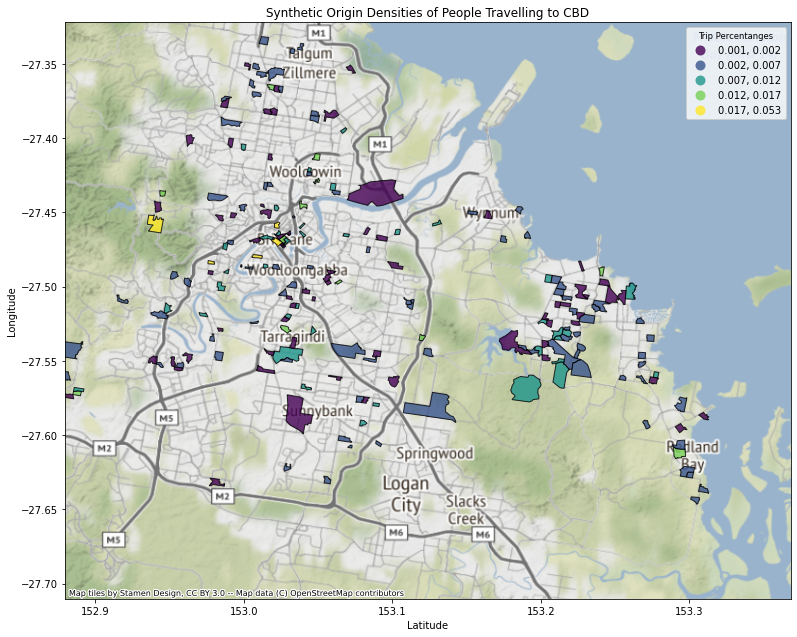

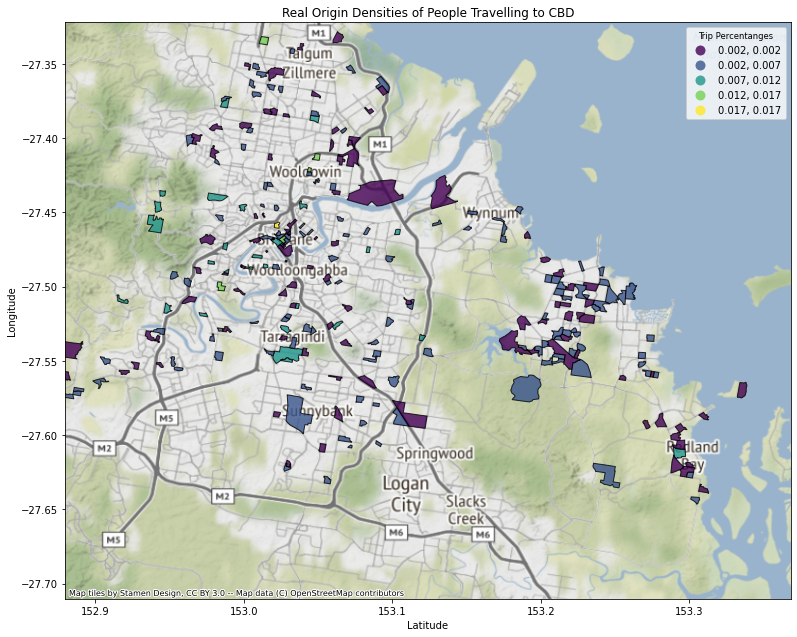

In [331]:
#fig, ax = plt.subplots(figsize=(12,8))

from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib import cm
viridis = cm.get_cmap('viridis', 20)



binlist2= list(np.arange(frame2['pcts'].value_counts().keys().min(),frame2['pcts'].value_counts().keys().max(),0.02))
binlist2c= list(np.arange(frame2['count'].value_counts().keys().min(),frame2['count'].value_counts().keys().max(),10))
binlist= list(np.arange(frame['pcts'].value_counts().keys().min(),frame['pcts'].value_counts().keys().max(),0.005))
binnumber=[1,2,3,4,5,10,15,20,25,50,frame2['count'].max()]

ax1=frame2.plot(figsize = (13, 12),
    column='pcts',
    linewidth=1,
    cmap=viridis,
    scheme='User_Defined',
    edgecolor='black',
    alpha=0.8,
    classification_kwds={'bins':binlist},label='er',
    legend=True,legend_kwds={'title':'Trip Percentanges','title_fontsize':'small'
                            , "fmt": "{:.3f}" }
    )




ax2=frame.plot(figsize = (13, 12),
    column='pcts',
    linewidth=1,
    cmap=viridis,
    scheme='User_Defined',
    edgecolor='black',
    alpha=0.8,
    classification_kwds={'bins': binlist},
    legend=True,legend_kwds={'title':'Trip Percentanges','title_fontsize':'small'
                           , "fmt": "{:.3f}" }
    #legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5)},
    )


    


ax1.set_xlabel('Latitude')
ax1.set_ylabel('Longitude')
ax1.set_title('Synthetic Origin Densities of People Travelling to CBD')
ax1.set_xlim(gdf['bbox_west'][0] +0.2 , gdf['bbox_east'][0] -0.1)
ax1.set_ylim(gdf['bbox_south'][0] -0.05 , gdf['bbox_north'][0] - 0.3 )

ax2.set_xlabel('Latitude')
ax2.set_ylabel('Longitude')
ax2.set_title('Real Origin Densities of People Travelling to CBD')
ax2.set_xlim(gdf['bbox_west'][0] +0.2 , gdf['bbox_east'][0] -0.1)
ax2.set_ylim(gdf['bbox_south'][0] -0.05 , gdf['bbox_north'][0] - 0.3 )


frame.set_crs(epsg=4326, inplace=True)
cx.add_basemap(ax1,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)
cx.add_basemap(ax2,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)

frame.set_crs(epsg=4326, inplace=True)
cx.add_basemap(ax1,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


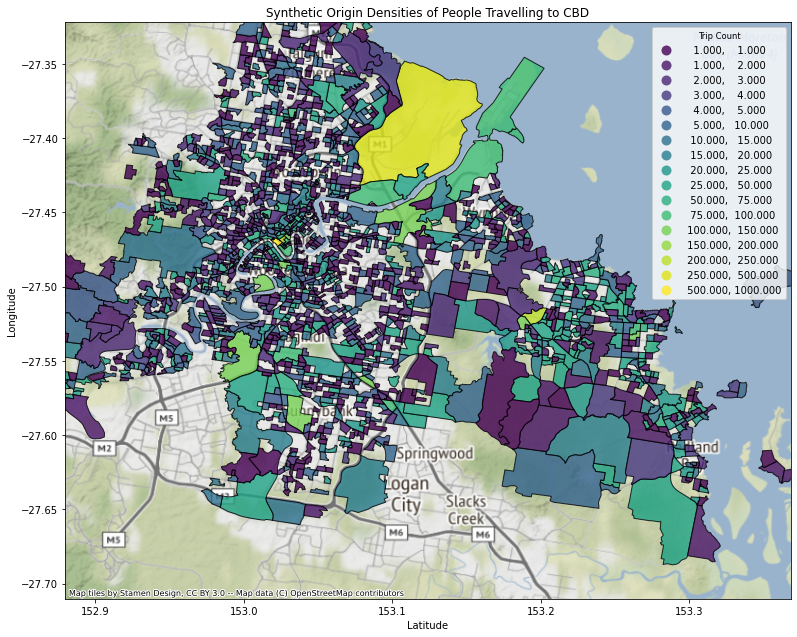

In [475]:
d = {'0': real_data['ORIGSA1_2021'].value_counts().keys(), 'count': real_data['ORIGSA1_2021'].value_counts().values}
#d = {'dest':hungarian200k['dest_sa'].value_counts().keys(), 'count': hungarian200k['dest_sa'].value_counts().values}
o = pd.DataFrame(data=d)
o['poly']=o['0'].map(area_dict)


binlist = [1,2,3,4,5,10,15,20,25,50,75,100,150,200,250,500,1000]

o = gpd.GeoDataFrame(o, geometry='poly')


ax1=o.plot(figsize = (13, 12),
    column='count',
    linewidth=1,
    cmap=viridis,
    scheme='User_Defined',
    edgecolor='black',
    alpha=0.8,
    classification_kwds={'bins':binlist},label='er',
    legend=True,legend_kwds={'title':'Trip Count','title_fontsize':'small'
                            , "fmt": "{:.3f}" }
           
    )

ax1.set_xlabel('Latitude')
ax1.set_ylabel('Longitude')
ax1.set_title('Synthetic Origin Densities of People Travelling to CBD')
ax1.set_xlim(gdf['bbox_west'][0] +0.2 , gdf['bbox_east'][0] -0.1)
ax1.set_ylim(gdf['bbox_south'][0] -0.05 , gdf['bbox_north'][0] - 0.3 )
#sf.to_frame({'email':sf.index, 'list':sf.values})

o.set_crs(epsg=4326, inplace=True)
cx.add_basemap(ax1,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


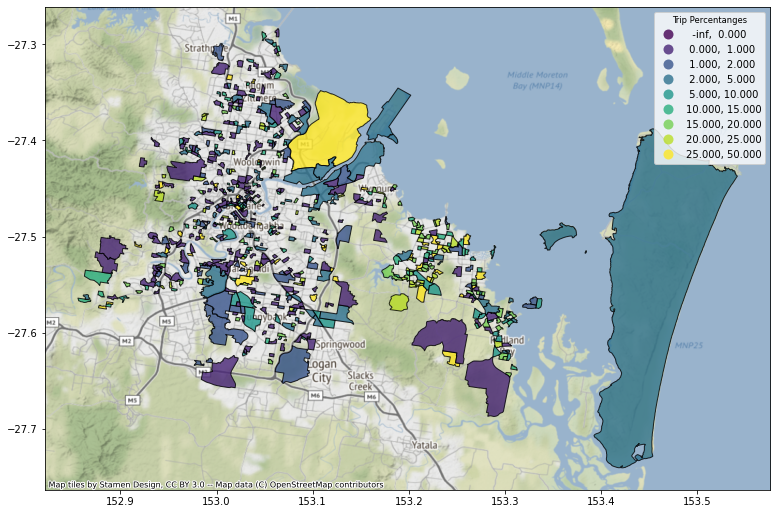

In [481]:

#d = {'0': real_data['ORIGSA1_2021'].value_counts().keys(), 'count': real_data['ORIGSA1_2021'].value_counts().values}

#intrmdt=pd.concat([real2['0'],real2['1'],real2['2']])
#intrmdt=intrmdt[intrmdt!=0]

d = {'0': real2['0'].value_counts().keys(), 'count': real2['0'].value_counts().values}
o = pd.DataFrame(data=d)
o['poly']=o['0'].map(area_dict2)


o = gpd.GeoDataFrame(o, geometry='poly')

binlist=[0,1,2,5,10,15,20,25,50]

ax1=o.plot(figsize = (13, 12),
    column='count',
    linewidth=1,
    cmap=viridis,
    scheme='User_Defined',
    edgecolor='black',
    alpha=0.8,
    classification_kwds={'bins':binlist},label='er',
    legend=True,legend_kwds={'title':'Trip Percentanges','title_fontsize':'small'
                            , "fmt": "{:.3f}" }
    )
#sf.to_frame({'email':sf.index, 'list':sf.values})

o.set_crs(epsg=4326, inplace=True)
cx.add_basemap(ax1,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


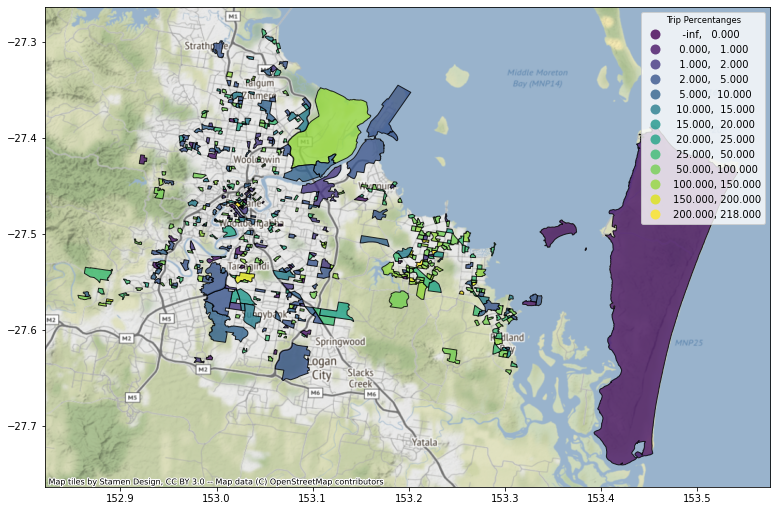

In [354]:
d = {'0': hungarian200k['0'].value_counts().keys(), 'count': hungarian200k['0'].value_counts().values}
o = pd.DataFrame(data=d)
o['poly']=o['0'].map(area_dict)

binlist=[0,1,2,5,10,15,20,25,50,100,150,200]

o = gpd.GeoDataFrame(o, geometry='poly')


ax1=o.plot(figsize = (13, 12),
    column='count',
    linewidth=1,
    cmap=viridis,
    scheme='User_Defined',
    edgecolor='black',
    alpha=0.8,
    classification_kwds={'bins':binlist},label='er',
    legend=True,legend_kwds={'title':'Trip Percentanges','title_fontsize':'small'
                            , "fmt": "{:.3f}" }
    )
#sf.to_frame({'email':sf.index, 'list':sf.values})

o.set_crs(epsg=4326, inplace=True)
cx.add_basemap(ax1,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)

{30101100101: <shapely.geometry.polygon.Polygon at 0x7fc40a9b53a0>,
 30101100102: <shapely.geometry.polygon.Polygon at 0x7fc40a9b5400>,
 30101100103: <shapely.geometry.polygon.Polygon at 0x7fc40a9b5460>,
 30101100104: <shapely.geometry.polygon.Polygon at 0x7fc40a9b54c0>,
 30101100105: <shapely.geometry.polygon.Polygon at 0x7fc40a9b5520>,
 30101100106: <shapely.geometry.polygon.Polygon at 0x7fc40a9b5580>,
 30101100107: <shapely.geometry.polygon.Polygon at 0x7fc40a9b55e0>,
 30101100108: <shapely.geometry.polygon.Polygon at 0x7fc40a9b5640>,
 30101100109: <shapely.geometry.polygon.Polygon at 0x7fc40a9b56a0>,
 30101100110: <shapely.geometry.polygon.Polygon at 0x7fc40a9b5700>,
 30101100111: <shapely.geometry.polygon.Polygon at 0x7fc40a9b5760>,
 30101100112: <shapely.geometry.polygon.Polygon at 0x7fc40a9b57c0>,
 30101100113: <shapely.geometry.polygon.Polygon at 0x7fc40a9b5820>,
 30101100114: <shapely.geometry.polygon.Polygon at 0x7fc40a9b5880>,
 30101100115: <shapely.geometry.polygon.Polygon 

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


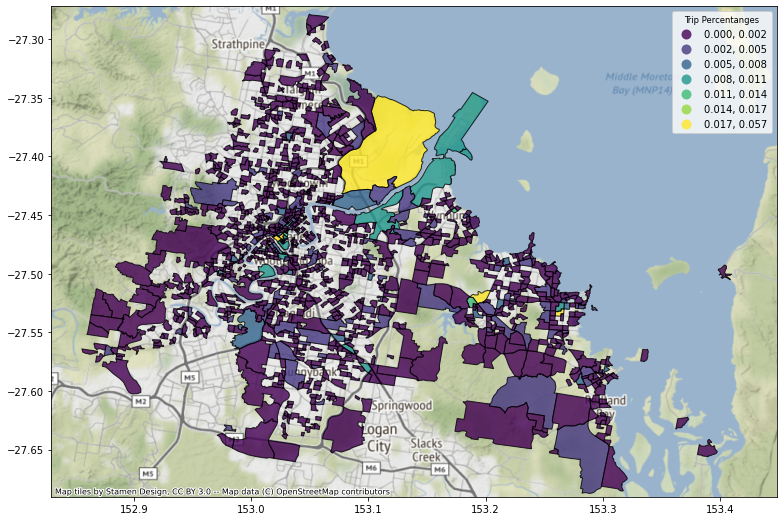

In [829]:
d = {'dest': hungarian200k['dest_sa'].value_counts().keys(), 'count': hungarian200k['dest_sa'].value_counts().values}
o = pd.DataFrame(data=d)
o['poly']=o['dest'].map(area_dict)

o['pcts'] = o['count'] / o['count'].sum()
binlist= list(np.arange(frame['pcts'].value_counts().keys().min(),frame['pcts'].value_counts().keys().max(),0.0030))
#binlist=[20,25,50,100,250,500,1000,5000]

o = gpd.GeoDataFrame(o, geometry='poly')


ax1=o.plot(figsize = (13, 12),
    column='pcts',
    linewidth=1,
    cmap=viridis,
    scheme='User_Defined',
    edgecolor='black',
    alpha=0.8,
    classification_kwds={'bins':binlist},label='er',
    legend=True,legend_kwds={'title':'Trip Percentanges','title_fontsize':'small'
                            , "fmt": "{:.3f}" }
    )
#sf.to_frame({'email':sf.index, 'list':sf.values})

ax1.set_xlim(gdf['bbox_west'][0] + 0.15 , gdf['bbox_east'][0]  - 0.02)
ax1.set_ylim(gdf['bbox_south'][0] -0.03 , gdf['bbox_north'][0] - 0.25 )

o.set_crs(epsg=4326, inplace=True)
cx.add_basemap(ax1,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


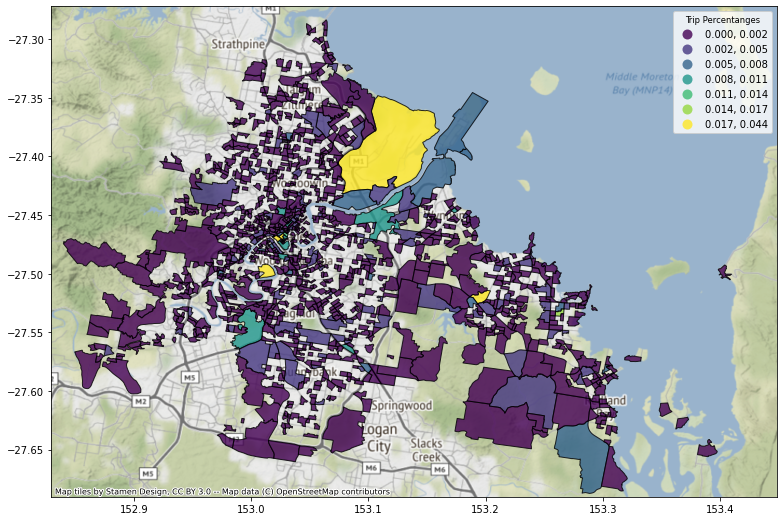

In [828]:
d = {'dest': real2['dest_sa'].value_counts().keys(), 'count': real2['dest_sa'].value_counts().values}
o = pd.DataFrame(data=d)
o['poly']=o['dest'].map(area_dict)

o['pcts'] = o['count'] / o['count'].sum()
binlist= list(np.arange(frame['pcts'].value_counts().keys().min(),frame['pcts'].value_counts().keys().max(),0.0030))#
#binlist=[1,2,3,5,10,15,25,50,100,250]

o = gpd.GeoDataFrame(o, geometry='poly')


ax1=o.plot(figsize = (13, 12),
    column='pcts',
    linewidth=1,
    cmap=viridis,
    scheme='User_Defined',
    edgecolor='black',
    alpha=0.8,
    classification_kwds={'bins':binlist},label='er',
    legend=True,legend_kwds={'title':'Trip Percentanges','title_fontsize':'small'
                            , "fmt": "{:.3f}" }
    )
#sf.to_frame({'email':sf.index, 'list':sf.values})

ax1.set_xlim(gdf['bbox_west'][0] + 0.15 , gdf['bbox_east'][0]  - 0.02)
ax1.set_ylim(gdf['bbox_south'][0] -0.03 , gdf['bbox_north'][0] - 0.25 )

o.set_crs(epsg=4326, inplace=True)
cx.add_basemap(ax1,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)

In [1213]:
saf3=saf.copy()
saf3=add_sa2(saf3)

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


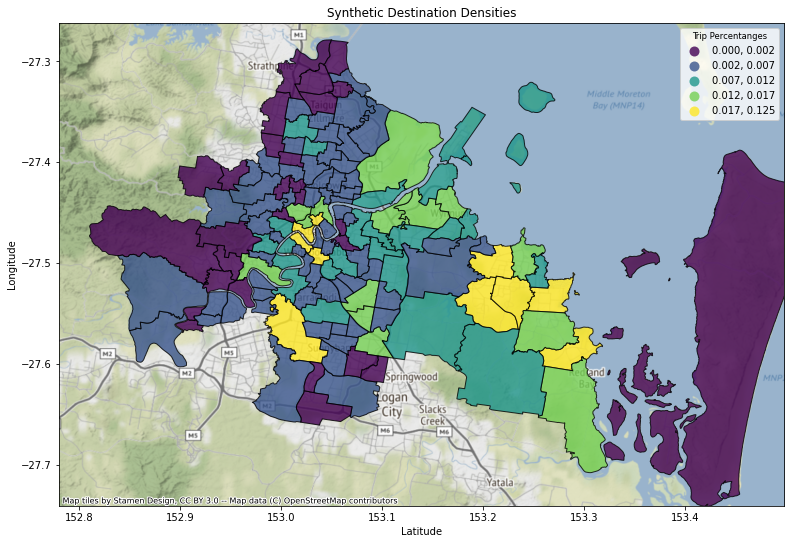

In [1214]:
d = {'dest': saf3['dest_sa2'].value_counts().keys(), 'count': saf3['dest_sa2'].value_counts().values}
o = pd.DataFrame(data=d)
o['dest'] = o['dest'].astype(str)
o['poly']=o['dest'].map(area_dict_sa2)


o['pcts'] = o['count'] / o['count'].sum()

#binlist=[0,100,500,1000,5000,10000,20000]
binlist= list(np.arange(frame['pcts'].value_counts().keys().min(),frame['pcts'].value_counts().keys().max(),0.005))

o = gpd.GeoDataFrame(o, geometry='poly')





ax1=o.plot(figsize = (13, 12),
    column='pcts',
    linewidth=1,
    cmap=viridis,
    scheme='User_Defined',
    edgecolor='black',
    alpha=0.8,
    classification_kwds={'bins':binlist},label='er',
    legend=True,legend_kwds={'title':'Trip Percentanges','title_fontsize':'small'
                            , "fmt": "{:.3f}" }
    )
#sf.to_frame({'email':sf.index, 'list':sf.values})

ax1.set_xlim(gdf['bbox_west'][0] + 0.10 , gdf['bbox_east'][0]  + 0.03)
ax1.set_ylim(gdf['bbox_south'][0] -0.08 , gdf['bbox_north'][0] - 0.24 )
ax1.set_title('Synthetic Destination Densities')
ax1.set_xlabel('Latitude')
ax1.set_ylabel('Longitude')



o.set_crs(epsg=4326, inplace=True)
cx.add_basemap(ax1,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


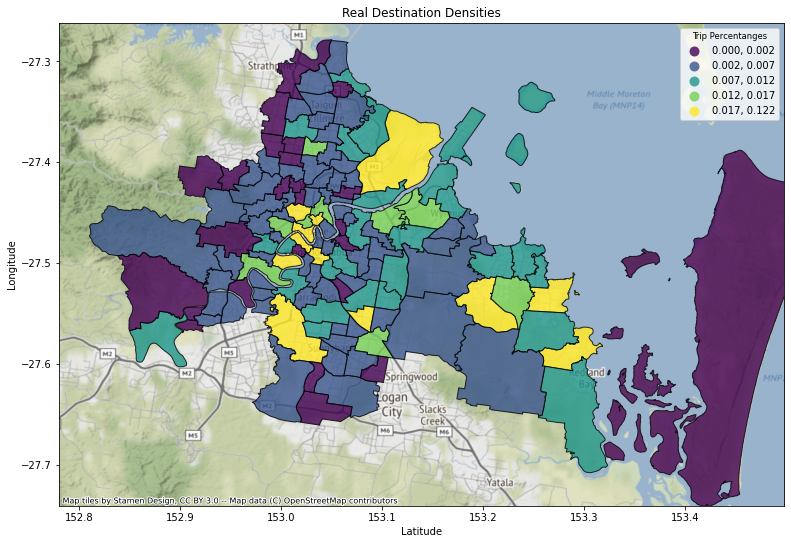

In [842]:



o['pcts'] = o['count'] / o['count'].sum()

#binlist=[0,100,500,1000,5000,10000,20000]
binlist= list(np.arange(frame['pcts'].value_counts().keys().min(),frame['pcts'].value_counts().keys().max(),0.005))

o = gpd.GeoDataFrame(o, geometry='poly')


d = {'dest': real2['dest_sa2'].value_counts().keys(), 'count': real2['dest_sa2'].value_counts().values}
o = pd.DataFrame(data=d)
o['dest'] = o['dest'].astype(str)
o['poly']=o['dest'].map(area_dict_sa2)


o['pcts'] = o['count'] / o['count'].sum()

#binlist=[0,100,500,1000,5000,10000,20000]
binlist= list(np.arange(frame['pcts'].value_counts().keys().min(),frame['pcts'].value_counts().keys().max(),0.005))

o = gpd.GeoDataFrame(o, geometry='poly')


ax1=o.plot(figsize = (13, 12),
    column='pcts',
    linewidth=1,
    cmap=viridis,
    scheme='User_Defined',
    edgecolor='black',
    alpha=0.8,
    classification_kwds={'bins':binlist},label='er',
    legend=True,legend_kwds={'title':'Trip Percentanges','title_fontsize':'small'
                            , "fmt": "{:.3f}" }
    )
#sf.to_frame({'email':sf.index, 'list':sf.values})


ax1.set_xlim(gdf['bbox_west'][0] + 0.10 , gdf['bbox_east'][0]  + 0.03)
ax1.set_ylim(gdf['bbox_south'][0] -0.08 , gdf['bbox_north'][0] - 0.24 )
ax1.set_title('Real Destination Densities')
ax1.set_xlabel('Latitude')
ax1.set_ylabel('Longitude')


o.set_crs(epsg=4326, inplace=True)
cx.add_basemap(ax1,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)

In [ ]:
d1 = {'dest': hungarian200k['dest_sa2'].value_counts().keys(), 'count': hungarian200k['dest_sa2'].value_counts().values}
o1 = pd.DataFrame(data=d1)
o1['dest'] = o1['dest'].astype(str)
o1['poly']=o1['dest'].map(area_dict_sa2)


o1['pcts'] = o1['count'] / o1['count'].sum()

#binlist=[0,100,500,1000,5000,10000,20000]
binlist= list(np.arange(frame['pcts'].value_counts().keys().min(),frame['pcts'].value_counts().keys().max(),0.005))

o1= gpd.GeoDataFrame(o1, geometry='poly')


d2 = {'dest': real2['dest_sa2'].value_counts().keys(), 'count': real2['dest_sa2'].value_counts().values}
o2 = pd.DataFrame(data=d2)
o2['dest'] = o2['dest'].astype(str)
o2['poly']=o2['dest'].map(area_dict_sa2)


o2['pcts'] = o2['count'] / o2['count'].sum()

#binlist=[0,100,500,1000,5000,10000,20000]
binlist= list(np.arange(frame['pcts'].value_counts().keys().min(),frame['pcts'].value_counts().keys().max(),0.005))

o2 = gpd.GeoDataFrame(o2, geometry='poly')




ax1=o.plot(figsize = (13, 12),
    column='pcts',
    linewidth=1,
    cmap=viridis,
    scheme='User_Defined',
    edgecolor='black',
    alpha=0.8,
    classification_kwds={'bins':binlist},label='er',
    legend=True,legend_kwds={'title':'Trip Percentanges','title_fontsize':'small'
                            , "fmt": "{:.3f}" }
    )
#sf.to_frame({'email':sf.index, 'list':sf.values})


ax1.set_xlim(gdf['bbox_west'][0] + 0.10 , gdf['bbox_east'][0]  + 0.03)
ax1.set_ylim(gdf['bbox_south'][0] -0.08 , gdf['bbox_north'][0] - 0.24 )
ax1.set_title('Real Destination Densities')
ax1.set_xlabel('Latitude')
ax1.set_ylabel('Longitude')


o.set_crs(epsg=4326, inplace=True)
cx.add_basemap(ax1,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)

In [853]:
d1 = {'dest': hungarian200k['dest_sa2'].value_counts().keys(), 'count': hungarian200k['dest_sa2'].value_counts().values}
o1 = pd.DataFrame(data=d1)
o1['dest'] = o1['dest'].astype(str)
o1['poly']=o1['dest'].map(area_dict_sa2)


o1['pcts'] = o1['count'] / o1['count'].sum()

#binlist=[0,100,500,1000,5000,10000,20000]
binlist= list(np.arange(frame['pcts'].value_counts().keys().min(),frame['pcts'].value_counts().keys().max(),0.005))

o1= gpd.GeoDataFrame(o1, geometry='poly')


d2 = {'dest': real2['dest_sa2'].value_counts().keys(), 'count': real2['dest_sa2'].value_counts().values}
o2 = pd.DataFrame(data=d2)
o2['dest'] = o2['dest'].astype(str)
o2['poly']=o2['dest'].map(area_dict_sa2)


o2['pcts'] = o2['count'] / o2['count'].sum()

#binlist=[0,100,500,1000,5000,10000,20000]
binlist= list(np.arange(frame['pcts'].value_counts().keys().min(),frame['pcts'].value_counts().keys().max(),0.005))

o2 = gpd.GeoDataFrame(o2, geometry='poly')


o1-o2

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values
/var/folders/jv/2_fp3b717yl0vd8xbytqhz300000gn/T/ipykernel_71843/1918878958.py:29: DeprecationWarning: '-' operator will be deprecated. Use the 'difference' method instead.
  o1-o2


0                                          POLYGON EMPTY
1                                          POLYGON EMPTY
2                                          POLYGON EMPTY
3                                          POLYGON EMPTY
4      POLYGON ((153.31576 -27.58244, 153.31559 -27.5...
                             ...                        
132    POLYGON ((152.94431 -27.46236, 152.94493 -27.4...
133    POLYGON ((152.90192 -27.55847, 152.90445 -27.5...
134    POLYGON ((152.90322 -27.54692, 152.90322 -27.5...
135    POLYGON ((153.04962 -27.51790, 153.04907 -27.5...
136    POLYGON ((153.05014 -27.47599, 153.05057 -27.4...
Length: 137, dtype: geometry

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


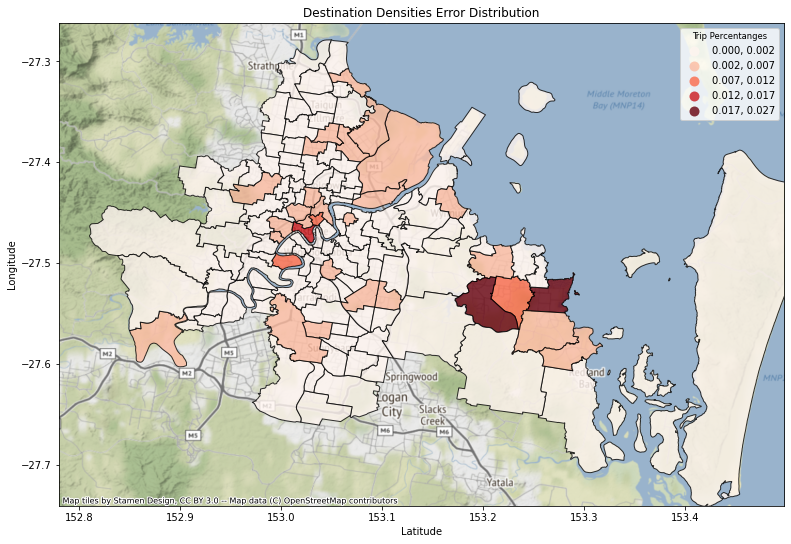

In [908]:
indk= o1.sort_values(by=['dest'])['dest'].values
err1=o1.sort_values(by=['dest'])['pcts'].values
err2=o2.sort_values(by=['dest'])['pcts'].values
errt=abs(err1-err2)

d_err = {'errt': errt, 'indk':indk}
o_err = pd.DataFrame(data=d_err)
o_err['indk'] = o_err['indk'].astype(str)
o_err['poly']=o_err['indk'].map(area_dict_sa2)

o_err= gpd.GeoDataFrame(o_err, geometry='poly')

erenc = cm.get_cmap('Reds', 5)


ax1=o_err.plot(figsize = (13, 12),
    column='errt',
    linewidth=1,
    cmap=erenc,
    scheme='User_Defined',
    edgecolor='black',
    alpha=0.8,
    classification_kwds={'bins':binlist},label='er',
    legend=True,legend_kwds={'title':'Trip Percentanges','title_fontsize':'small'
                            , "fmt": "{:.3f}" }
    )
#sf.to_frame({'email':sf.index, 'list':sf.values})


ax1.set_xlim(gdf['bbox_west'][0] + 0.10 , gdf['bbox_east'][0]  + 0.03)
ax1.set_ylim(gdf['bbox_south'][0] -0.08 , gdf['bbox_north'][0] - 0.24 )
ax1.set_title('Destination Densities Error Distribution')
ax1.set_xlabel('Latitude')
ax1.set_ylabel('Longitude')


o.set_crs(epsg=4326, inplace=True)
cx.add_basemap(ax1,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)


In [723]:
d = {'dest': hungarian200k['dest_sa2'].value_counts().keys(), 'count': hungarian200k['dest_sa2'].value_counts().values}
o = pd.DataFrame(data=d)
o['poly']=o['dest'].map(area_dict_sa2)



/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


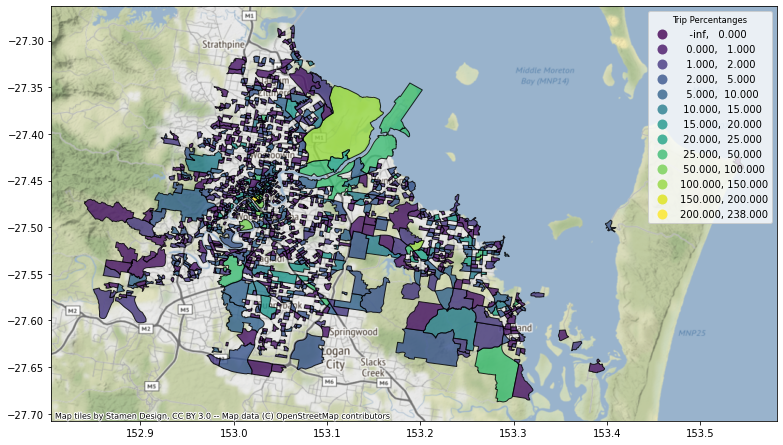

In [511]:
d = {'dest': real2['dest_sa'].value_counts().keys(), 'count': real2['dest_sa'].value_counts().values}
o = pd.DataFrame(data=d)
o['poly']=o['dest'].map(area_dict)

binlist=[0,1,2,5,10,15,20,25,50,100,150,200]

o = gpd.GeoDataFrame(o, geometry='poly')


ax1=o.plot(figsize = (13, 12),
    column='count',
    linewidth=1,
    cmap=viridis,
    scheme='User_Defined',
    edgecolor='black',
    alpha=0.8,
    classification_kwds={'bins':binlist},label='er',
    legend=True,legend_kwds={'title':'Trip Percentanges','title_fontsize':'small'
                            , "fmt": "{:.3f}" }
    )
#sf.to_frame({'email':sf.index, 'list':sf.values})

o.set_crs(epsg=4326, inplace=True)
cx.add_basemap(ax1,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)

In [405]:
a=real2['0'].value_counts().keys()
b=hungarian200k['0'].value_counts().keys().astype(str)

In [462]:
real2

,0,1,2,3,INDUSTRY,geo_0,geo_1,geo_2,geo_3,xo_0,...,distance02,distance03,d_point,o_point,dest_sa,d_poly,orig_sa,orig_sa2,dest_sa2,distance
0,30403109418,30501110537,30501111032,0,utilities,POLYGON ((152.96149103624174 -27.5079184488846...,POLYGON ((153.0287520335116 -27.47225645534667...,POLYGON ((153.01363602539067 -27.4702204438134...,0,152.963191,...,0.065130,0.000000,POINT (153.02895732859386 -27.471429470360864),POINT (152.9631905458976 -27.50891119382392),30501110537,POLYGON ((153.0287520335116 -27.47225645534667...,30403109418,304031094,305011105,0.075698
1,30404110005,30501110537,30404110005,30503112606,publicAdmin,POLYGON ((152.9613561797451 -27.40071169802354...,POLYGON ((153.0287520335116 -27.47225645534667...,POLYGON ((152.9613561797451 -27.40071169802354...,POLYGON ((153.00807798953133 -27.4421043430335...,152.963830,...,0.000000,0.062239,POINT (153.02895732859386 -27.471429470360864),POINT (152.9638297846899 -27.401509933180627),30501110537,POLYGON ((153.0287520335116 -27.47225645534667...,30404110005,304041100,305011105,0.095553
2,30303106207,30501110537,30303106207,0,other,POLYGON ((153.09779606995357 -27.5208444426718...,POLYGON ((153.0287520335116 -27.47225645534667...,POLYGON ((153.09779606995357 -27.5208444426718...,0,153.098148,...,0.000000,0.000000,POINT (153.02895732859386 -27.471429470360864),POINT (153.09814849439462 -27.523701957581537),30501110537,POLYGON ((153.0287520335116 -27.47225645534667...,30303106207,303031062,305011105,0.086717
3,30305107217,30501110537,0,0,construction,POLYGON ((153.02720904451368 -27.6239074063892...,POLYGON ((153.0287520335116 -27.47225645534667...,0,0,153.029240,...,0.000000,0.000000,POINT (153.02895732859386 -27.471429470360864),POINT (153.0292399944444 -27.62166042143541),30501110537,POLYGON ((153.0287520335116 -27.47225645534667...,30305107217,303051072,305011105,0.150231
4,30301105109,30501110537,30301105102,30301105109,admin,POLYGON ((153.1215060258679 -27.53297141515555...,POLYGON ((153.0287520335116 -27.47225645534667...,POLYGON ((153.10133810284782 -27.4949835028240...,POLYGON ((153.1215060258679 -27.53297141515555...,153.120158,...,0.041988,0.000000,POINT (153.02895732859386 -27.471429470360864),POINT (153.12015833579665 -27.53425735999111),30501110537,POLYGON ((153.0287520335116 -27.47225645534667...,30301105109,303011051,305011105,0.110747
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5351,30301104913,30301104817,30301104913,0,construction,POLYGON ((153.09578798538868 -27.4796154521437...,POLYGON ((153.0876100178329 -27.46722845122278...,POLYGON ((153.09578798538868 -27.4796154521437...,0,153.098576,...,0.000000,0.000000,POINT (153.0850093981473 -27.466984706215044),POINT (153.09857631496868 -27.48123189731219),30301104817,POLYGON ((153.0876100178329 -27.46722845122278...,30301104913,303011049,303011048,0.019673
5352,30204104224,30203104016,30204104224,0,transport,POLYGON ((153.04792706414312 -27.2922974558478...,POLYGON ((153.06703012786227 -27.4052937186627...,POLYGON ((153.04792706414312 -27.2922974558478...,0,153.049694,...,0.000000,0.000000,POINT (153.07051618728872 -27.40652444878061),POINT (153.04969357418346 -27.291455925842868),30203104016,POLYGON ((153.06703012786227 -27.4052937186627...,30204104224,302041042,302031040,0.116937
5353,30204104224,30204104202,30204104403,30204104202,other,POLYGON ((153.04792706414312 -27.2922974558478...,POLYGON ((153.05485494342082 -27.2921794665429...,POLYGON ((153.06737786938857 -27.3136084779716...,POLYGON ((153.05485494342082 -27.2921794665429...,153.049694,...,0.029934,0.008324,POINT (153.0678025141646 -27.315290428057708),POINT (153.04969357418346 -27.291455925842868),30204104403,POLYGON ((153.06737786938857 -27.3136084779716...,30204104224,302041042,302041044,0.029934
5354,30103101709,30301105002,30301104915,30301105102,education,POLYGON ((153.10215818690577 -27.4622274526475...,POLYGON ((153.09107839356105 -27.4980516518155...,POLYGON ((153.08652520518208 -27.4891044212

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


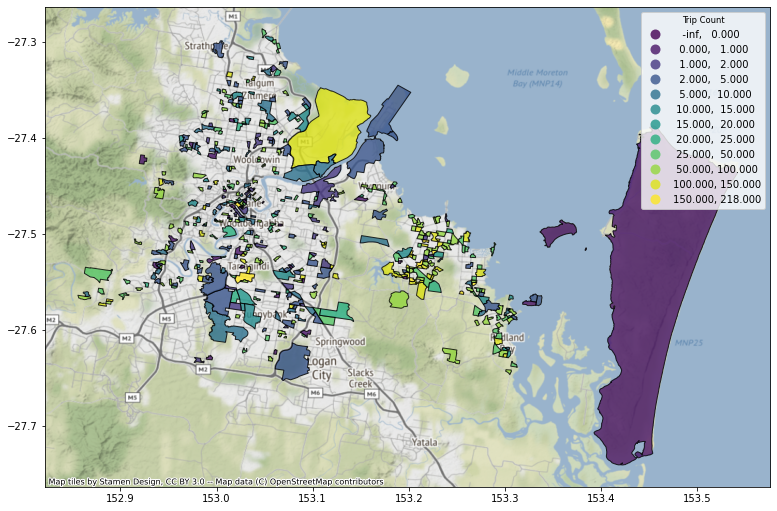

In [466]:



#d = {'0': real_data['ORIGSA1_2021'].value_counts().keys(), 'count': real_data['ORIGSA1_2021'].value_counts().values}
d = {'dest': hungarian200k['orig_sa'].value_counts().keys(), 'count': hungarian200k['orig_sa'].value_counts().values}
o = pd.DataFrame(data=d)
o['poly']=o['dest'].map(area_dict)


o['pcts'] = o['count'] / o['count'].sum()
o = gpd.GeoDataFrame(o, geometry='poly')

binlist=[0,1,2,5,10,15,20,25,50,100,150]


ax1=o.plot(figsize = (13, 12),
    column='count',
    linewidth=1,
    cmap=viridis,
    scheme='User_Defined',
    edgecolor='black',
    alpha=0.8,
    classification_kwds={'bins':binlist},label='er',
    legend=True,legend_kwds={'title':'Trip Count','title_fontsize':'small'
                            , "fmt": "{:.3f}" }
    )
#sf.to_frame({'email':sf.index, 'list':sf.values})

o.set_crs(epsg=4326, inplace=True)
cx.add_basemap(ax1,
    crs=frame.crs.to_string(),
    # Using the original map, hand-drawn by Snow
)

In [439]:
real_data

,PERSID,AGEGROUP,SEX,WORKSTATUS,INDUSTRY,TRIPID,ORIGPLACE,ORIGSA1_2021,DESTPURP,DESTSA1_2021,DURATION,STARTIME,CUMDIST
0,100001/1000,10,female,workFullTime,construction,1000011000001,My home,31603142717,Work (my workplace),31605143413,250.0,240,37.05
1,100001/1000,10,female,workFullTime,construction,1000011000002,Other work-related place,31605143413,Go home,31603142717,NaN,540,36.50
2,100001/1001,10,male,workFullTime,construction,1000011001001,My home,31603142717,Work (other work reason),31605143413,250.0,240,37.05
3,100001/1001,10,male,workFullTime,construction,1000011001002,Other work-related place,31605143413,Go home,31603142717,NaN,540,36.50
4,100001/1002,5,male,workFullTime,construction,1000011002001,My home,31603142717,Work (other work reason),31605143413,250.0,240,37.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...
54643,99991/1001,12,male,workFullTime,transport,999911001001,My home,30103101509,Just accompanying someone,30501111001,360.0,255,18.94
54644,99991/1001,12,male,workFullTime,transport,999911001002,Other place (please specify),30501111001,Shopping,30301105142,60.0,660,9.18
54645,99991/1001,12,male,workFullTime,transport,999911001003,Shop or supermarket,30301105142,Go home,30103101509,NaN,750,12.83
54646,99991/1003,5,female,workPartTime,health,999911003001,My home,30103101509,Just accompanying someone,30103102031,25.0,330,1.83


In [453]:
gdf = ox.geocode_to_gdf({'city': 'Brisbane'})


In [452]:
# o[0:20] # we did not map polygons for cairns etc..


In [4]:
import osmnx as ox

gdf = ox.geocode_to_gdf({'city': 'Brisbane'})


In [76]:
#frame['pcts'].value_counts().keys().max()
#ax1.get_legend().get_texts()


In [714]:
hungarian200k[(hungarian200k['0']==30101100116) & ( hungarian200k['1']=='30305107531')]

,AGEGROUP,SEX,INDUSTRY,indexes,dest_sa,orig_sa,0,1,2,3,...,pt_3,distance01,distance02,distance03,d_point,o_point,d_poly,orig_sa2,dest_sa2,distance


In [273]:
hungarian200k[(hungarian200k['0']==30101100116) & ( hungarian200k['1']==30101100109)]

,AGEGROUP,SEX,INDUSTRY,indexes,dest_sa,orig_sa,0,1,2,3,...,pt_2,pt_3,distance01,distance02,distance03,d_point,o_point,d_poly,orig_sa2,dest_sa2
6640,5,male,construction,2444,30101100407,30101100116,30101100116,30101100109,30101100407,30101100116,...,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),0.012584,0.02323,0.0,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),POLYGON ((153.18939518017535 -27.5203444219053...,301011001,301011004
6642,7,male,it,4257,30101100407,30101100116,30101100116,30101100109,30101100407,30101100116,...,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),0.012584,0.02323,0.0,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),POLYGON ((153.18939518017535 -27.5203444219053...,301011001,301011004
6645,10,female,admin,2444,30101100407,30101100116,30101100116,30101100109,30101100407,30101100116,...,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),0.012584,0.02323,0.0,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),POLYGON ((153.18939518017535 -27.5203444219053...,301011001,301011004
6647,10,male,transport,4257,30101100407,30101100116,30101100116,30101100109,30101100407,30101100116,...,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),0.012584,0.02323,0.0,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),POLYGON ((153.18939518017535 -27.5203444219053...,301011001,301011004
6648,7,female,it,4257,30101100407,30101100116,30101100116,30101100109,30101100407,30101100116,...,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),0.012584,0.02323,0.0,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),POLYGON ((153.18939518017535 -27.5203444219053...,301011001,301011004
6649,11,female,professional,2444,30101100407,30101100116,30101100116,30101100109,30101100407,30101100116,...,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),0.012584,0.02323,0.0,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),POLYGON ((153.18939518017535 -27.5203444219053...,301011001,301011004
6653,9,female,mining,4257,30101100407,30101100116,30101100116,30101100109,30101100407,30101100116,...,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),0.012584,0.02323,0.0,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),POLYGON ((153.18939518017535 -27.5203444219053...,301011001,301011004
6654,9,female,health,2444,30101100407,30101100116,30101100116,30101100109,30101100407,30101100116,...,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),0.012584,0.02323,0.0,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),POLYGON ((153.18939518017535 -27.5203444219053...,301011001,301011004
6657,6,male,education,2444,30101100407,30101100116,30101100116,30101100109,30101100407,30101100116,...,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),0.012584,0.02323,0.0,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),POLYGON ((153.18939518017535 -27.5203444219053...,301011001,301011004
6658,12,female,health,4257,30101100407,30101100116,30101100116,30101100109,30101100407,30101100116,...,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),0.012584,0.02323,0.0,POINT (153.19545009494112 -27.51989394269133),POINT (153.21867956713714 -27.519769249966995),POLYGON ((153.18939518017535 -27.5203444219053...,301011001,301011004


In [431]:
train_data




,AGEGROUP,SEX,INDUSTRY,ORIGSA1_2021,DESTSA1_2021,geo_o,geo_d,CUMDIST,xo_c,yo_c,xd_c,yd_c
0,10,male,utilities,30403109418,30501110537,"POLYGON ((152.96149 -27.50792, 152.96172 -27.5...","POLYGON ((153.02875 -27.47226, 153.02868 -27.4...",14.61,152.963191,-27.508911,153.028957,-27.471429
1,14,male,construction,30101100407,30103101509,"POLYGON ((153.18940 -27.52034, 153.18852 -27.5...","POLYGON ((153.18324 -27.44776, 153.18386 -27.4...",10.78,153.195450,-27.519894,153.185363,-27.448498
2,11,female,professional,30103101601,30103101509,"POLYGON ((153.14641 -27.47344, 153.14816 -27.4...","POLYGON ((153.18324 -27.44776, 153.18386 -27.4...",5.24,153.150356,-27.472367,153.185363,-27.448498
3,11,male,professional,30103101601,30103101509,"POLYGON ((153.14641 -27.47344, 153.14816 -27.4...","POLYGON ((153.18324 -27.44776, 153.18386 -27.4...",5.24,153.150356,-27.472367,153.185363,-27.448498
4,13,female,wholesale,30303106525,30103101509,"POLYGON ((153.08021 -27.55683, 153.08017 -27.5...","POLYGON ((153.18324 -27.44776, 153.18386 -27.4...",19.40,153.082575,-27.558290,153.185363,-27.448498
...,...,...,...,...,...,...,...,...,...,...,...,...
5351,4,male,other,30103101401,30103101509,"MULTIPOLYGON (((153.18855 -27.40102, 153.18854...","POLYGON ((153.18324 -27.44776, 153.18386 -27.4...",4.80,153.168871,-27.394003,153.185363,-27.448498
5352,9,female,realEstate,30103101505,30103101509,"POLYGON ((153.18460 -27.45737, 153.18522 -27.4...","POLYGON ((153.18324 -27.44776, 153.18386 -27.4...",1.61,153.183986,-27.458445,153.185363,-27.448498
5353,12,female,education,30301105142,30103101509,"POLYGON ((153.10382 -27.50044, 153.10511 -27.5...","POLYGON ((153.18324 -27.44776, 153.18386 -27.4...",12.83,153.102551,-27.502376,153.185363,-27.448498
5354,12,male,transport,30301105142,30103101509,"POLYGON ((153.10382 -27.50044, 153.10511 -27.5...","POLYGON ((153.18324 -27.44776, 153.18386 -27.4...",12.83,153.102551,-27.502376,153.185363,-27.448498


In [695]:
fp_2 = "/Users/erensmacbook/Downloads/SA2_2021_AUST_SHP_GDA2020/SA2_2021_AUST_GDA2020.shp"
data_2 = gpd.read_file(fp_2)


In [698]:
qld_orig_2 = data_2[['SA2_CODE21','geometry']]


In [5]:
#pd.read_csv("/Users/erensmacbook/Desktop/seqgan.txt",sep='\t')
#seqgan=pd.read_csv('/Users/erensmacbook/Downloads/SeqGAN-PyTorch-master-2/gene.data',index_col=0)

#data_loads

qts2=pd.read_excel('/Users/erensmacbook/Downloads/2qts.xlsx')
qts5=pd.read_excel('/Users/erensmacbook/Downloads/5qts.xlsx')

# Set filepath
fp = "/Users/erensmacbook/Downloads/SA1_2021_AUST_SHP_GDA2020/SA1_2021_AUST_GDA2020.shp"

# Read file using gpd.read_file()
data = gpd.read_file(fp)

##generating sa1-sa2 pairs to match them later on in result page
sa1_sa2= data[['SA1_CODE21','SA2_CODE21']][0:-1]
sa1_sa2['SA1_CODE21']=sa1_sa2['SA1_CODE21'].map(int)
sa1_sa2['SA2_CODE21']=sa1_sa2['SA2_CODE21'].map(int)


In [6]:
#process cnn

qts2_t=qts2[['PERSID','AGEGROUP','SEX','WORKSTATUS','INDUSTRY']]
qts2_t=qts2_t[(qts2_t.INDUSTRY.isna() != True)] ## Ogrenci bilgileri icin mainact ve studying later

qts5_t=qts5[['PERSID','TRIPID',
      'ORIGPLACE','ORIGSA1_2021'
     ,'DESTPURP','DESTSA1_2021'
     , 'DURATION','STARTIME','CUMDIST']]

real_data= pd.merge(qts2_t,qts5_t, on='PERSID')
real_data


data1= data[(data.SA4_NAME21=='Brisbane - East') |
   (data.SA4_NAME21=='Brisbane - North')
    |
   (data.SA4_NAME21=='Brisbane - West')
    |
   (data.SA4_NAME21=='Brisbane Inner City')
           |
   (data.SA4_NAME21=='Brisbane - South')]

qld_orig = data1[['SA1_CODE21','geometry']]
qld_dest = data1[['SA1_CODE21','geometry']]

qld_orig=qld_orig.rename(columns={"SA1_CODE21":"ORIGSA1_2021"})
qld_dest=qld_dest.rename(columns={"SA1_CODE21":"DESTSA1_2021"})

qld_orig['ORIGSA1_2021']=qld_orig['ORIGSA1_2021'].astype(int)
qld_dest['DESTSA1_2021']=qld_dest['DESTSA1_2021'].astype(int)

qld_orig=qld_orig.rename(columns={"geometry":"geo_o"})
qld_dest=qld_dest.rename(columns={"geometry":"geo_d"})


train_data = pd.merge(real_data,qld_orig, on="ORIGSA1_2021")
train_data= pd.merge(train_data,qld_dest, on="DESTSA1_2021")

train_data=train_data.sort_values(by=['PERSID', 'DURATION'])
train_data= train_data.drop_duplicates(['PERSID'], keep='last').reset_index()

train_data = train_data[['AGEGROUP', 'SEX','INDUSTRY','ORIGSA1_2021','DESTSA1_2021','geo_o','geo_d','CUMDIST']]

train_data['xo_c'] = train_data["geo_o"].apply(lambda x: (x.bounds[0]+x.bounds[2]) /2)
train_data['yo_c'] = train_data["geo_o"].apply(lambda x: (x.bounds[1]+x.bounds[3]) /2)

train_data['xd_c'] = train_data["geo_d"].apply(lambda x: (x.bounds[0]+x.bounds[2]) /2)
train_data['yd_c'] = train_data["geo_d"].apply(lambda x: (x.bounds[1]+x.bounds[3]) /2)


train_data = pd.DataFrame(train_data)
train_data


train_cat = train_data[['AGEGROUP','SEX','INDUSTRY','ORIGSA1_2021','DESTSA1_2021']]
train_cord =train_data[['AGEGROUP','SEX','INDUSTRY','xo_c','yo_c','xd_c','yd_c']]



In [7]:
train_data_rnn = pd.merge(real_data,qld_orig, on="ORIGSA1_2021")
train_data_rnn = pd.merge(train_data_rnn,qld_dest, on="DESTSA1_2021")
train_data_rnn=train_data_rnn.sort_values(by=['PERSID', 'STARTIME'])
cop=train_data_rnn.copy()

act_ind=cop.PERSID.unique()

group_traject=cop.groupby('PERSID')
#group_traject.get_group(act_ind[2])

a_of_a=[]
industries=[]
for i in act_ind:
    temp=group_traject.get_group(i)
    templist=temp.ORIGSA1_2021.to_list()
    son=temp.DESTSA1_2021.to_list()[-1]
    verdict=temp.INDUSTRY.values[0]
    templist.append(son)
    industries.append(verdict)

    templist=list(map(str, templist)) 
    a_of_a.append(templist)

act_df=pd.DataFrame.from_records(a_of_a)

In [8]:
act_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,30403109418,30501110537,30501111032,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
1,30103101509,30502111409,30301104813,30502111409,30103101509,30101100407,30103101509,None,None,None,None,None,None,None,None,None,None,None
2,30103101509,30103101601,30103101509,30103101511,30103101509,30103101601,30103101509,30103102107,30103101509,30103101601,30103101509,None,None,None,None,None,None,None
3,30103101509,30303106043,30103101601,30103101509,None,None,None,None,None,None,None,None,None,None,None,None,None,None
4,30103101509,30303106525,30103101509,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5351,30103101509,30103102002,30103101401,30103101509,None,None,None,None,None,None,None,None,None,None,None,None,None,None
5352,30103101509,30103101505,30103101509,30103102031,30103101509,30103101505,30103101509,None,None,None,None,None,None,None,None,None,None,None
5353,30103101509,30103102031,30103101509,30103101519,30103101509,30501111001,30301105142,30103101509,None,None,None,None,None,None,None,None,None,None
5354,30103101509,30501111001,30301105142,30103101509,None,None,None,None,None,None,None,None,None,None,None,None,None,None


In [9]:
area_dict = dict(zip(qld_orig.ORIGSA1_2021, qld_orig.geo_o))
area_dict[0]=0
area_dict2 ={str(k):v for k,v in area_dict.items()}
#generate_merger(rnn50k)
#find_max_ind(gpt_samples)
#add_distance(rnn50k)


In [699]:
qld_orig_2

,SA2_CODE21,geometry
0,101021007,"POLYGON ((149.58424 -35.44426, 149.58444 -35.4..."
1,101021008,"POLYGON ((149.21899 -35.36738, 149.21800 -35.3..."
2,101021009,"POLYGON ((149.21326 -35.34325, 149.21619 -35.3..."
3,101021010,"POLYGON ((149.24034 -35.34781, 149.24024 -35.3..."
4,101021012,"POLYGON ((149.19572 -35.36126, 149.19970 -35.3..."
...,...,...
2468,901031003,"MULTIPOLYGON (((150.69567 -35.18295, 150.69556..."
2469,901041004,"MULTIPOLYGON (((167.96325 -29.07212, 167.96326..."
2470,997979799,None
2471,999999499,None


In [701]:
area_dict_sa2 = dict(zip(qld_orig_2.SA2_CODE21, qld_orig_2.geometry))
area_dict_sa2[0]=0


In [710]:
area_dict_sa2_2 ={str(k):v for k,v in area_dict_sa2.items()}


In [10]:
real1=generate_distance(train_cat)

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:118: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


In [11]:
#real2.to_csv('/Users/erensmacbook/Downloads/asildagilamactnottrain.csv')


NameError: name 'real2' is not defined

In [ ]:
train_short=act_df[[0,1,2,3]]
train_short=train_short.fillna(0)
cols=list(map(str, range(0,4)))
train_short.columns = cols
train_short['INDUSTRY']=industries
real2=generate_merger(train_short,area_dict2)
find_max_ind(real2)

real2['orig_sa']=real2['0'].astype(int)
real2['dest_sa']=real2['dest_sa'].astype(int)
real2=add_sa2(real2)



In [1160]:
real2

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/inference.py:383: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/inference.py:384: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/io/formats/printing.py:118: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq

,0,1,2,3,INDUSTRY,geo_0,geo_1,geo_2,geo_3,xo_0,...,pt_1,pt_2,pt_3,distance01,distance02,distance03,d_point,o_point,orig_sa,distance
0,30403109418,30501110537,30501111032,0,utilities,POLYGON ((152.96149103624174 -27.5079184488846...,POLYGON ((153.0287520335116 -27.47225645534667...,POLYGON ((153.01363602539067 -27.4702204438134...,0,152.963191,...,POINT (153.02895732859386 -27.471429470360864),POINT (153.01672848488312 -27.47182194415523),POINT (0 0),0.075698,0.065130,0.000000,POINT (153.02895732859386 -27.471429470360864),POINT (152.9631905458976 -27.50891119382392),30403109418,0.075698
1,30103101509,30502111409,30301104813,30502111409,construction,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.05510619312102 -27.4529594278412...,POLYGON ((153.10010254588252 -27.4720558225183...,POLYGON ((153.05510619312102 -27.4529594278412...,153.185363,...,POINT (153.05565602807354 -27.453836412982056),POINT (153.10141364066993 -27.47196749720395),POINT (153.05565602807354 -27.453836412982056),0.129817,0.087169,0.129817,POINT (153.05565602807354 -27.453836412982056),POINT (153.18536318478198 -27.448497745911425),30103101509,0.129817
2,30103101509,30103101601,30103101509,30103101511,professional,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.14640772074165 -27.4734434671953...,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.18684102893224 -27.4535574511192...,153.185363,...,POINT (153.15035601544056 -27.47236693278313),POINT (153.18536318478198 -27.448497745911425),POINT (153.19065049851488 -27.456354331553953),0.042370,0.000000,0.009470,POINT (153.15035601544056 -27.47236693278313),POINT (153.18536318478198 -27.448497745911425),30103101509,0.042370
3,30103101509,30303106043,30103101601,30103101509,professional,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.10182401085606 -27.5892034636171...,POLYGON ((153.14640772074165 -27.4734434671953...,POLYGON ((153.1832361800535 -27.44776325070925...,153.185363,...,POINT (153.10571280042313 -27.587604314137188),POINT (153.15035601544056 -27.47236693278313),POINT (153.18536318478198 -27.448497745911425),0.160296,0.042370,0.000000,POINT (153.10571280042313 -27.587604314137188),POINT (153.18536318478198 -27.448497745911425),30103101509,0.160296
4,30103101509,30303106525,30103101509,0,wholesale,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.0802120072874 -27.55683345118654...,POLYGON ((153.1832361800535 -27.44776325070925...,0,153.185363,...,POINT (153.08257459701673 -27.55829044618548),POINT (153.18536318478198 -27.448497745911425),POINT (0 0),0.150399,0.000000,0.000000,POINT (153.08257459701673 -27.55829044618548),POINT (153.18536318478198 -27.448497745911425),30103101509,0.150399
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5351,30103101509,30103102002,30103101401,30103101509,other,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.17629191058552 -27.4494294600211...,(POLYGON ((153.1885497854146 -27.4010232808760...,POLYGON ((153.1832361800535 -27.44776325070925...,153.185363,...,POINT (153.17884218527877 -27.449999850344987),POINT (153.16887062893895 -27.394003493542613),POINT (153.18536318478198 -27.448497745911425),0.006692,0.056935,0.000000,POINT (153.16887062893895 -27.394003493542613),POINT (153.18536318478198 -27.448497745911425),30103101509,0.056935
5352,30103101509,30103101505,30103101509,30103102031,realEstate,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.1846028486883 -27.45736746092326...,POLYGON ((153.1832361800535 -27.44776325070925...,POLYGON ((153.17560286113016 -27.4457175099222...,153.185363,...,POINT (153.18398603364136 -27.45844482095744),POINT (153.18536318478198 -27.448497745911425),POINT (153.173504791303 -27.445959484731432),0.010042,0.000000,0.012127,POINT (153.173504791303 -27.445959484731432),POINT (153.18536318478198 -27.448497745911425),30103101509,0.012127
5353,30103101509,30103102031,30103101509,30103101519,education

In [ ]:
real1=real1.rename("Distances in km")
hungarian200k=hungarian200k.rename("Distances in km")
seqgan=seqgan.rename("Distances in km")

In [630]:
#seqgan=pd.read_csv('/Users/erensmacbook/Desktop/SEQGAN.csv',index_col=0)
#ctseq=pd.read_csv('/Users/erensmacbook/Downloads/ct+seq.csv')
hungarian200k=pd.read_csv('/Users/erensmacbook/Downloads/hungarian200kModified',index_col=0)
#of= pd.read_csv('/Users/erensmacbook/Downloads/ctgan150kcat.csv')

hungarian200k=generate_merger(hungarian200k,area_dict)
find_max_ind(hungarian200k)
add_distance(hungarian200k)
add_sa2(hungarian200k)
#cum_distance(hungarian200k)

#hungarian200k['cum_dist']= hungarian200k['distance0_1'] + hungarian200k['distance1_2'] +  hungarian200k['distance2_3']
#merged_gpt=pd.read_csv('/Users/erensmacbook/Downloads/gpt_merged_method.csv')
#gpt_samples=pd.read_csv('/Users/erensmacbook/Downloads/gpt_samples_old.csv')


#seqgan=generate_merger(seqgan)
#find_max_ind(seqgan)

#find_max_ind(real2)
#real2['orig_sa']=real2['0'].astype(int)
#real2['dest_sa']=real2['dest_sa'].astype(int)
#real2=add_sa2(real2)
#add_distance(real2)





/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


here000
here00
here0
here


/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:118: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


here2
here3
here4


/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/internals/blocks.py:937: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr_value = np.asarray(value)


0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15100
15200
15300
15400
15500
15600
15700
15800
15900
16000
16100
16200
16300
16400
16500
16600
16700
16800
16900
17000
17100
17200
17300
17400
17500
17600
17700
17800
17900
18000
18100
18200
18300
18400
18

133000
133100
133200
133300
133400
133500
133600
133700
133800
133900
134000
134100
134200
134300
134400
134500
134600
134700
134800
134900
135000
135100
135200
135300
135400
135500
135600
135700
135800
135900
136000
136100
136200
136300
136400
136500
136600
136700
136800
136900
137000
137100
137200
137300
137400
137500
137600
137700
137800
137900
138000
138100
138200
138300
138400
138500
138600
138700
138800
138900
139000
139100
139200
139300
139400
139500
139600
139700
139800
139900
140000
140100
140200
140300
140400
140500
140600
140700
140800
140900
141000
141100
141200
141300
141400
141500
141600
141700
141800
141900
142000
142100
142200
142300
142400
142500
142600
142700
142800
142900
143000
143100
143200
143300
143400
143500
143600
143700
143800
143900
144000
144100
144200
144300
144400
144500
144600
144700
144800
144900
145000
145100
145200
145300
145400
145500
145600
145700
145800
145900
146000
146100
146200
146300
146400
146500
146600
146700
146800
146900
147000
147100
147200

,AGEGROUP,SEX,INDUSTRY,indexes,dest_sa,orig_sa,0,1,2,3,...,pt_2,pt_3,distance01,distance02,distance03,d_point,o_point,distance,orig_sa2,dest_sa2
0,10,male,construction,5990,30101100403,30101100121,30101100121,30101100403,30101100121,0,...,POINT (153.21116547679597 -27.53153745921193),POINT (0 0),0.023643,0.000000,0.0,POINT (153.18864756477757 -27.524331471797804),POINT (153.21116547679597 -27.53153745921193),0.023643,301011001,301011004
1,11,male,construction,4112,30101100403,30101100121,30101100121,30101100403,30101100121,0,...,POINT (153.21116547679597 -27.53153745921193),POINT (0 0),0.023643,0.000000,0.0,POINT (153.18864756477757 -27.524331471797804),POINT (153.21116547679597 -27.53153745921193),0.023643,301011001,301011004
2,10,male,health,1108,30101100403,30101100121,30101100121,30101100403,30101100121,0,...,POINT (153.21116547679597 -27.53153745921193),POINT (0 0),0.023643,0.000000,0.0,POINT (153.18864756477757 -27.524331471797804),POINT (153.21116547679597 -27.53153745921193),0.023643,301011001,301011004
3,9,female,agriculture,6052,30101100403,30101100121,30101100121,30101100403,30101100121,0,...,POINT (153.21116547679597 -27.53153745921193),POINT (0 0),0.023643,0.000000,0.0,POINT (153.18864756477757 -27.524331471797804),POINT (153.21116547679597 -27.53153745921193),0.023643,301011001,301011004
4,9,male,admin,3263,30101100403,30101100121,30101100121,30101100403,30101100121,0,...,POINT (153.21116547679597 -27.53153745921193),POINT (0 0),0.023643,0.000000,0.0,POINT (153.18864756477757 -27.524331471797804),POINT (153.21116547679597 -27.53153745921193),0.023643,301011001,301011004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176982,12,female,agriculture,6761,30306108035,30303106015,30303106015,30303106516,30306108035,0,...,POINT (153.05766865361565 -27.605295454416805),POINT (0 0),0.023219,0.037761,0.0,POINT (153.05766865361565 -27.605295454416805),POINT (153.08193694462284 -27.576365916481947),0.037761,303031060,303061080
176983,12,male,utilities,6761,30306108035,30303106015,30303106015,30303106516,30306108035,0,...,POINT (153.05766865361565 -27.605295454416805),POINT (0 0),0.023219,0.037761,0.0,POINT (153.05766865361565 -27.605295454416805),POINT (153.08193694462284 -27.576365916481947),0.037761,303031060,303061080
176984,9,female,other,6761,30306108035,30303106015,30303106015,30303106516,30306108035,0,...,POINT (153.05766865361565 -27.605295454416805),POINT (0 0),0.023219,0.037761,0.0,POINT (153.05766865361565 -27.605295454416805),POINT (153.08193694462284 -27.576365916481947),0.037761,303031060,303061080
176985,11,male,publicAdmin,6761,30306108035,30303106015,30303106015,30303106516,30306108035,0,...,POINT (153.05766865361565 -27.605295454416805),POINT (0 0),0.023219,0.037761,0.0,POINT (153.05766865361565 -27.605295454416805),POINT (153.08193694462284 -27.576365916481947),0.037761,303031060,303061080


In [221]:
ctseq=generate_merger(ctseq,area_dict)
find_max_ind(ctseq)
add_distance(ctseq)

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


here000
here00
here0
here


/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:118: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


here2
here3
here4


/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/pandas/core/internals/blocks.py:937: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr_value = np.asarray(value)


0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200


In [236]:
real1

,AGEGROUP,SEX,INDUSTRY,ORIGSA1_2021,DESTSA1_2021,geo_o,geo_d,xo_c,yo_c,xd_c,yd_c,orig_pt,dest_pt,distance
0,10,male,utilities,30403109418,30501110537,"POLYGON ((152.96149 -27.50792, 152.96172 -27.5...","POLYGON ((153.02875 -27.47226, 153.02868 -27.4...",152.963191,-27.508911,153.028957,-27.471429,POINT (152.9631905458976 -27.50891119382392),POINT (153.02895732859386 -27.471429470360864),0.075698
1,11,male,construction,30305107217,30501110537,"POLYGON ((153.02721 -27.62391, 153.02706 -27.6...","POLYGON ((153.02875 -27.47226, 153.02868 -27.4...",153.029240,-27.621660,153.028957,-27.471429,POINT (153.0292399944444 -27.62166042143541),POINT (153.02895732859386 -27.471429470360864),0.150231
2,8,female,professional,30403109418,30504113708,"POLYGON ((152.96149 -27.50792, 152.96172 -27.5...","POLYGON ((152.97594 -27.48325, 152.97590 -27.4...",152.963191,-27.508911,152.977975,-27.483660,POINT (152.9631905458976 -27.50891119382392),POINT (152.97797512744725 -27.483659920345726),0.029261
3,7,male,professional,30501110531,30504113708,"POLYGON ((153.02060 -27.46791, 153.01986 -27.4...","POLYGON ((152.97594 -27.48325, 152.97590 -27.4...",153.022242,-27.469920,152.977975,-27.483660,POINT (153.0222418095418 -27.469919939590554),POINT (152.97797512744725 -27.483659920345726),0.046350
4,8,male,professional,30501110531,30504113708,"POLYGON ((153.02060 -27.46791, 153.01986 -27.4...","POLYGON ((152.97594 -27.48325, 152.97590 -27.4...",153.022242,-27.469920,152.977975,-27.483660,POINT (153.0222418095418 -27.469919939590554),POINT (152.97797512744725 -27.483659920345726),0.046350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5351,7,female,other,30302105913,30404110103,"POLYGON ((153.01324 -27.51628, 153.01342 -27.5...","POLYGON ((152.97490 -27.41591, 152.97544 -27.4...",153.015255,-27.517126,152.977091,-27.416823,POINT (153.0152553242408 -27.51712648430246),POINT (152.97709096102318 -27.41682306966713),0.107319
5352,8,female,health,30404110019,30202103303,"POLYGON ((152.96195 -27.40550, 152.96194 -27.4...","POLYGON ((153.00384 -27.39712, 153.00397 -27.3...",152.964501,-27.406335,153.005002,-27.398184,POINT (152.9645010188994 -27.406334943429254),POINT (153.00500196548114 -27.398184447390406),0.041313
5353,8,male,financial,30202103303,30202103310,"POLYGON ((153.00384 -27.39712, 153.00397 -27.3...","POLYGON ((153.01099 -27.39356, 153.01098 -27.3...",153.005002,-27.398184,153.013137,-27.394166,POINT (153.00500196548114 -27.398184447390406),POINT (153.01313656986954 -27.394165983090012),0.009073
5354,5,female,professional,30204104224,30504113525,"POLYGON ((153.04793 -27.29230, 153.04784 -27.2...","POLYGON ((153.00577 -27.46113, 153.00615 -27.4...",153.049694,-27.291456,153.007504,-27.461644,POINT (153.04969357418346 -27.291455925842868),POINT (153.00750421208102 -27.46164398300241),0.175339


In [844]:
cum_distance(hungarian200k)
cum_distance(real2)
#cum_distance(hungarian200k)

hungarian200k['cum_dist']= hungarian200k['distance0_1'] + hungarian200k['distance1_2'] +  hungarian200k['distance2_3']
real2['cum_dist']= real2['distance0_1'] + real2['distance1_2'] +  real2['distance2_3']
#hungarian200k['cum_dist']= hungarian200k['distance0_1'] + hungarian200k['distance1_2'] +  hungarian200k['distance2_3']


anchor= real1.max()

plt.figure(figsize=(12,6))
title ='Trip Distance Distribution'

plt.xlabel('Disaaaatance')
plt.ylabel('Records')
plt.title(title)
plt.xlim(0,0.35)


sns.distplot(real1.distance,bins=30,hist_kws=dict(alpha=0.3),label='Real sample',norm_hist=True)
sns.distplot(ctseq.distance,bins=30,hist_kws=dict(alpha=0.3),label='SEQGAN',norm_hist=True,color='red')
sns.distplot(hungarian200k.distance,bins=30,hist_kws=dict(alpha=0.3),label='RNN',norm_hist=True,color='orange')
#sns.distplot(syn_data['distance'],bins=30,hist_kws=dict(alpha=0.3),label='fake',norm_hist=True,color='orange')


plt.legend()
plt.show()
plt.savefig('destination_path.eps', format='eps')


KeyboardInterrupt: 

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level func

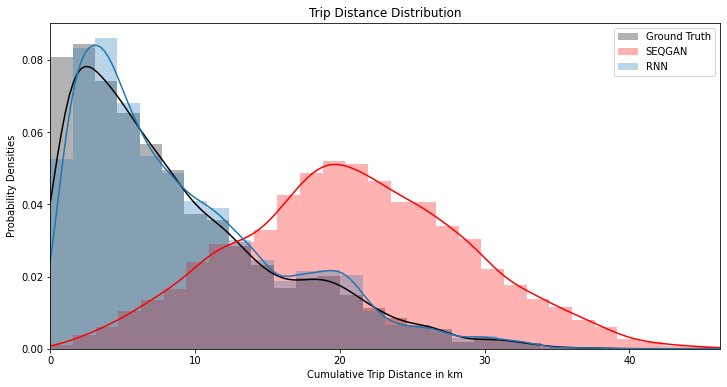

In [1169]:
from matplotlib.ticker import PercentFormatter


anchor= real2.distance.max()*100

beingsaved=plt.figure(figsize=(12,6))
title ='Trip Distance Distribution'

plt.xlabel('Disaaaatance')
plt.ylabel('Probability Densities')
plt.title(title)
plt.xlim(0,anchor)


ax=sns.distplot(real2.distance*100,bins=30,hist_kws=dict(alpha=0.3),label='Ground Truth',norm_hist=False,color='black')
ax=sns.distplot(ctseq.distance*100,bins=30,hist_kws=dict(alpha=0.3),label='SEQGAN',norm_hist=False,color='red')
ax=sns.distplot(saf.distance*100,bins=30,hist_kws=dict(alpha=0.3),label='RNN',norm_hist=False)
#sns.distplot(syn_data['distance'],bins=30,hist_kws=dict(alpha=0.3),label='fake',norm_hist=True,color='orange')


plt.xlabel("Cumulative Trip Distance in km")

#plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
beingsaved.savefig('/Users/erensmacbook/Downloads/beingsaved.eps', format='eps', dpi=1000)

plt.legend()
plt.show()


/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level func

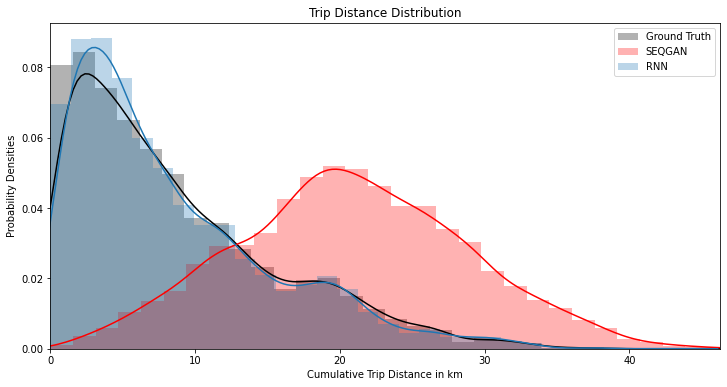

In [1229]:
from matplotlib.ticker import PercentFormatter


anchor= real2.distance.max()*100

beingsaved=plt.figure(figsize=(12,6))
title ='Trip Distance Distribution'

plt.xlabel('Disaaaatance')
plt.ylabel('Probability Densities')
plt.title(title)
plt.xlim(0,anchor)


ax=sns.distplot(real2.distance*100,bins=30,hist_kws=dict(alpha=0.3),label='Ground Truth',norm_hist=False,color='black')
ax=sns.distplot(ctseq.distance*100,bins=30,hist_kws=dict(alpha=0.3),label='SEQGAN',norm_hist=False,color='red')
ax=sns.distplot(hung_non_r.distance*100,bins=30,hist_kws=dict(alpha=0.3),label='RNN',norm_hist=False)
#sns.distplot(syn_data['distance'],bins=30,hist_kws=dict(alpha=0.3),label='fake',norm_hist=True,color='orange')


plt.xlabel("Cumulative Trip Distance in km")

#plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
beingsaved.savefig('/Users/erensmacbook/Downloads/beingsaved.eps', format='eps', dpi=1000)

plt.legend()
plt.show()


In [1150]:
from matplotlib.ticker import PercentFormatter


anchor= real2.dist.max()*100

beingsaved=plt.figure(figsize=(12,6))
title ='Trip Distance Distribution'

plt.xlabel('Disaaaatance')
plt.ylabel('Probability Densities')
plt.title(title)
plt.xlim(0,anchor)


ax=sns.distplot(real2.cum_dist*100,bins=30,hist_kws=dict(alpha=0.3),label='Ground Truth',norm_hist=False,color='black')
ax=sns.distplot(ctseq[ctseq.cum_dist <10].cum_dist*100,bins=30,hist_kws=dict(alpha=0.3),label='SEQGAN',norm_hist=False,color='red')
ax=sns.distplot(son2512.cum_dist*100,bins=30,hist_kws=dict(alpha=0.3),label='RNN',norm_hist=False)
#sns.distplot(syn_data['distance'],bins=30,hist_kws=dict(alpha=0.3),label='fake',norm_hist=True,color='orange')


plt.xlabel("Cumulative Trip Distance in km")

#plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
beingsaved.savefig('/Users/erensmacbook/Downloads/beingsaved.eps', format='eps', dpi=1000)

plt.legend()
plt.show()


AttributeError: 'DataFrame' object has no attribute 'cum_dist'

In [1154]:
real2

0               int64
1               int64
2               int64
3               int64
INDUSTRY       object
geo_0          object
geo_1          object
geo_2          object
geo_3          object
xo_0          float64
yo_0          float64
xo_1          float64
yo_1          float64
xo_2          float64
yo_2          float64
xo_3          float64
yo_3          float64
pt_0           object
pt_1           object
pt_2           object
pt_3           object
distance01    float64
distance02    float64
distance03    float64
d_point        object
o_point        object
orig_sa         int64
dtype: object

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


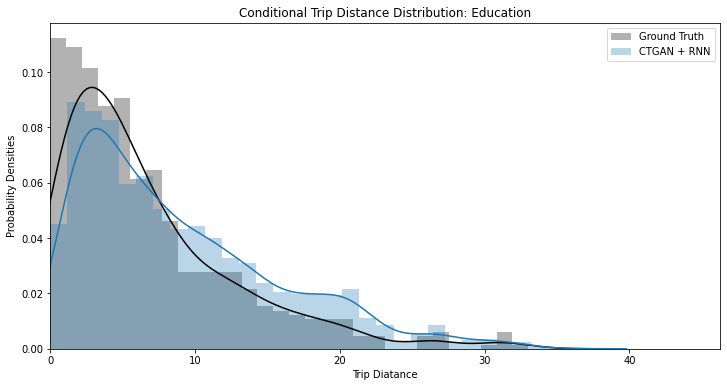

In [1177]:
from matplotlib.ticker import PercentFormatter


anchor= real2.distance.max()*100

plt.figure(figsize=(12,6))
title ='Conditional Trip Distance Distribution: Education'

plt.xlabel('Disaaaatance')
plt.ylabel('Probability Densities')
plt.title(title)
plt.xlim(0,anchor)


ax=sns.distplot(real2[real2.INDUSTRY=='education'].distance*100,bins=30,hist_kws=dict(alpha=0.3),label='Ground Truth',norm_hist=False,color='black')
ax=sns.distplot(saf[saf.INDUSTRY=='education'].distance*100,bins=30,hist_kws=dict(alpha=0.3),label='CTGAN + RNN',norm_hist=False)


plt.xlabel("Trip Diatance")

#plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.legend()
plt.show()


In [638]:
real2[real2.INDUSTRY=='education'].distance

18      0.122496
26      0.129527
32      0.071647
56      0.136988
60      0.027906
          ...   
5298    0.023388
5304    0.044130
5319    0.074828
5348    0.096824
5354    0.036650
Name: distance, Length: 591, dtype: float64

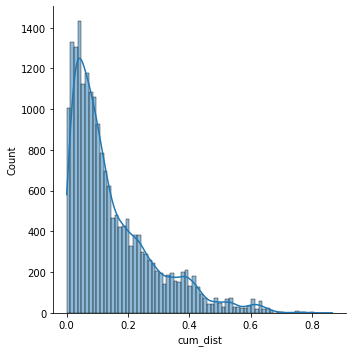

In [584]:
#sns.distplot(ctseq.cum_dist,bins=30,hist_kws=dict(alpha=0.3),label='SEQGAN',norm_hist=True,color='red')
#sns.distplot(real2.cum_dist,bins=30,hist_kws=dict(alpha=0.3),label='Real sample',norm_hist=True)
#sns.displot(data=real2, x="cum_dist",kind="kde")
sns.displot(data=hungarian200k, x="cum_dist",kde=True)

#real2.cum_dist

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


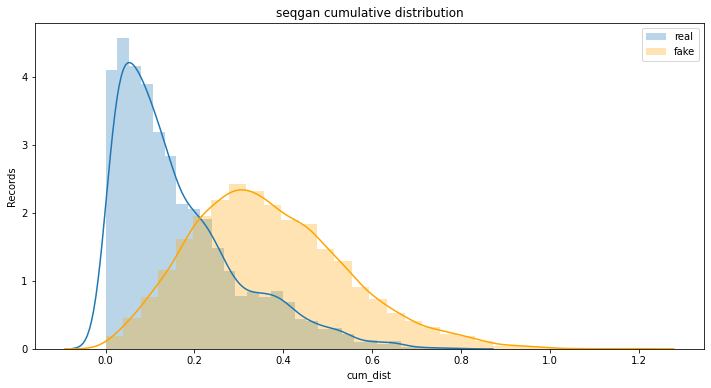

In [687]:
plot_distance_cum(real2,seqgan[seqgan.cum_dist <10],'seqgan cumulative distribution')

30102101107    14
30101100314    14
30203103603    13
30304107016    12
30504113230    10
               ..
30403109719     1
30403109706     1
30503111913     1
30102101232     1
30302105612     1
Name: 0, Length: 290, dtype: int64

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


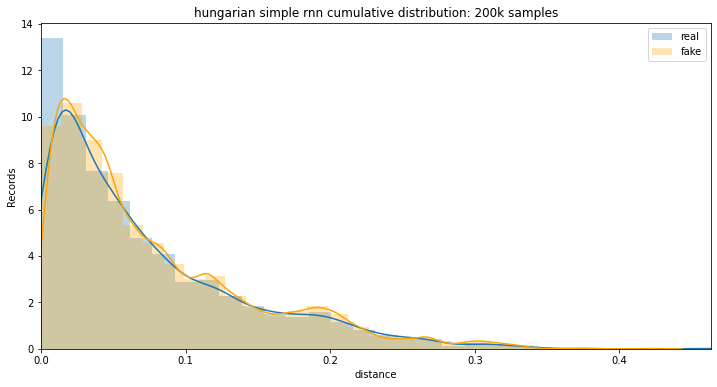

In [878]:
plot_distance_c(real1,dikkat,'hungarian simple rnn cumulative distribution: 200k samples')

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


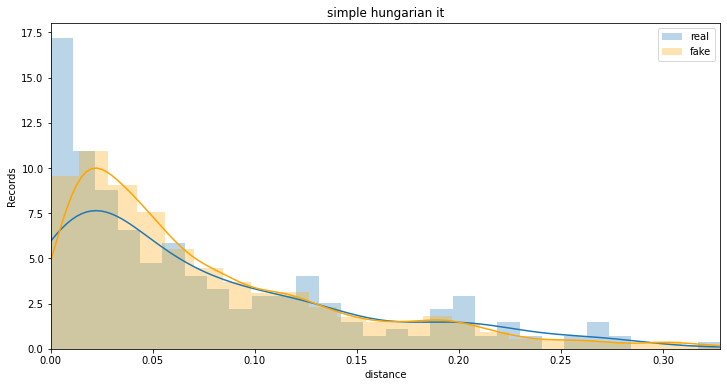

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


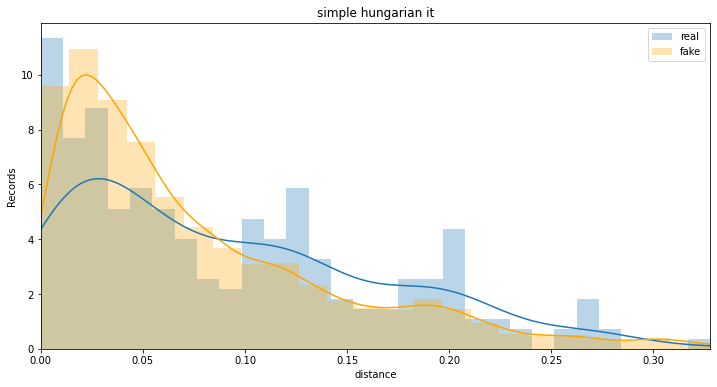

In [867]:
industry='it'
plot_distance_c(real1[real1.INDUSTRY ==industry],dikkat[dikkat.INDUSTRY == industry],'simple hungarian it')
plot_distance_c(real2[real2.INDUSTRY ==industry],dikkat[dikkat.INDUSTRY == industry],'simple hungarian it')




/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


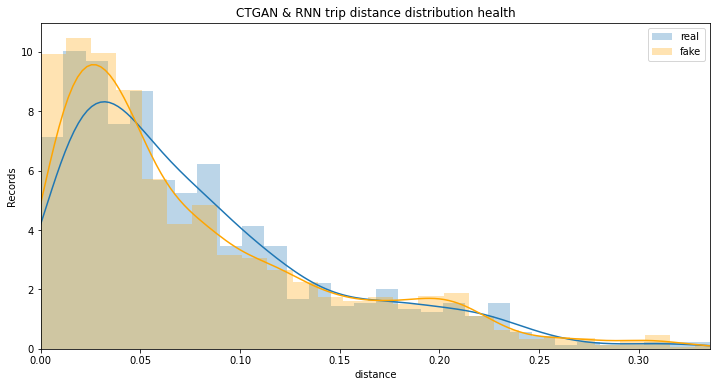

In [626]:
industry= 'health'

plot_distance_c(real2[real2.INDUSTRY ==industry],hungarian200k[hungarian200k.INDUSTRY == industry],'CTGAN & RNN trip distance distribution ' + industry)
#plot_distance_c(real2[real2.INDUSTRY ==industry ],gpt_samples[gpt_samples.INDUSTRY == industry],'GPT/unmatched trip distance distribution ' +industry)

#plot_distance_c(real2[real2.INDUSTRY ==industry ],control_match12k[control_match12k.INDUSTRY == industry],'hngr down')
#plot_distance_c(real2[real2.INDUSTRY ==industry ],merged_gpt[merged_gpt.INDUSTRY == industry],'cond gpt after match it')


/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


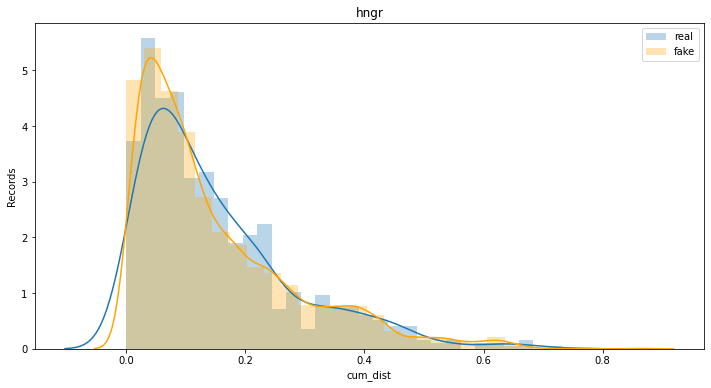

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


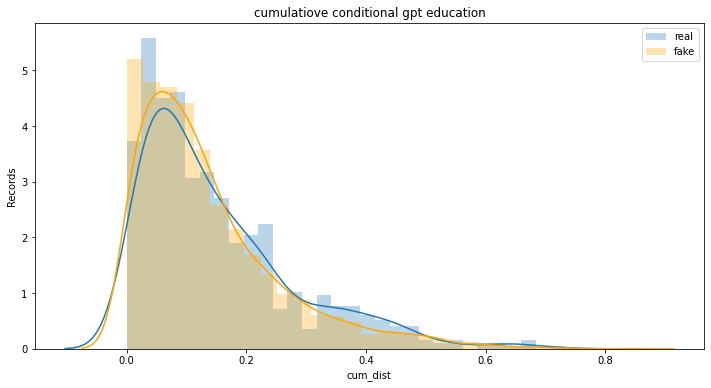

In [1650]:
industry= 'health'

plot_distance_cum(real2[real2.INDUSTRY ==industry],dikkat[dikkat.INDUSTRY == industry],'hngr'),
#plot_distance_cum(real2[real2.INDUSTRY ==industry ],control_match12k[control_match12k.INDUSTRY == industry],'cumulative: simple hungarian education')
plot_distance_cum(real2[real2.INDUSTRY ==industry ],gpt_samples[gpt_samples.INDUSTRY == industry],'cumulatiove conditional gpt education')
#plot_distance_cum(real2[real2.INDUSTRY ==industry ],merged_gpt[merged_gpt.INDUSTRY == industry],'cumulative: matched conditional gpt education')

#plot_distance_cum(real2[real2.INDUSTRY ==industry ],control_match[control_match.INDUSTRY == industry],'hngr down')


In [286]:
real2.orig_sa2.value_counts()

301011004    366
301011001    335
301011003    225
301011006    206
301021012    174
            ... 
305031120      1
303011050      1
305021116      1
301031019      1
305031122      1
Name: orig_sa2, Length: 133, dtype: int64

In [902]:
gpt_samples.groupby(['distance']).size() /



,0.0,0.0009804277000906,0.0014913517747493,0.0017467515661318,0.0018254111865555,0.0018575348139516,0.0018992330215768,0.0023234863169655,0.0023275001260699,0.0023895044286435,...,index,level_0,xo_0,xo_1,xo_2,xo_3,yo_0,yo_1,yo_2,yo_3
distance,,,,,,,,,,,,,,,,,,,,,
0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0.000980,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0.001491,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0.001747,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0.001825,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0.360551,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0.368722,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0.379030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [168]:
'''h1,r1=sa_corr('financial')
h2,r2=sa_corr('it')
h3,r3=sa_corr('education')
h4,r4=sa_corr('health')
h5,r5=sa_corr('retail')
h6,r6=sa_corr('other')
h7,r7=sa_corr('construction')
h8,r8=sa_corr('admin')
h9,r9=sa_corr('arts')
h10,r10=sa_corr('transport')
h11,r11=sa_corr('manufacturing')
h12,r12=sa_corr('professional')
h13,r13=sa_corr('publicAdmin')
h14,r14=sa_corr('utilities')
h15,r15=sa_corr('accom')
h16,r16=sa_corr('mining')
h17,r17=sa_corr('wholesale')
h18,r18=sa_corr('realEstate')
h19,r19=sa_corr('agriculture')


acc1= h1+h2+h3+h4+h5 +h6 + h7 +h8 +h9 +h10 + h11 + h12 +h13 +h14 +h15 +h16 +h17+h18 + h19
acc2= r1+r2+r3+r4+r5 +r6 + r7 +r8 + r9 + r10 +r11 + r12 +r13 +r14 +r15 +r16 +r17+r18+r19
#rms1 = mean_squared_error(acc1,acc2, squared=False)
#print(rms1/statistics.mean(acc2))
pearson=scipy.stats.pearsonr(acc1,acc2)
r_value=r2_score(acc1,acc2)
#c_value = chisquare(acc1,acc2)
rms1 = mean_squared_error(acc1,acc2)
m1=rms1/mean(acc2)


print(pearson)
print(r_value)
#print(c_value)
print(m1)
print(sum(rel_entr(acc1,acc2))) '''
#print(kl_div(acc1, acc2))  


"h1,r1=sa_corr('financial')\nh2,r2=sa_corr('it')\nh3,r3=sa_corr('education')\nh4,r4=sa_corr('health')\nh5,r5=sa_corr('retail')\nh6,r6=sa_corr('other')\nh7,r7=sa_corr('construction')\nh8,r8=sa_corr('admin')\nh9,r9=sa_corr('arts')\nh10,r10=sa_corr('transport')\nh11,r11=sa_corr('manufacturing')\nh12,r12=sa_corr('professional')\nh13,r13=sa_corr('publicAdmin')\nh14,r14=sa_corr('utilities')\nh15,r15=sa_corr('accom')\nh16,r16=sa_corr('mining')\nh17,r17=sa_corr('wholesale')\nh18,r18=sa_corr('realEstate')\nh19,r19=sa_corr('agriculture')\n\n\nacc1= h1+h2+h3+h4+h5 +h6 + h7 +h8 +h9 +h10 + h11 + h12 +h13 +h14 +h15 +h16 +h17+h18 + h19\nacc2= r1+r2+r3+r4+r5 +r6 + r7 +r8 + r9 + r10 +r11 + r12 +r13 +r14 +r15 +r16 +r17+r18+r19\n#rms1 = mean_squared_error(acc1,acc2, squared=False)\n#print(rms1/statistics.mean(acc2))\npearson=scipy.stats.pearsonr(acc1,acc2)\nr_value=r2_score(acc1,acc2)\n#c_value = chisquare(acc1,acc2)\nrms1 = mean_squared_error(acc1,acc2)\nm1=rms1/mean(acc2)\n\n\nprint(pearson)\nprint(r_v

In [169]:
#control_gan= pd.read_csv('/Users/erensmacbook/Downloads/data5c.csv',index_col=0)

In [917]:
def plot_distance_s(train_data_1,syn_data):    
    
    anchor= train_data_1.distance.max()
    plt.figure(figsize=(12,6))
    plt.xlim(0,round(anchor,3))

    plt.xlabel('Distance')
    plt.ylabel('Records')
    #plt.title(title)

    sns.scatterplot(train_data_1['distance'],label='real')
    sns.scatterplot(syn_data['distance'],label='fake',color='orange')

    plt.legend()
    plt.show()

In [648]:
#sns.scatterplot(data=real1, x="distance", y="distance")
#sns.scatterplot(data=real2, x="distance", y="distance")
#sns.scatterplot(x=real1['distance'], y=real2['distance'])


In [646]:
#sns.scatterplot(x=bbb, y=ccc)


In [608]:
#fig = plt.figure()3
#ax1 = fig.add_subplot(121)
#n, bins, patches = ax1.hist(real1.distance, bins=15)  # output is two arrays

#fig2 = plt.figure()
#ax2 = fig2.add_subplot(121)
#n2, bins2, patches2 = ax2.hist(real2.distance, bins=15)  


#sectors_dist=[]
#sectors_dist2=[]
#binsiz=60

#n, bins, patches = ax1.hist(real1.distance, bins=binsiz)  # output is two arrays
#sectors_dist.append(n/n.sum())
    
#n, bins, patches = ax1.hist(ctseq.distance, bins=binsiz)  # output is two arrays
#sectors_dist2.append(n/n.sum())



In [659]:
indices=ctseq.INDUSTRY.unique()
sectors_dist=[]
sectors_dist2=[]
binsiz=30

for i in indices:
    n, bins, patches = ax1.hist(real2[real2.INDUSTRY==i].distance, bins=binsiz)  # output is two arrays
    sectors_dist.append(n/n.sum())
    
    n, bins, patches = ax1.hist(hungarian200k[hungarian200k.INDUSTRY==i].distance, bins=binsiz)  # output is two arrays
    sectors_dist2.append(n/n.sum())



In [650]:
r1=list(np.concatenate(sectors_dist).flat)
r2=list(np.concatenate(sectors_dist2).flat)



In [683]:
len(r2)

570

In [662]:
#plt.plot(sectors_dist2[0], color='magenta', marker='o',mfc='pink' ) #plot the data
#indices

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or m

/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/erensmacbook/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or m

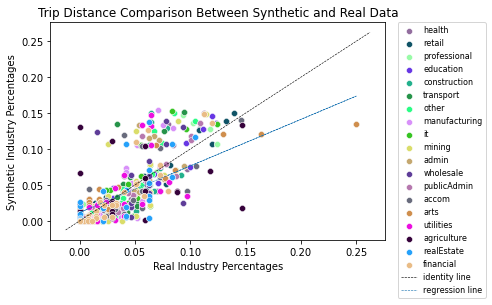

In [655]:
import random 

colorful1=np.array_split(r1, 19)
colorful2=np.array_split(r2, 19)

number_of_colors = 19

colora = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
             for i in range(number_of_colors)]

for i in range(19):
    sns.scatterplot(colorful1[i],colorful2[i],color=colora[i],label=indices[i])
    sns.scatterplot(colorful1[i],colorful2[i],color=colora[i])

xpoints = ypoints = plt.xlim()
plt.plot(xpoints, ypoints, linestyle='--', color='k', lw=0.6, scalex=True, scaley=True,label='identity line')

plt.plot(np.array(r1), m*np.array(r1) + b, linestyle='--', lw=0.6,label='regression line')


plt.title('Trip Distance Comparison Between Synthetic and Real Data')
plt.xlabel('Real Industry Percentages')
plt.ylabel('Synthetic Industry Percentages')

plt.legend(
    loc="lower center", # "upper center" puts it below the line
    ncol=3,
    bbox_to_anchor=(0.85, 0.15),
    bbox_transform=fig.transFigure,
    fontsize=6
);

plt.legend(bbox_to_anchor=(1.3, 1), loc=1, borderaxespad=0,fontsize=8)


In [652]:
from numpy.polynomial.polynomial import polyfit
x = np.arange(10)
y = 5 * x - 10

# Fit with polyfit
b, m = polyfit(r2, r1, 1)

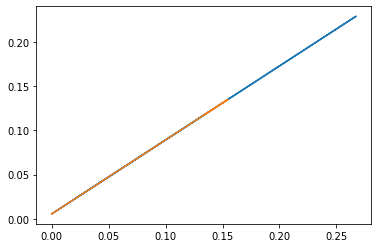

In [538]:
plt.plot(np.array(r1), m*np.array(r1) + b)
plt.plot(np.array(r2), m*np.array(r2) + b)


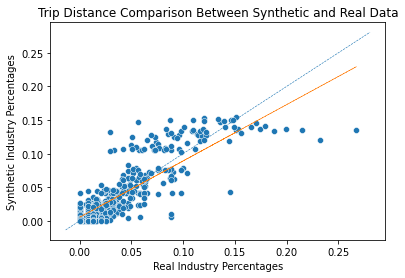

In [544]:
sns.scatterplot(x=r1, y=r2)
xpoints = ypoints = plt.xlim()
plt.plot(xpoints, ypoints, linestyle='--', lw=0.6, scalex=True, scaley=True)
plt.title('Trip Distance Comparison Between Synthetic and Real Data')
plt.xlabel('Real Industry Percentages')
plt.ylabel('Synthetic Industry Percentages')

plt.plot(np.array(r1), m*np.array(r1) + b, linestyle='--', lw=0.6)


In [244]:
import scipy
from scipy.stats import chisquare
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import statistics
from statistics import mean
from scipy.special import rel_entr, kl_div

In [252]:
distr=r1
disth=r2


pearson=scipy.stats.pearsonr(distr,disth)
r_value=r2_score(distr,disth)
c_value = chisquare(distr,disth)
rms1 = mean_squared_error(distr,disth)
m1=rms1/mean(distr)


print(pearson)
print(r_value)
print(c_value)
print(m1)
sum(rel_entr(distr,disth)) #kl divergince

from sklearn.linear_model import LinearRegression
model1 = LinearRegression(fit_intercept=False).fit(
                                np.array(disth).reshape((-1, 1)), 
                               np.array(distr).reshape((-1, 1))  )

slope, intercept, r2 = model1.coef_[0], model1.intercept_, model1.score(np.array(disth).reshape((-1, 1)), 
                               np.array(distr).reshape((-1, 1)))
print(f'R^2: {r2:.4f}')

#print(f'slope: {slope:.4f}')
print(f'intercept: {intercept:.4f}')
print(f"slope x : {model1.intercept_},{model1.coef_}")
r_sq = model1.score(np.array(disth).reshape((-1, 1)),
                               np.array(distr).reshape((-1, 1)))
print(f"coefficient of determination: {r_sq}")


#sum(rel_entr(distr,disth)) #kl divergince


(-0.2564588303194033, 0.171311155783428)
-0.558784391938175
Power_divergenceResult(statistic=32.41083875930973, pvalue=0.30213255855093607)
0.1161402849794443
R^2: -0.3158
intercept: 0.0000
slope x : 0.0,[[0.4239452]]
coefficient of determination: -0.3157588981065287


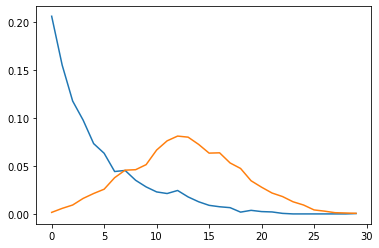

In [259]:
plt.plot(distr[0:11130])
plt.plot(disth[0:13110])

In [283]:
'''
n, bins, patches = ax1.hist(real1[real1.INDUSTRY=='financial'].distance, bins=binsiz)  # output is two arrays
distr=n/n.sum()
n, bins, patches = ax1.hist(gpt_samples[gpt_samples.INDUSTRY=='financial'].distance, bins=binsiz)  # output is two arrays
disth=n/n.sum()'''


df2 = pd.DataFrame()
df2['samp']=distr
df2['hungarian']=disth
df2=df2[(df2 != 0).all(1)]
df2[~(df2.samp !=0)& (df2.hungarian !=0)]
#df2['samp'].replace(to_replace = 0, value = 0.000001 ,inplace=True)
#df2['hungarian'].replace(to_replace = 0, value = 0.000001, inplace=True)

#print(chi2_contingency(df2))
#print(sum(rel_entr(df2['samp'],df2['hungarian'])))
#sum(scipy.special.kl_div(df2['samp'],df2['hungarian']))

,samp,hungarian


In [2104]:
df2

,samp,hungarian
0,0.119675,0.137266
1,0.087221,0.150715
2,0.085193,0.128882
3,0.073022,0.105904
4,0.066937,0.073397
...,...,...
560,0.020833,0.006266
561,0.020833,0.003133
565,0.020833,0.004386
567,0.020833,0.001880


In [1404]:
indices=real2.INDUSTRY.unique()
sectors_dist_az=[]
sectors_dist2_az=[]
sectors_gpt_az=[]

for i in indices:
    pcts=(real2[real2.INDUSTRY==i].distance.sum())/(real2.distance.sum())
    sectors_dist_az.append(pcts)

for i in indices:
    pcts=(dikkat[dikkat.INDUSTRY==i].distance.sum())/(dikkat.distance.sum())
    sectors_dist2_az.append(pcts) 
    
for i in indices:
    pcts=(gpt_samples[gpt_samples.INDUSTRY==i].distance.sum())/(gpt_samples.distance.sum())
    sectors_gpt_az.append(pcts) 

Text(0.5, 1.0, 'Industry/Total distance percentages')

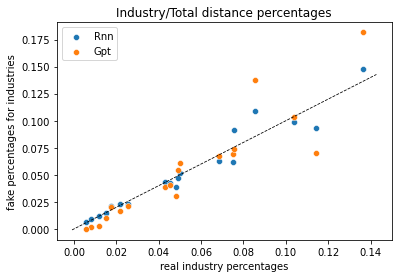

In [1436]:
sns.scatterplot(x=sectors_dist_az, y=sectors_dist2_az,label='Rnn')
sns.scatterplot(x=sectors_dist_az, y=sectors_gpt_az,label='Gpt')
plt.xlabel('real industry percentages')
plt.ylabel('fake percentages for industries')


xpoints = ypoints = plt.xlim()
plt.plot(xpoints, ypoints, linestyle='--', color='k', lw=0.8, scalex=True, scaley=True)

plt.title('Industry/Total distance percentages')

In [1724]:
indices=real2.INDUSTRY.unique()
ind_geo= real2.dest_sa2.unique()
sectors_dist=[]
sectors_dist2=[]
sectors_gpt=[]

for k in ind_geo:
    print(k)
    for i in indices:
        pcts=(real2[(real2.INDUSTRY==i) & (real2.dest_sa2==k) ].distance.sum())/(real2.distance.sum())
        sectors_dist.append(pcts)

    for i in indices:
        pcts=(dikkat[(dikkat.INDUSTRY==i) & (dikkat.dest_sa2==k) ].distance.sum())/(dikkat.distance.sum())
        sectors_dist2.append(pcts) 
    
    for i in indices:
        pcts=(gpt_samples[(gpt_samples.INDUSTRY==i) & (gpt_samples.dest_sa2==k) ].distance.sum())/(gpt_samples.distance.sum())
        sectors_gpt.append(pcts) 

305011105
305021114
301031016
303031060
303031065
301031019
303011048
301031015
301031021
301031018
305011110
305041135
301031014
301031020
305011109
305011112
303021058
305031128
303051076
305031124
305041134
302031036
301021007
301021013
301021011
301021008
304031097
301021009
303041067
305011106
303051074
305041133
301011003
305011108
301011004
304031096
305041132
304041103
302031038
305031130
304041098
305031131
303011047
303031063
303041070
303061080
302021028
305041137
301011001
305011111
303021053
302031037
305031125
302031039
304011083
304011082
303041069
304021091
304031094
302011026
305031119
304041101
305021117
305021113
301011006
302021032
303031062
303021059
305021115
305041136
302021027
301031017
305021118
303031066
302011025
302041042
302011024
303011051
301011002
303011049
302031040
304041100
303051073
301011005
303021055
303041071
303021054
303021052
304031092
305031126
303061077
304031095
304011085
302021034
304041104
302021030
304031093
304021090
303061078
303031061


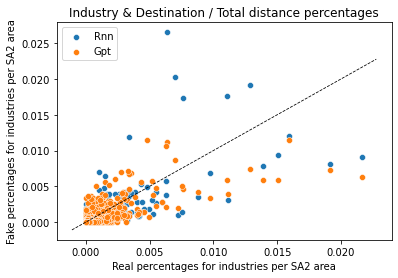

In [1636]:
sns.scatterplot(x=sectors_dist, y=sectors_dist2,label='Rnn')
sns.scatterplot(x=sectors_dist, y=sectors_gpt,label='Gpt')

plt.xlabel('Real percentages for industries per SA2 area')
plt.ylabel('Fake percentages for industries per SA2 area')
plt.title('Industry & Destination / Total distance percentages')

xpoints = ypoints = plt.xlim()
plt.plot(xpoints, ypoints, linestyle='--', color='k', lw=0.8, scalex=True, scaley=True)

In [44]:
import scipy
from scipy.stats import mannwhitneyu
from scipy.stats import pearsonr
from scipy.stats import chisquare


In [1585]:
pearson=scipy.stats.pearsonr(sectors_dist_az, sectors_dist2_az)
r_value=r2_score(sectors_gpt_az, sectors_dist_az)
c_value = chisquare(sectors_gpt_az, sectors_dist_az)

rms1 = mean_squared_error(sectors_gpt, sectors_dist)
m1=rms1/mean(sectors_dist2)


print(pearson)
print(r_value)
print(c_value)
print(m1)
sum(rel_entr(sectors_dist2_az, sectors_dist_az)) #kl divergince




(0.969253127372159, 8.715740468917155e-12)
0.8183838847522079
Power_divergenceResult(statistic=0.09730128052984958, pvalue=1.0)


In [1635]:
pearson=scipy.stats.pearsonr(sectors_dist2_az, sectors_dist_az)
r_value=r2_score(sectors_dist2_az, sectors_dist_az)
c_value = chisquare(sectors_dist2_az, sectors_dist_az)


print(pearson)
print(r_value)
print(c_value)

(0.969253127372159, 8.715740468917155e-12)
0.9394515427647975
Power_divergenceResult(statistic=0.020527720634977334, pvalue=1.0)


In [1630]:
from sklearn.metrics import mean_squared_error
from statistics import mean
  


rms1 = mean_squared_error(sectors_gpt, sectors_dist)
m1=rms1/mean(sectors_dist2)
m1

0.001707842427143085

In [1674]:
seqgan.to_csv('/Users/erensmacbook/Downloads/seqsamples.csv')

In [1684]:
from scipy.special import rel_entr

sum(rel_entr(sectors_dist2_az, sectors_dist_az))

0.010136778917860328

In [1883]:
df2 = pd.DataFrame()
df2['samp']=sectors_dist
df2['hungarian']=sectors_dist2
df2=df2[(df2 != 0).all(1)]
#df2[~(df2.samp !=0)& (df2.hungarian !=0)]

chi2_contingency(df2)
sum(rel_entr(df2['samp'],df2['hungarian']))

0.5218911334917412

In [1884]:
df2

,samp,hungarian
0,0.003874,0.004257
1,0.019108,0.008124
2,0.012891,0.019092
3,0.011059,0.017659
4,0.013906,0.007876
...,...,...
2585,0.000312,0.000011
2588,0.000625,0.000052
2592,0.000316,0.000173
2596,0.000351,0.000150


In [1864]:
chisquare(final_list,final_list2)

Power_divergenceResult(statistic=31451.734842797952, pvalue=0.0)

In [1886]:
chi2_contingency(df2)

(0.30461055674810145,
 1.0,
 1376,
 array([[0.0043379 , 0.0037933 ],
        [0.01452796, 0.01270406],
        [0.01706241, 0.01492034],
        ...,
        [0.00026065, 0.00022793],
        [0.00026687, 0.00023337],
        [0.00016933, 0.00014807]]))